# Introduction
This notebook analyses the relationship of measures against COVID-19 (Coronavirus disease 2019) and the number of infected cases. The goal is to find measures that enable us to settle the situation more quickly.

We will use SIR-F model that is a customized ODE model derived from SIR model. To evaluate the effect of measures, parameter estimation of SIR-F will be applied to subsets of time series data in each country. Parameter change points will be determined by S-R trend analysis. The details will be explained in "Method" part.

** To accerate open data science of COVID-19, I published the code as a package in [GitHub page: COVID-19 data with SIR model](https://github.com/lisphilar/covid19-sir). It may be useful when you apply the models to the data in your country. Quick usage is explained in README.md of this repository. If you find errors and ideas, please kindly tell me by comment on this notebook or pull request in GitHub.**

1. Preparation
   * [Dataset and tools](#1)
   * [Grouping by growth factor](#2)

2. Method
   * [SIR to SIR-F](#4)
   * [SIR-F with exposed/waiting cases](#5)
   * [Factors of model parameters](#6)
   * [S-R trend analysis](#10)

3. Scenario analysis
   * [Scenario in Italy](#7)
   * [Scenario in Japan](#8)

4. Monitoring
   * [Scenario in India](#12)
   * [Scenario in USA](#14)
   * [Scenario in New Zealand](#15)
 
5. Additional Analysis
   * [Further Analysis](#13)

5. Remarks
   * [Conclusion](#9)
   * [Acknowledgement](#3)
   * [Change log](#11)

Note:  
"Infected" means the currently infected and confirmed cases.  
This can be calculated  as "Confirmed" - "Deaths" - "Recovered" in [COVID-19 Data Repository by CSSE at Johns Hopkins University](https://github.com/CSSEGISandData/COVID-19).

In [1]:
from datetime import datetime
time_format = "%d%b%Y %H:%M" #%b is basic format
datetime.now().strftime(time_format) #str format of time

'13Aug2020 22:54'

## Updates
 * 13Feb2020-06May2020: (Please read [Change log](#11) subsection.)
 
 * 09May2020: Published the functions as a Python package
 * 30May2020: Finished refactoring of codes in the package
 * 17Jun2020: Released version 2.2.0 of CovsirPhy and ODE simulation will be done with tau-free dataset (time step [-] and ODE variables [persons])
 * 17Jun2020: Restricted tau value [min] as to the divisors of 1440 [min]


# Dataset and tools<a id="1"></a>

## Package

### Package for SIR analysis
I published a Python package [Covsirphy](https://github.com/lisphilar/covid19-sir) for this analysis in GitHub.

In [2]:
#import sys
#!{sys.executable} -m pip install numpy==1.18.2
#!pip install covsirphy --upgrade

In [3]:
!pip install "git+https://github.com/lisphilar/covid19-sir.git#egg=covsirphy"

In [4]:
import covsirphy as cs
#cs.__version__

### General packages

In [5]:
from collections import defaultdict
from datetime import timedelta
from dateutil.relativedelta import relativedelta
import functools
from IPython.display import display, Markdown
import math
import os
from pprint import pprint
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
from matplotlib.ticker import ScalarFormatter
%matplotlib inline
import numpy as np
import pandas as pd
import dask.dataframe as dd
pd.plotting.register_matplotlib_converters()
import seaborn as sns
import scipy as sci
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import sympy as sym
import seaborn as sns 

In [6]:
# Ramdam
np.random.seed(123)
os.environ["PYTHONHASHSEED"] = "123"
# Matplotlib
plt.style.use("seaborn-ticks")
plt.rcParams["xtick.direction"] = "in"
plt.rcParams["ytick.direction"] = "in"
plt.rcParams["font.size"] = 11.0
plt.rcParams["figure.figsize"] = (9, 6)
# Pandas
pd.set_option("display.max_colwidth", 1000)

## List of dataset

In [7]:
for dirname, _, filenames in os.walk("covid19-sir"):
    for filename in filenames:
        print(os.path.join(dirname, filename))

C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\COVID-19 data with SIR model.ipynb
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\Covid19 Data Analysis for effective distribution of vaccines.pptx
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\Covid19_project.ipynb
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\Untitled.ipynb
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\.git\COMMIT_EDITMSG
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\.git\config
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\.git\description
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\.git\HEAD
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\.git\index
C:/Users/sonal/OneDrive/Desktop/Covid19_project/COVID19_data_with_SIR_model\.git\hooks\applypatch-msg.sample

## Total population

In [8]:
pop_d = pd.read_csv(
    "covid19-global-forecasting-locations-population/locations_population.csv"
)
pop_d.head()

,Province.State,Country.Region,Population,Provenance
0,NaN,Afghanistan,35530000,NaN
1,NaN,Albania,2877000,NaN
2,NaN,Algeria,41320000,NaN
3,NaN,Andorra,78000,NaN
4,NaN,Antigua and Barbuda,102012,NaN


In [9]:
#import covsirphy as cs
pop_data = cs.Population("covid19-global-forecasting-locations-population/locations_population.csv") #generally it is pd.read_csv
pop_data.cleaned().head()

,Country,Province,Population
0,Afghanistan,-,35530000
1,Albania,-,2877000
2,Algeria,-,41320000
3,Andorra,-,78000
4,Antigua and Barbuda,-,102012


## Population pyramid

In [10]:
pyramid_csv_list = list()
for dirname, _, filenames in os.walk("population-pyramid-2019/"):
    for filename in filenames:
        name = os.path.join(dirname, filename)
        df = pd.read_csv(name)
        df["Country"], df["Year"], _ = filename.replace(".", "-").split("-")
        pyramid_csv_list.append(df)
pyramid_raw = pd.concat(pyramid_csv_list, sort=True)
pyramid_raw.head()

,Age,Country,F,M,Year
0,0-4,Canada,965981,1013876,2019
1,5-9,Canada,967470,1012761,2019
2,10-14,Canada,961187,1006817,2019
3,15-19,Canada,978597,1027473,2019
4,20-24,Canada,1176141,1231211,2019


In [11]:
pyramid_raw["Country"].unique()

array(['Canada', 'China', 'France', 'Germany', 'India', 'Iran', 'Italy',
       'Japan', 'Spain', 'United Kingdom', 'United States of America'],
      dtype=object)

In [12]:
df = pyramid_raw.copy()
df["Country"] = df["Country"].replace(
    {
        "United States of America": "US",
        "United Kingdom": "UK",
    }
)
# Global (WORLD)
_male = [
    349432556, 342927576, 331497486, 316642222, 308286775, 306059387, 309236984,
    276447037, 249389688, 241232876, 222609691, 192215395, 157180267, 128939392,
    87185982, 54754941, 33648953, 15756942, 5327866, 1077791, 124144
]
_female = [
    328509234, 321511867, 309769906, 295553758, 289100903, 288632766, 296293748,
    268371754, 244399176, 238133281, 223162982, 195633743, 164961323, 140704320,
    101491347, 69026831, 48281201, 26429329, 11352182, 3055845, 449279
]
_df = pd.DataFrame(
    {
        "Age": df["Age"].unique(),
        "Country": "Global",
        "F": _female,
        "M": _male,
        "Year": 2019
    }
)
df = pd.concat([df, _df], axis=0, ignore_index=True, sort=True)
# Sweden
_male = [
    307116, 304759, 296771, 270840, 291723, 376952, 343311, 315086,
    312017, 336452, 342117, 306949, 279609, 265511, 273061, 195029,
    113166, 61775, 26170, 6768, 415
]
_female = [
    290553, 288817, 280944, 257677, 274760, 361526, 330153, 300752,
    301288, 327453, 331458, 300084, 280009, 272149, 286879, 212480,
    143654, 97633, 52624, 18130, 1771
]
_df = pd.DataFrame(
    {
        "Age": df["Age"].unique(),
        "Country": "Sweden",
        "F": _female,
        "M": _male,
        "Year": 2019
    }
)
df = pd.concat([df, _df], axis=0, ignore_index=True, sort=True)
# Philippines
_male = [
    5534962, 5820604, 5538414, 5383822, 5149849, 4710777, 4061897, 3581091, 3237426,
    2832825, 2482953, 2015857, 1556935, 1082875, 668107, 364200, 199400, 73508,
    17327, 3035, 208
]
_female = [
    5240508, 5541514, 5273495, 5029137, 4896316, 4589506, 3982681,
    3544279, 3191565, 2825286, 2521463, 2112380, 1714689, 1285782,
    895866, 567282, 360751, 155294, 57969, 13376, 1411
]
_df = pd.DataFrame(
    {
        "Age": df["Age"].unique(),
        "Country": "Philippines",
        "F": _female,
        "M": _male,
        "Year": 2019
    }
)
df = pd.concat([df, _df], axis=0, ignore_index=True, sort=True)
# Arrange
df["Population"] = df["F"] + df["M"]
df = df.pivot_table(
    index="Age", columns=["Country"], values="Population", aggfunc="last"
)
df = df.astype(np.int64).reset_index().rename({"Age": "Age_bin"}, axis=1)
series = df["Age_bin"].str.replace("+", "-122")
df[["Age_first", "Age_last"]] = series.str.split("-", expand=True).astype(np.int64)
df = df.drop("Age_bin", axis=1)
series = df["Age_last"]
df = df.apply(lambda x: x[:-2] / (x[-1] - x[-2] + 1), axis=1)
df["Age"] = series
df = pd.merge(df, pd.DataFrame({"Age": np.arange(0, 123, 1)}), on="Age", how="right", sort=True)
df = df.fillna(method="bfill").astype(np.int64)
df = df.set_index("Age")
pyramid_df = df.copy()
pyramid_df

,Canada,China,France,Germany,Global,India,Iran,Italy,Japan,Philippines,Spain,Sweden,UK,US
Age,,,,,,,,,,,,,,
0,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
1,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
2,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
3,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
4,395971,17008206,733844,797488,135588358,23356364,1516560,476509,981106,2155094,403236,119533,790209,3920819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,352,2949,808,769,24931,1947,21,694,3182,70,535,95,667,3910
119,352,2949,808,769,24931,1947,21,694,3182,70,535,95,667,3910
120,352,2949,808,769,24931,1947,21,694,3182,70,535,95,667,3910


## The number of days go out (template data)
**As a comment of this notebook, @marcoferrante estimated the number of days persons of each age group usually go out. Thank you for your kind cooperation!!**

In [13]:
# @marcoferrante estimation
_period_of_life_list = [
    "nursery", "nursery school", "elementary school", "middle school",
    "high school", "university/work", "work", "work", "work", "work",
    "retired", "retired", "retired"
]
df = pd.DataFrame(
    {
        "Age_first": [0, 3, 6, 11, 14, 19, 26, 36, 46, 56, 66, 76, 86],
        "Age_last": [2, 5, 10, 13, 18, 25, 35, 45, 55, 65, 75, 85, 95],
        "Period_of_life": _period_of_life_list,
        "Days": [3, 5, 6, 6, 7, 7, 6, 5, 5, 5, 4, 3, 2]
    }
)
# Adjustment by author
df["Types"] = df["Period_of_life"].replace(
    {
        "nursery": "school",
        "nursery school": "school",
        "elementary school": "school",
        "middle school": "school",
        "high school": "school",
        "university/work": "school/work"
    }
)
df["School"] = df[["Types", "Days"]].apply(lambda x: x[1] if "school" in x[0] else 0, axis=1)
df["Office"] = df[["Types", "Days"]].apply(lambda x: x[1] if "work" in x[0] else 0, axis=1)
df["Others"] = df["Days"] - df[["School", "Office"]].sum(axis=1)
df.loc[df["Others"] < 0, "Others"] = 0
df.loc[df.index[1:5], "School"] -= 1
df.loc[df.index[1:5], "Others"] += 1
df.loc[df.index[5], ["School", "Office", "Others"]] = [3, 3, 1]
df[["School", "Office", "Others"]] = df[["Days", "School", "Office", "Others"]].apply(
    lambda x: x[1:] / sum(x[1:]) * x[0], axis=1
).astype(np.int64)
df.loc[df.index[6:10], "Others"] += 1
df = df.drop(["Days", "Types"], axis=1)
# Show dataset
_out_df = df.copy()
_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others
0,0,2,nursery,3,0,0
1,3,5,nursery school,4,0,1
2,6,10,elementary school,5,0,1
3,11,13,middle school,5,0,1
4,14,18,high school,6,0,1
5,19,25,university/work,3,3,1
6,26,35,work,0,6,1
7,36,45,work,0,5,1
8,46,55,work,0,5,1
9,56,65,work,0,5,1


For each country, population pyramid data will be combined to the table. The columns with country names are the portion of the total population.

In [14]:
df = pyramid_df.cumsum()
countries = df.columns[:]
df = pd.merge(_out_df, df, left_on="Age_last", right_on="Age", how="left")
_first = df.loc[df.index[0], countries]
df[countries] = df[countries].diff()
df.loc[df.index[0], countries] = _first
df[countries] = df[countries].apply(lambda x: x / x.sum(), axis=0)
out_df = df.copy()
out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Canada,China,France,Germany,Global,India,Iran,Italy,Japan,Philippines,Spain,Sweden,UK,US
0,0,2,nursery,3,0,0,0.031811,0.035600,0.033901,0.028711,0.052210,0.051289,0.054879,0.023674,0.023292,0.059807,0.025943,0.035809,0.035174,0.035813
1,3,5,nursery school,4,0,1,0.031813,0.035809,0.034727,0.028115,0.051864,0.051752,0.052977,0.024795,0.024166,0.060893,0.027265,0.035727,0.035658,0.036229
2,6,10,elementary school,5,0,1,0.052963,0.059984,0.060787,0.045016,0.084689,0.088830,0.080195,0.045552,0.043395,0.104088,0.050480,0.058956,0.060363,0.062293
3,11,13,middle school,5,0,1,0.031621,0.035035,0.036844,0.027347,0.049386,0.055770,0.043894,0.028506,0.026526,0.060010,0.031812,0.034614,0.034583,0.038632
4,14,18,high school,6,0,1,0.053517,0.057906,0.059948,0.048961,0.079324,0.092191,0.067379,0.047546,0.045251,0.097064,0.048522,0.053759,0.055262,0.064638
5,19,25,university/work,3,3,1,0.089688,0.087912,0.080317,0.076269,0.107659,0.124634,0.099528,0.068986,0.066696,0.129404,0.068295,0.081871,0.085452,0.095708
6,26,35,work,0,6,1,0.141335,0.160417,0.119402,0.124868,0.152774,0.164456,0.192333,0.110560,0.106875,0.156425,0.113973,0.138543,0.136443,0.139912
7,36,45,work,0,5,1,0.133597,0.140662,0.124751,0.123987,0.131630,0.135250,0.163720,0.137011,0.134815,0.122671,0.162583,0.123699,0.129938,0.125441
8,46,55,work,0,5,1,0.132237,0.166102,0.134609,0.150438,0.116396,0.103354,0.110998,0.161104,0.142129,0.095804,0.158071,0.132422,0.134289,0.125788
9,56,65,work,0,5,1,0.137679,0.116123,0.124850,0.143657,0.088096,0.074217,0.075731,0.135972,0.123395,0.065197,0.128555,0.115113,0.119465,0.125640


In [15]:
def go_out(country, out_df=out_df):
    """
    Return the estimated number of days people usually go out.
    @country <str>: coutry name
    @out_df <pd.DataFrame>: template dataframe
    """
    df = out_df.copy()
    try:
        series = df[country]
    except KeyError:
        raise KeyError(f"Population pyramid data of {country} is not defined!")
    df = df.iloc[:, :6]
    df["Portion"] = series
    return df

In [16]:
go_out("Global")

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,nursery,3,0,0,0.052210
1,3,5,nursery school,4,0,1,0.051864
2,6,10,elementary school,5,0,1,0.084689
3,11,13,middle school,5,0,1,0.049386
4,14,18,high school,6,0,1,0.079324
5,19,25,university/work,3,3,1,0.107659
6,26,35,work,0,6,1,0.152774
7,36,45,work,0,5,1,0.131630
8,46,55,work,0,5,1,0.116396
9,56,65,work,0,5,1,0.088096


## The number of cases

### JHU dataset

In [17]:
jhu_data = cs.JHUData("novel-corona-virus-2019-dataset/covid_19_data.csv")
ncov_df = jhu_data.cleaned()
ncov_df.tail()

,Date,Country,Province,Confirmed,Infected,Fatal,Recovered
48090,2020-06-22,Mexico,Zacatecas,706,189,75,442
48091,2020-06-22,Ukraine,Zakarpattia Oblast,2188,1289,57,842
48092,2020-06-22,Ukraine,Zaporizhia Oblast,555,148,16,391
48093,2020-06-22,China,Zhejiang,1269,1,1,1267
48094,2020-06-22,Ukraine,Zhytomyr Oblast,1270,614,23,633


In [18]:
jhu_first_date, jhu_last_date = ncov_df["Date"].min(), ncov_df["Date"].max()
jhu_elapsed = (jhu_last_date - jhu_first_date).days
print(f"{jhu_elapsed} days have passed from the date of the first record.")

152 days have passed from the date of the first record.


### Japan-specific dataset

In [19]:
jpn_data = cs.CountryData("covid19-dataset-in-japan/covid_jpn_total.csv", country="Japan")
jpn_data.set_variables(
    date="Date", confirmed="Positive", fatal="Fatal", recovered="Discharged", province=None
)
jpn_data.cleaned().head()

,Date,Country,Province,Confirmed,Infected,Fatal,Recovered
0,2020-02-06,Japan,-,25,21,0,4
1,2020-02-07,Japan,-,25,21,0,4
2,2020-02-10,Japan,-,26,17,0,9
3,2020-02-12,Japan,-,28,18,0,10
4,2020-02-13,Japan,-,29,18,0,11


### Replacement of JHU data in Japan with government-announced records

In [20]:
jhu_data.replace(jpn_data)
ncov_df = jhu_data.cleaned()
ncov_df.tail()

,Date,Country,Province,Confirmed,Infected,Fatal,Recovered
128,2020-06-18,Japan,-,17668,803,935,15930
129,2020-06-19,Japan,-,17710,767,935,16008
130,2020-06-20,Japan,-,17799,770,952,16077
131,2020-06-21,Japan,-,17864,803,953,16108
132,2020-06-22,Japan,-,17916,830,953,16133


## Visualize total data

In [21]:
data_cols = ["Infected", "Fatal", "Recovered"]
rate_cols = ["Fatal per Confirmed", "Recovered per Confirmed", "Fatal per (Fatal or Recovered)"]

In [22]:
total_df = jhu_data.total()
total_df = total_df.loc[total_df.index <= jhu_last_date, :]
total_df.tail()

,Confirmed,Infected,Fatal,Recovered,Fatal per Confirmed,Recovered per Confirmed,Fatal per (Fatal or Recovered)
Date,,,,,,,
2020-06-18,8489057,3879796,453985,4155276,0.053479,0.489486,0.098494
2020-06-19,8665038,3959095,460002,4245941,0.053087,0.490008,0.097749
2020-06-20,8791878,3949032,464462,4378384,0.052829,0.498003,0.095907
2020-06-21,8955620,4040011,468363,4447246,0.052298,0.496587,0.095281
2020-06-22,9098737,4100059,472169,4526509,0.051894,0.497488,0.094459


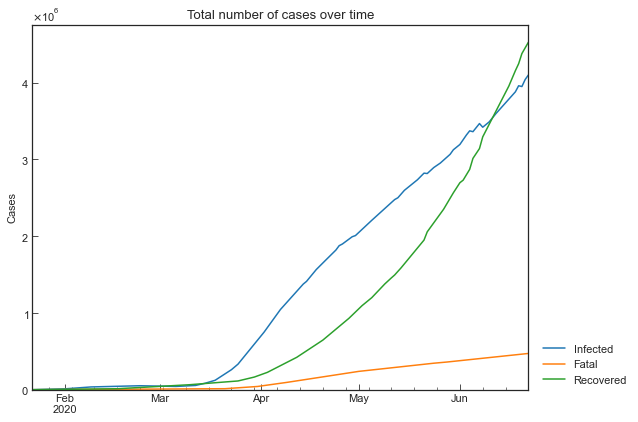

In [23]:
cs.line_plot(total_df[data_cols], "Total number of cases over time")

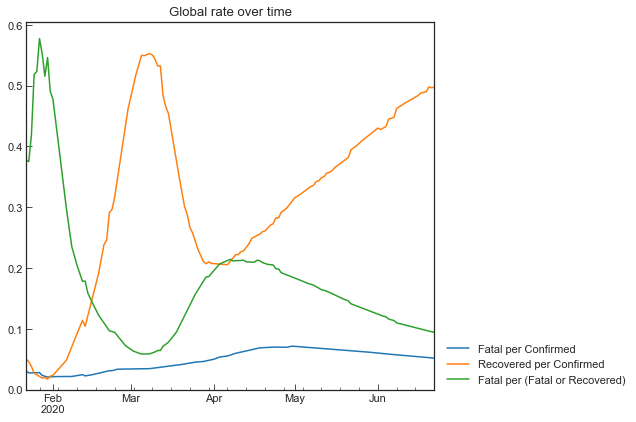

In [24]:
cs.line_plot(total_df[rate_cols], "Global rate over time", ylabel="", math_scale=False)

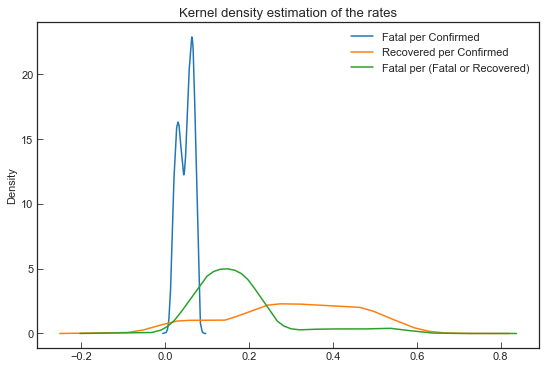

In [25]:
total_df[rate_cols].plot.kde()
plt.title("Kernel density estimation of the rates")
plt.show()

In [26]:
total_df[rate_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
Fatal per Confirmed,153.0,0.048792,0.016921,0.020424,0.034012,0.053479,0.064421,0.071656
Recovered per Confirmed,153.0,0.307344,0.149901,0.017267,0.211066,0.319235,0.430264,0.552893
Fatal per (Fatal or Recovered),153.0,0.175969,0.109055,0.057462,0.106366,0.155440,0.205132,0.577465


## Data cleaning: Linelist (COVID19_open_line_list.csv)

In [27]:
linelist_open_raw = pd.read_csv("novel-corona-virus-2019-dataset/COVID19_open_line_list.csv")
linelist_open_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14126 entries, 0 to 14125
Data columns (total 45 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        13173 non-null  float64
 1   age                       1349 non-null   object 
 2   sex                       1264 non-null   object 
 3   city                      10194 non-null  object 
 4   province                  12906 non-null  object 
 5   country                   13148 non-null  object 
 6   wuhan(0)_not_wuhan(1)     13170 non-null  float64
 7   latitude                  13147 non-null  float64
 8   longitude                 13147 non-null  float64
 9   geo_resolution            13147 non-null  object 
 10  date_onset_symptoms       746 non-null    object 
 11  date_admission_hospital   730 non-null    object 
 12  date_confirmation         13089 non-null  object 
 13  symptoms                  493 non-null    object 
 14  lives_

In [28]:
df = linelist_open_raw.loc[:, ~linelist_open_raw.columns.str.startswith("Unnamed:")]
df = df.dropna(axis=0, how="all")
df = df.drop(
    [
        # Unnecessary in this notebook
        "ID", "wuhan(0)_not_wuhan(1)", "admin3", "admin2", "admin1", "country_new", "admin_id",
        "data_moderator_initials", "source", "location", "lives_in_Wuhan", "notes_for_discussion",
        "sequence_available", "reported_market_exposure",
        # Maybe useful, but un-used
        "city", "latitude", "longitude", "geo_resolution", "additional_information",
        "travel_history_dates", "travel_history_location", 
    ],
    axis=1
)
# Personal
age = linelist_open_raw["age"].str.split("-", expand=True)
age[0] = pd.to_numeric(age[0], errors="coerce")
age[1] = pd.to_numeric(age[1], errors="coerce")
df["Age"] = age.mean(axis=1)
df["Age"] = df["Age"].fillna(df["Age"].median()).astype(np.int64)
df["Sex"] = df["sex"].fillna("-").str.replace("4000", "-").str.capitalize()
# Place
df["Country"] = df["country"].fillna("-")
df["Province"] = df["province"].fillna("-")
# Onset Date
series = df["date_onset_symptoms"].str.replace("end of December 2019", "31.12.2019").replace("-25.02.2020", "25.02.2020")
series = series.replace("20.02.220", "20.02.2020").replace("none", np.NaN).replace("10.01.2020 - 22.01.2020", np.NaN)
df["Onset_date"] = pd.to_datetime(series)
# Hospitalized date
series = df["date_admission_hospital"].replace("18.01.2020 - 23.01.2020", np.NaN)
df["Hospitalized_date"] = pd.to_datetime(series)
# Confirmed date
series = df["date_confirmation"].replace("25.02.2020-26.02.2020", np.NaN)
df["Confirmed_date"] = pd.to_datetime(series)
# Symptoms/events
df["Symptoms"] = df["symptoms"].fillna("-").str.lower()
# Underlying disease
df["Underlying_disease"] = df[["chronic_disease_binary", "chronic_disease"]].apply(
    lambda x: "No" if x[0] == 0 else x[1] if x[1] is not np.NaN else "-",
    axis=1
).str.strip(";").str.replace("; ", ",").str.replace(", ", ",")
# Outcome
df["Outcome"] = df["outcome"].replace(
    {
        "discharge": "discharged", "Discharged": "discharged", "death": "died",
        "critical condition, intubated as of 14.02.2020": "severe",
        "treated in an intensive care unit (14.02.2020)": "severe", "05.02.2020": "-",
        "Symptoms only improved with cough. Currently hospitalized for follow-up.": "stable"
    }
).fillna("-")
series = df["date_death_or_discharge"].replace("discharge", np.NaN)
df["Closed_date"] = pd.to_datetime(series)
# Show
use_cols = [
    "Age", "Sex", "Country", "Province", "Onset_date", "Hospitalized_date", "Confirmed_date", 
    "Symptoms", "Underlying_disease", "Outcome", "Closed_date"
]
open_linelist_df = df.loc[:, use_cols]
open_linelist_df.head()

,Age,Sex,Country,Province,Onset_date,Hospitalized_date,Confirmed_date,Symptoms,Underlying_disease,Outcome,Closed_date
0,30,Male,China,Anhui,2020-01-18,2020-01-20,2020-01-22,-,-,-,NaT
1,47,Male,China,Anhui,2020-10-01,2020-01-21,2020-01-23,-,-,-,NaT
2,49,Male,China,Anhui,2020-01-15,2020-01-20,2020-01-23,-,-,-,NaT
3,47,Female,China,Anhui,2020-01-17,2020-01-20,2020-01-23,-,-,-,NaT
4,50,Female,China,Anhui,2020-10-01,2020-01-21,2020-01-23,-,-,-,NaT


## Data cleaning: Linelist (COVID19_line_list_data.csv)
Linelist in clinical trials is a list of many case reports.

In [29]:
linelist_raw = pd.read_csv("novel-corona-virus-2019-dataset/COVID19_line_list_data.csv")
linelist_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1085 entries, 0 to 1084
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     1085 non-null   int64  
 1   case_in_country        888 non-null    float64
 2   reporting date         1084 non-null   object 
 3   Unnamed: 3             0 non-null      float64
 4   summary                1080 non-null   object 
 5   location               1085 non-null   object 
 6   country                1085 non-null   object 
 7   gender                 902 non-null    object 
 8   age                    843 non-null    float64
 9   symptom_onset          563 non-null    object 
 10  If_onset_approximated  560 non-null    float64
 11  hosp_visit_date        507 non-null    object 
 12  exposure_start         128 non-null    object 
 13  exposure_end           341 non-null    object 
 14  visiting Wuhan         1085 non-null   int64  
 15  from

In [30]:
linelist_raw.head()

,id,case_in_country,reporting date,Unnamed: 3,summary,location,country,gender,age,symptom_onset,...,recovered,symptom,source,link,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26
0,1,NaN,1/20/2020,NaN,"First confirmed imported COVID-19 pneumonia patient in Shenzhen (from Wuhan): male, 66, shenzheng residence, visited relatives in Wuhan on 12/29/2019, symptoms onset on 01/03/2020, returned to Shenzhen and seek medical care on 01/04/2020, hospitalized on 01/11/2020, sample sent to China CDC for testing on 01/18/2020, confirmed on 01/19/2020. 8 others under medical observation, contact tracing ongoing.","Shenzhen, Guangdong",China,male,66.0,01/03/20,...,0,NaN,Shenzhen Municipal Health Commission,http://wjw.sz.gov.cn/wzx/202001/t20200120_18987787.htm,NaN,NaN,NaN,NaN,NaN,NaN
1,2,NaN,1/20/2020,NaN,"First confirmed imported COVID-19 pneumonia patient in Shanghai (from Wuhan): female, 56, Wuhan residence, arrived in Shanghai from Wuhan on 01/12/2020, symptom onset and visited fever clinic on 01/15/2020, laboratory confirmed on 01/20/2020",Shanghai,China,female,56.0,1/15/2020,...,0,NaN,Official Weibo of Shanghai Municipal Health Commission,https://www.weibo.com/2372649470/IqogQhgfa?from=page_1001062372649470_profile&wvr=6&mod=weibotime&type=comment,NaN,NaN,NaN,NaN,NaN,NaN
2,3,NaN,1/21/2020,NaN,"First confirmed imported cases in Zhejiang: patient is male, 46, lives in Wuhan, self-driving from Wuhan to Hangzhou on 01/03/2020, symptom onset 01/04/2020, hospitalized on 01/17/2020, sample deliver to China CDC for testing on 01/20/2020, test positive on 01/21/2020.",Zhejiang,China,male,46.0,01/04/20,...,0,NaN,Health Commission of Zhejiang Province,http://www.zjwjw.gov.cn/art/2020/1/21/art_1202101_41786033.html,NaN,NaN,NaN,NaN,NaN,NaN
3,4,NaN,1/21/2020,NaN,"new confirmed imported COVID-19 pneumonia in Tianjin: female, age 60, recently visited Wuhan, visited fever clinic on 01/19/2020 in Tianjin then quarantined immediately.",Tianjin,China,female,60.0,NaN,...,0,NaN,人民日报官方微博,https://m.weibo.cn/status/4463235401268457?,NaN,NaN,NaN,NaN,NaN,NaN
4,5,NaN,1/21/2020,NaN,"new confirmed imported COVID-19 pneumonia in Tianjin: male, age 58, visited fever clinic on 01/14/2020.",Tianjin,China,male,58.0,NaN,...,0,NaN,人民日报官方微博,https://m.weibo.cn/status/4463235401268457?,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
df = linelist_raw.loc[:, ~linelist_raw.columns.str.startswith("Unnamed:")]
df = df.drop(["id", "case_in_country", "summary", "source", "link"], axis=1)
# Date
case_date_dict = {
    "reporting date": "Confirmed_date",
    "exposure_start": "Exposed_date",
    "exposure_end": "Quarantined_date",
    "hosp_visit_date": "Hospitalized_date",
    "symptom_onset": "Onset_date",
    "death": "Deaths_date",
    "recovered": "Recovered_date"    
}
df["death"] = df["death"].replace({"0": "", "1": ""})
df["recovered"] = df["recovered"].replace({"0": "", "1": "", "12/30/1899": "12/30/2019"})
for (col, _) in case_date_dict.items():
    df[col] = pd.to_datetime(df[col])
df = df.rename(case_date_dict, axis=1)
# Location
df["Country"] = df["country"].fillna("-")
df["Province"] = df["location"].fillna("-")
df["Province"] = df[["Country", "Province"]].apply(lambda x: "-" if x[0] == x[1] else x[1], axis=1)
# Personal
df["Gender"] = df["gender"].fillna("-").str.capitalize()
df["Age"] = df["age"].fillna(df["age"].median()).astype(np.int64) ## Fill in NA with median
df["From_Wuhan"] = df["from Wuhan"]
df["To_Wuhan"] = df["visiting Wuhan"]
# Medical
df["Events"] = df["symptom"].fillna("-")
# Order of columns
linelist_df = df.loc[
    :,
    [
        "Country", "Province",
        "Exposed_date", "Onset_date", "Hospitalized_date", "Confirmed_date", "Quarantined_date", "Deaths_date", "Recovered_date",
        "Events",
        "Gender", "Age", "From_Wuhan", "To_Wuhan"
    ]
]
linelist_df.tail()

,Country,Province,Exposed_date,Onset_date,Hospitalized_date,Confirmed_date,Quarantined_date,Deaths_date,Recovered_date,Events,Gender,Age,From_Wuhan,To_Wuhan
1080,Austria,Innsbruck,NaT,NaT,NaT,2020-02-25,NaT,NaT,NaT,-,-,24,0.0,0
1081,Afghanistan,-,NaT,NaT,NaT,2020-02-24,NaT,NaT,NaT,-,-,35,0.0,0
1082,Algeria,-,NaT,NaT,NaT,2020-02-26,2020-02-17,NaT,NaT,-,Male,51,0.0,0
1083,Croatia,-,2020-02-19,NaT,NaT,2020-02-25,2020-02-21,NaT,NaT,-,Male,51,0.0,0
1084,Switzerland,Bern,2020-02-15,2020-02-17,NaT,2020-02-25,2020-02-15,NaT,NaT,-,Male,70,0.0,0


In [32]:
linelist_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1085 entries, 0 to 1084
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Country            1085 non-null   object        
 1   Province           1085 non-null   object        
 2   Exposed_date       128 non-null    datetime64[ns]
 3   Onset_date         563 non-null    datetime64[ns]
 4   Hospitalized_date  507 non-null    datetime64[ns]
 5   Confirmed_date     1084 non-null   datetime64[ns]
 6   Quarantined_date   341 non-null    datetime64[ns]
 7   Deaths_date        21 non-null     datetime64[ns]
 8   Recovered_date     152 non-null    datetime64[ns]
 9   Events             1085 non-null   object        
 10  Gender             1085 non-null   object        
 11  Age                1085 non-null   int64         
 12  From_Wuhan         1081 non-null   float64       
 13  To_Wuhan           1085 non-null   int64         
dtypes: datet

In [33]:
linelist_df.describe(include="all").fillna("-")

,Country,Province,Exposed_date,Onset_date,Hospitalized_date,Confirmed_date,Quarantined_date,Deaths_date,Recovered_date,Events,Gender,Age,From_Wuhan,To_Wuhan
count,1085,1085,128,563,507,1084,341,21,152,1085,1085,1085,1081,1085
unique,38,135,37,62,58,43,50,12,30,109,3,-,-,-
top,China,-,2020-01-26 00:00:00,2020-01-23 00:00:00,2020-01-23 00:00:00,2020-02-27 00:00:00,2020-01-22 00:00:00,2020-02-23 00:00:00,2020-02-19 00:00:00,-,Male,-,-,-
freq,197,464,14,29,34,91,35,4,13,815,520,-,-,-
first,-,-,2019-12-17 00:00:00,2019-12-10 00:00:00,2019-12-27 00:00:00,2020-01-13 00:00:00,2020-01-02 00:00:00,2020-02-01 00:00:00,2019-12-30 00:00:00,-,-,-,-,-
last,-,-,2020-02-21 00:00:00,2020-02-26 00:00:00,2020-02-28 00:00:00,2020-02-28 00:00:00,2020-02-25 00:00:00,2020-02-28 00:00:00,2020-02-28 00:00:00,-,-,-,-,-
mean,-,-,-,-,-,-,-,-,-,-,-,49.8212,0.144311,0.176959
std,-,-,-,-,-,-,-,-,-,-,-,16.1036,0.351567,0.38181
min,-,-,-,-,-,-,-,-,-,-,-,0,0,0
25%,-,-,-,-,-,-,-,-,-,-,-,39,0,0


In [34]:
period_df = linelist_df.loc[:, ["Exposed_date", "Onset_date", "Confirmed_date"]]
period_df["Latent [min]"] = (period_df["Onset_date"] - period_df["Exposed_date"]).dt.total_seconds() / 60
period_df["Waiting [min]"] = (period_df["Confirmed_date"] - period_df["Onset_date"]).dt.total_seconds() / 60
period_df["Latent [day]"] = period_df["Latent [min]"] / 60 / 24
period_df["Waiting [day]"] = period_df["Waiting [min]"] / 60 / 24
period_df["Latent + Waiting [day]"] = period_df["Latent [day]"] + period_df["Waiting [day]"]
period_df.dropna(axis=0).tail()

,Exposed_date,Onset_date,Confirmed_date,Latent [min],Waiting [min],Latent [day],Waiting [day],Latent + Waiting [day]
948,2020-01-25,2020-02-24,2020-02-24,43200.0,0.0,30.0,0.0,30.0
949,2020-01-25,2020-02-04,2020-02-24,14400.0,28800.0,10.0,20.0,30.0
957,2020-01-25,2020-02-12,2020-02-26,25920.0,20160.0,18.0,14.0,32.0
958,2020-01-25,2020-02-17,2020-02-26,33120.0,12960.0,23.0,9.0,32.0
1084,2020-02-15,2020-02-17,2020-02-25,2880.0,11520.0,2.0,8.0,10.0


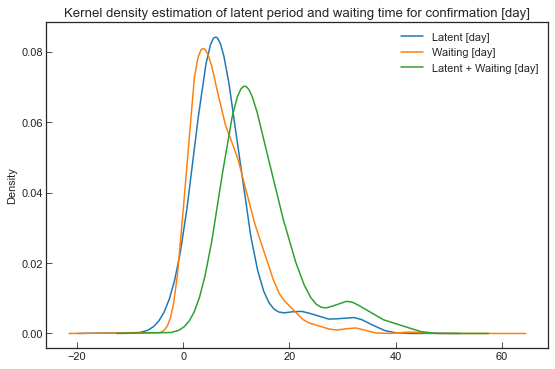

,count,mean,std,min,25%,50%,75%,max
Latent [day],83.0,8.180723,6.786185,-2.0,4.0,6.0,9.0,34.0
Waiting [day],563.0,7.682060,5.890473,0.0,3.0,6.0,11.0,43.0
Latent + Waiting [day],83.0,14.819277,7.305435,5.0,10.0,13.0,17.5,40.0


In [35]:
cols = ["Latent [day]", "Waiting [day]", "Latent + Waiting [day]"]
period_df[cols].plot.kde()
plt.title("Kernel density estimation of latent period and waiting time for confirmation [day]")
plt.show()
period_df[cols].describe().T

## Measures in each country

In [36]:
action_raw = dd.read_csv(
    "covid19-containment-and-mitigation-measures/COVID 19 Containment measures data.csv"
).compute()
action_raw.head()

,ID,Applies To,Country,Date Start,Date end intended,Description of measure implemented,Exceptions,Implementing City,Implementing State/Province,Keywords,Quantity,Source,Target city,Target country,Target region,Target state
0,163,NaN,Austria,"Mar 16, 2020",NaN,On 10 March 2020 government announced that all universities will close their classes at the latest by 16 March.,NaN,NaN,NaN,university closure,NaN,https://en.wikipedia.org/wiki/2020_coronavirus_pandemic_in_Austria,NaN,NaN,NaN,NaN
1,132,NaN,Germany,"Feb 01, 2020",NaN,"102 German citizens and 26 relatives, all of whom were symptom-free on departure, were evacuated from the Wuhan region to Frankfurt am Main by the Executive Transport Wing of the German Air Force. After their return, they were placed in quarantine in a military barrack in Rhineland-Palatinate for 14 days.[716] The coronavirus was found in two passengers on 2 February.",NaN,NaN,NaN,"international traveller quarantine - risk countries, traveller testing",0.0001,https://www.tagesschau.de/inland/coronavirus-germersheim-107.html,NaN,NaN,NaN,NaN
2,578,NaN,United Kingdom,"Mar 20, 2020",NaN,"All schools, nurseries and colleges closed.",NaN,NaN,NaN,"nursery school closure, school closure, university closure",NaN,https://www.theguardian.com/world/2020/mar/18/coronavirus-school-colleges-nurseries-england-close-uk-friday,NaN,NaN,NaN,NaN
3,372,NaN,United Kingdom,"Mar 16, 2020",NaN,"If one person in any household has a persistent cough or fever, everyone living there must stay at home for 14 days",NaN,NaN,NaN,blanket isolation - symptoms,NaN,https://www.bbc.com/news/uk-51920444,NaN,NaN,NaN,NaN
4,357,NaN,United Kingdom,"Mar 16, 2020",NaN,"By the weekend, those with the most serious health conditions must be ""largely shielded from social contact for around 12 weeks""",NaN,NaN,NaN,isolation advice to elderly,NaN,https://www.bbc.com/news/uk-51920444,NaN,NaN,NaN,NaN


In [37]:
df  = action_raw.copy()
df = df.rename(
    {
        "Description of measure implemented": "Details",
        "Implementing State/Province": "Province",
    },
    axis=1
)
# Country/Province
df["Country"] = df["Country"].replace({"United Kingdom": "UK"})
df["Country"] = df["Country"].str.replace("US: ", "US/").str.replace("US:", "US/")
df = df.loc[~df["Country"].isnull(), :]
df["Province"] = df["Province"].fillna("-")
df[["Country", "Province", "-"]] = (df["Country"] + "/" + df["Province"]).str.split("/", expand=True)
# Date
df["Start_date"] = pd.to_datetime(df["Date Start"])
df["End_date"] = pd.to_datetime(df["Date end intended"])
df = df.loc[~df["Start_date"].isnull(), :]
# Detail
df = df.loc[~df["Details"].isnull(), :]
df["Keywords"] = df["Keywords"].fillna("-")
df["Exceptions"] = df["Exceptions"].fillna("-")
# _df = df["Keywords"].str.split(", ", expand=True)
# df = pd.concat([df, _df], axis=1)
# Save
df = df.loc[:, ["Country", "Province", "Start_date", "End_date", "Keywords", "Details", "Exceptions"]]
df = df.sort_values(["Start_date", "End_date", "Country", "Province"])
action_df = df.copy()
action_df.head()

,Country,Province,Start_date,End_date,Keywords,Details,Exceptions
150,China,Hubei,2019-12-18,NaT,first case,Seven cases of COVID-19 documented in Wuhan,-
151,China,Hubei,2019-12-25,NaT,"compulsory isolation, confirmed case isolation",Medical staff in two Wuhan hospitals were suspected of contracting the virus; first reports of isolation being used,-
152,China,Hubei,2019-12-30,NaT,"case reporting, research, source tracing",Wuhan CDC confirmed 27 cases of viral pneumonia of unknown cause; all hospitals required to report all cases of unkown origin and related to Huanan Seafood Market and give patients proper treatment;,-
138,Hong Kong,-,2019-12-30,NaT,international traveller quarantine - risk countries,Hong Kong Secretary for Food and Health announced that suspected cases presenting with symptoms of pneumonia acute respiratory illness fever and a recent travel to Wuhan within the last 14 days would be put in isolation,-
149,Macau,-,2019-12-30,NaT,international traveller screening - all countries,Tightened inbound traveller screening,-


In [38]:
words = pd.Series(", ".join(action_df["Keywords"].tolist()).split(", ")).unique().tolist()
words

['first case',
 'compulsory isolation',
 'confirmed case isolation',
 'case reporting',
 'research',
 'source tracing',
 'international traveller quarantine - risk countries',
 'international traveller screening - all countries',
 'coronavirus education activities',
 'encouraging symptomatic people to seek tests',
 'international traveller screening - risk countries',
 'limited nonessential business suspension',
 'test travellers',
 'contacts traced total',
 'outbound travel warning',
 'public announcement',
 'special management arrangements',
 'task group',
 'hospital specialisation',
 'contact isolation - no symptoms',
 'contact tracing',
 'public mask and hygiene supply',
 'testing commenced',
 'international travel ban - risk countries',
 'international traveller screening - symptomatic',
 'general nonessential business suspension',
 'hygiene enforcement',
 'quarantine zone',
 'cluster isolation - no symptoms',
 'traveller testing',
 'wild animal ban',
 'phone line',
 'moves of med

In [39]:
vectorizer = TfidfVectorizer(use_idf=True)
vecs = vectorizer.fit_transform(words)
clusters = KMeans(n_clusters=20, random_state=0).fit_predict(vecs)
df = pd.DataFrame(
    {
        "Group": clusters,
        "Word": words
    }
)
df = df.sort_values("Group")
df = pd.DataFrame(df.groupby("Group")["Word"].apply(lambda x: ", ".join(x)))
df

,Word
Group,
0,"sentence, military takeover, symptom hotline, protective equipment supplies, elderly, prisons closed to visitors, riots, unemployment benefits extension, visa suspension, university closure, economic stimulus, retired doctors called, restaurant limitations, weddings canceled, phone based location tracing, event cancellation - other, nursery school closure, school closure, activism for stricter measures, eviction moratorium, army deployed, cash cleaning, financial incentive, indoor person density, sports cancellation, -, medical aid, quaratine violation, court cancellation, school closure - limited, community spread, intellectual property, low compliance, prohibition of medicine export, prisoner release, medical staff protective equipment, handwashing encouragement, sewing plain clothes masks, closure nonessential stores, emergency declaration, social distancing, deregulation, space minimum, economic incentives, airport closure, health declaration system, task group, special managem..."
1,"international traveller quarantine - risk countries, international traveller screening - all countries, international traveller screening - symptomatic, international traveller quarantine - all countries, international aid, international travel ban - risk countries, international travel ban - all countries, international traveller screening - risk countries"
2,"remote work - limited, remote schooling, mandated remote schooling, remote work, mandated remote work, remote schooling - limited"
3,"local case, imported case, first case, confirmed case isolation, case reporting, first death"
4,"cluster isolation - no symptoms, blanket curfew - no symptoms, blanket isolation - symptoms, contact isolation - symptoms, blanket isolation - no symptoms, contact isolation - no symptoms, cohort isolation - no symptoms"
5,"domestic travel ban, business resumed, domestic travel resumed, domestic traveller quarantine, domestic traveller screening, domestic travel limitation"
6,"testing planned, testing, expansion of testing facilities, new testing method commenced, end of testing, testing numbers total, traveller testing, testing commenced"
7,"indoor gatherings banned, outdoor gatherings banned"
8,"pharmaceutical treatment, hospital construction, speculative treatment, remote medical treatment - symptomatic, hospital specialisation, waste water treatment, hospital treatment, visiting in hospital banned, remote medical treatment"


## Measures in Italy

In [40]:
#!pip install xlrd

In [41]:
ita_action_raw = pd.read_excel(
    "covid19-prevention-in-italy/Dataset_Italy_COVID_19.xlsx",
    sheet_name="Foglio1"
)
ita_action_raw.head()

,Country,Region,Village,Start date,End Date,Action,Detail,Number of people,link
0,Italy,NaN,NaN,30-jan-2020,NaN,Restriction of entry,All flights to and from China have been suspended,NaN,http://www.governo.it/it/approfondimento/coronavirus/13968
1,Italy,NaN,NaN,03-feb-2020,NaN,Leave from epidemic area,Return of people present in countries at risk and return of foreign citizens to the countries of origin exposed to the risk,NaN,http://www.governo.it/it/approfondimento/coronavirus/13969
2,Italy,NaN,NaN,06-feb-2020,NaN,Control in the Airport,Airport monitoring and control for domestic and international flights,62000,http://www.governo.it/it/approfondimento/coronavirus/13970
3,Italy,NaN,NaN,21-feb-2020,21-feb-2020,Quaranteene,"Mandatory quarantine isolation for close contacts with a positive cases, and provides active surveillance with fiduciary home permanence for those who have been in risk areas in the last 14 days",NaN,http://www.governo.it/it/approfondimento/coronavirus/13971
4,Italy,"Lombardia,Veneto","Vo’ Euganeo (Veneto) e Codogno, Castiglione d’Adda, Casalpusterlengo, Fombio, Maleo, Somaglia, Bertonico, Terranova dei Passerini, Castelgerundo e San Fiorano (Lombardia)",23-feb-2020,NaN,containment and management the Italian infected areas,decree-law introducing urgent measures regarding the containment and management of the epidemiological emergency from COVID-2019.,53856‬,http://www.governo.it/it/approfondimento/coronavirus/13972


In [42]:
df = ita_action_raw.copy()
df = df.drop(["Country", "Village", "link"], axis=1)
df.columns = [col.capitalize().replace(" ", "_") for col in df.columns]
df["Start_date"] = pd.to_datetime(df["Start_date"])
df["End_date"] = pd.to_datetime(df["End_date"])
df["Region"] = df["Region"].fillna("-")
df["Number_of_people"] = df["Number_of_people"].fillna(-1)
ita_action_df = df.copy()
ita_action_df.tail()

,Region,Start_date,End_date,Action,Detail,Number_of_people
7,"Emilia Romagna,Friuli Venezia Giulia, Lombardia, Veneto, Piemonte e Liguria,",2020-03-07,2020-03-07,more containment and management the Italian infected areas,"prohibit any movement in Lombardy and in fourteen provinces of Veneto, Emilia Romagna, Piedmont, Marche.",-1
8,-,2020-03-09,2020-05-04,lockdown,people must stay at home and go out only for food or work needs. Many activities are closed and only the essential ones remain open.,60483973
9,-,2020-03-19,NaT,Medicine sperimentation,"testing began on the drug Tocilizumab, a drug used against rheumatoid arthritis that has had beneficial effects against COVID-19 in China.",330
10,-,2020-03-20,NaT,task force,create a task force of doctors from all over Italy to be able to send to the territories with the greatest health problems.,-1
11,-,2020-04-14,NaT,open some businesses,"Reopening of some production activities, newsagents, baby clothing stores, freelancers.",-1


## The number of cases in Japan at prefecture level

In [43]:
jpn_pref_raw = pd.read_csv("covid19-dataset-in-japan/covid_jpn_prefecture.csv")
jpn_pref_raw.tail()

,Date,Prefecture,Positive,Tested,Discharged,Fatal,Hosp_require,Hosp_severe
4507,2020-06-21,Kumamoto,48,4164.0,45.0,3.0,0.0,0.0
4508,2020-06-21,Oita,60,4592.0,59.0,1.0,0.0,0.0
4509,2020-06-21,Miyazaki,17,1509.0,17.0,0.0,0.0,0.0
4510,2020-06-21,Kagoshima,11,2452.0,10.0,0.0,1.0,0.0
4511,2020-06-21,Okinawa,142,2986.0,139.0,7.0,0.0,0.0


In [44]:
df = jpn_pref_raw.copy()
df.dropna(how="all", inplace=True)
df["Date"] = pd.to_datetime(df["Date"])
sel = df.columns.isin(["Date", "Prefecture"])
df = df.groupby("Prefecture").apply(
    lambda x: x.set_index("Date").resample("D").interpolate("linear")
)
df = df.fillna(0)
df = df.drop("Prefecture", axis=1).reset_index()
df = df.sort_values("Date").reset_index(drop=True)
sel = df.columns.isin(["Date", "Prefecture"])
df.loc[:, ~sel] = df.loc[:, ~sel].interpolate("linear").astype(np.int64)
jpn_pref_df = df.copy()
jpn_pref_df.tail()

,Prefecture,Date,Positive,Tested,Discharged,Fatal,Hosp_require,Hosp_severe
4507,Osaka,2020-06-21,1806,37550,1681,86,39,5
4508,Ibaraki,2020-06-21,170,5125,155,10,5,0
4509,Okinawa,2020-06-21,142,2986,139,7,0,0
4510,Okayama,2020-06-21,25,1863,25,0,0,0
4511,Yamanashi,2020-06-21,72,5175,69,1,2,0


## Metadata of prefectures in Japan

In [45]:
jpn_meta_raw = pd.read_csv("covid19-dataset-in-japan/covid_jpn_metadata.csv")
jpn_meta_raw.tail()

,Prefecture,Category,Item,Value,Date,Primary_source,Secondary_source
841,Kumamoto,Admin,Num,43,2012-04-27,http://nlftp.mlit.go.jp/ksj/gml/codelist/PrefCd.html,NaN
842,Oita,Admin,Num,44,2012-04-27,http://nlftp.mlit.go.jp/ksj/gml/codelist/PrefCd.html,NaN
843,Miyazaki,Admin,Num,45,2012-04-27,http://nlftp.mlit.go.jp/ksj/gml/codelist/PrefCd.html,NaN
844,Kagoshima,Admin,Num,46,2012-04-27,http://nlftp.mlit.go.jp/ksj/gml/codelist/PrefCd.html,NaN
845,Okinawa,Admin,Num,47,2012-04-27,http://nlftp.mlit.go.jp/ksj/gml/codelist/PrefCd.html,NaN


In [46]:
df = jpn_meta_raw.copy()
df["Title"] = df["Category"].str.cat(df["Item"], sep="_")
df = df.pivot_table(
    index="Prefecture", columns="Title", values="Value", aggfunc="last"
)
# Integer
cols = df.columns.str.startswith("Population")
cols += df.columns.str.startswith("Area")
cols += df.columns.str.startswith("Hospital_bed")
cols += df.columns.str.startswith("Clinic_bed")
df.loc[:, cols] = df.loc[:, cols].astype(np.int64)
df["Admin_Num"] = df["Admin_Num"].astype(np.int64)
# Numeric
cols = df.columns.str.startswith("Location")
df.loc[:, cols] = df.loc[:, cols].astype(np.float64)
# Sorting
df = df.loc[jpn_meta_raw["Prefecture"].unique(), :]
jpn_meta_df = df.copy()
jpn_meta_df.head()

Title,Admin_Captial,Admin_Num,Admin_Region,Area_Habitable,Area_Total,Clinic_bed_Care,Clinic_bed_Total,Hospital_bed_Care,Hospital_bed_Specific,Hospital_bed_Total,Hospital_bed_Tuberculosis,Hospital_bed_Type-I,Hospital_bed_Type-II,Location_Latitude,Location_Longitude,Population_Female,Population_Male,Population_Total
Prefecture,,,,,,,,,,,,,,,,,,
Hokkaido,Sapporo,1,Hokkaido,22373,83424,428,5585,20822,0,93050,153,2,92,43.065063,141.347644,2814,2506,5320
Aomori,Aomori,2,Tohoku,3230,9646,114,1906,2614,0,17075,33,1,28,40.824592,140.740031,678,600,1278
Iwate,Morioka,3,Tohoku,3714,15275,98,1255,2310,0,16557,91,2,36,39.703670,141.152717,651,604,1255
Miyagi,Sendai,4,Tohoku,3155,7282,91,1468,3431,0,25121,28,2,27,38.268915,140.872212,1188,1136,2323
Akita,Akita,5,Tohoku,3204,11638,77,721,2035,0,14627,44,2,30,39.718353,140.103416,528,468,996


# Grouping by growth factor<a id="2"></a>
The number of confirmed cases is increasing in many countries, but there are two types of countries. In a first-type country, growth factor is larger than 1 and the number of cases is rapidly increasing. In a second-type country, growth factor is less than 1.

## Calculate growth factor
Where $C$ is the number of confirmed cases,  
$$\mathrm{Growth\ Factor} = \cfrac{\Delta \mathrm{C}_{n}}{\Delta \mathrm{C}_{n-1}}$$

In [47]:
df = ncov_df.pivot_table(
    index="Date", columns="Country", values="Confirmed", aggfunc="sum"
).fillna(method="ffill").fillna(0)
# Growth factor: (delta Number_n) / (delta Number_n)
df = df.diff() / df.diff().shift(freq="D")
df = df.replace(np.inf, np.nan).fillna(1.0)
# Rolling mean (window: 7 days)
df = df.rolling(7).mean().dropna().loc[:ncov_df["Date"].max(), :]
# round: 0.01
growth_value_df = df.round(2)
growth_value_df.tail()

Country,Azerbaijan,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,...,Uzbekistan,Vatican City,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe,occupied Palestinian territory
Date,,,,,,,,,,,,,,,,,,,,,
2020-06-18,1.0,1.00,1.11,1.02,0.71,1.44,1.0,1.06,1.05,1.0,...,1.02,1.0,1.35,1.71,1.81,1.0,1.38,3.88,2.00,1.0
2020-06-19,1.0,0.95,1.12,1.01,0.57,1.17,1.0,1.07,0.99,1.0,...,1.17,1.0,1.39,1.71,1.91,1.0,1.39,4.24,1.91,1.0
2020-06-20,1.0,1.05,1.05,1.02,0.71,1.17,1.0,1.03,1.00,1.0,...,1.22,1.0,1.60,1.57,2.11,1.0,1.18,4.19,1.74,1.0
2020-06-21,1.0,0.99,1.07,1.04,0.71,1.39,1.0,1.04,1.01,1.0,...,1.17,1.0,1.27,1.71,2.04,1.0,2.04,4.33,1.59,1.0
2020-06-22,1.0,0.94,0.96,1.04,0.71,1.30,1.0,1.10,1.01,1.0,...,1.07,1.0,1.25,1.71,1.91,1.0,1.52,1.05,1.89,1.0


## Grouping countires based on growth factor
* Outbreaking: growth factor $>$ 1 for the last 7 days
* Stopping: growth factor $<$ 1 for the last 7 days
* At a crossroad: the others

In [48]:
df = growth_value_df.copy()
df = df.iloc[-7:, :].T
day_cols = df.columns.strftime("%d%b%Y")
df.columns = day_cols
last_date = day_cols[-1]
# Grouping
more_col, less_col = "GF > 1 [straight days]", "GF < 1 [straight days]"
df[more_col] = (growth_value_df > 1).iloc[::-1].cumprod().sum(axis=0)
df[less_col] = (growth_value_df < 1).iloc[::-1].cumprod().sum(axis=0)
df["Group"] = df[[more_col, less_col]].apply(
    lambda x: "Outbreaking" if x[0] >= 7 else "Stopping" if x[1] >= 7 else "Crossroad",
    axis=1
)
# Sorting
df = df.loc[:, ["Group", more_col, less_col, *day_cols]]
df = df.sort_values(["Group", more_col, less_col], ascending=False)
growth_df = df.copy()
growth_df.head()

Date,Group,GF > 1 [straight days],GF < 1 [straight days],16Jun2020,17Jun2020,18Jun2020,19Jun2020,20Jun2020,21Jun2020,22Jun2020
Country,,,,,,,,,,
Nicaragua,Stopping,0,63,0.86,0.86,0.86,0.86,0.86,0.86,0.86
Ecuador,Stopping,0,28,0.80,0.79,0.95,0.95,0.89,0.94,0.73
Guinea-Bissau,Stopping,0,27,0.71,0.71,0.71,0.71,0.71,0.71,0.71
Kosovo,Stopping,0,24,0.54,0.54,0.57,0.71,0.71,0.86,0.86
Burundi,Stopping,0,23,0.86,0.71,0.71,0.86,0.86,0.86,0.71


In [49]:
df = pd.merge(ncov_df, growth_df["Group"].reset_index(), on="Country")
ncov_df = df.loc[:, ["Date", "Group", *ncov_df.columns[1:]]]
ncov_df.tail()

,Date,Group,Country,Province,Confirmed,Infected,Fatal,Recovered
46848,2020-06-18,Outbreaking,Japan,-,17668,803,935,15930
46849,2020-06-19,Outbreaking,Japan,-,17710,767,935,16008
46850,2020-06-20,Outbreaking,Japan,-,17799,770,952,16077
46851,2020-06-21,Outbreaking,Japan,-,17864,803,953,16108
46852,2020-06-22,Outbreaking,Japan,-,17916,830,953,16133


## Group 1: Outbreaking, growth factor $>$ 1 for the last 7 days

In [50]:
df = growth_df.loc[growth_df["Group"] == "Outbreaking", :]
", ".join(df.index.tolist()) + "."

'South Africa, Rwanda, Luxembourg, Costa Rica, Greece, Israel, Moldova, Iraq, Lebanon, Malaysia, Mauritania, Paraguay, Togo, West Bank and Gaza, Yemen, Panama, Jordan, Nigeria, Bulgaria, Mexico, Suriname, Argentina, Eswatini, Zimbabwe, Austria, Chile, Romania, Lithuania, Sao Tome and Principe, Honduras, El Salvador, Maldives, Angola, Australia, Bolivia, Ukraine, Germany, Malta, Spain, Czech Republic, France, Ghana, Morocco, Nepal, Japan, Liberia, Senegal, US, Libya, Madagascar, Tunisia, Venezuela, Congo, Latvia, Norway, Uganda, Uzbekistan, Zambia, Sierra Leone, Slovenia.'

In [51]:
growth_df.loc[growth_df["Group"] == "Outbreaking", :].head()

Date,Group,GF > 1 [straight days],GF < 1 [straight days],16Jun2020,17Jun2020,18Jun2020,19Jun2020,20Jun2020,21Jun2020,22Jun2020
Country,,,,,,,,,,
South Africa,Outbreaking,46,0,1.06,1.10,1.04,1.04,1.06,1.04,1.05
Rwanda,Outbreaking,44,0,1.16,1.03,1.16,1.34,1.46,1.36,1.58
Luxembourg,Outbreaking,43,0,1.12,1.52,1.47,1.51,1.24,1.47,1.44
Costa Rica,Outbreaking,37,0,1.22,1.05,1.06,1.17,1.15,1.18,1.21
Greece,Outbreaking,37,0,1.30,1.70,1.48,1.39,1.64,1.39,1.48


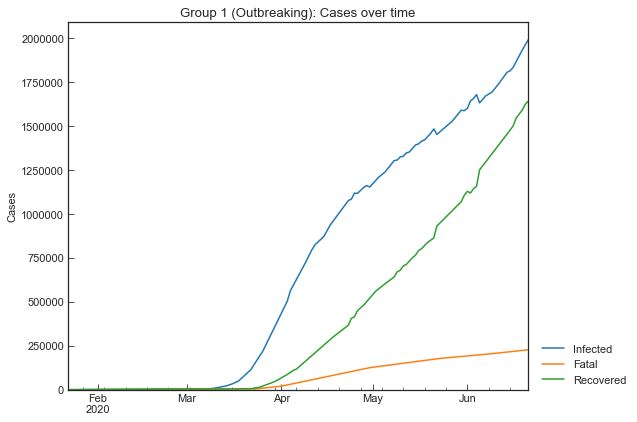

,Infected,Fatal,Recovered
Date,,,
2020-06-17,1868714,218824,1545394
2020-06-18,1901663,220796,1564791
2020-06-19,1932560,223898,1591140
2020-06-20,1958730,225427,1624295
2020-06-21,1992056,227196,1642017


In [52]:
df = ncov_df.loc[ncov_df["Group"] == "Outbreaking", ["Date", *data_cols]]
df = df.groupby("Date").sum()
df = df.iloc[:-1, :]
cs.line_plot(df, "Group 1 (Outbreaking): Cases over time", y_integer=True)
df.tail()

## Group 2: Stopping, growth factor $<$ 1 for the last 7 days

In [53]:
df = growth_df.loc[growth_df["Group"] == "Stopping", :]
", ".join(df.index.tolist()) + "."

'Nicaragua, Ecuador, Guinea-Bissau, Kosovo, Burundi, Botswana, Somalia, Belize, Bhutan, Cambodia, Tajikistan, Barbados, Eritrea, Gabon, Peru, Andorra, Haiti, Central African Republic, Chad, Russia, Cameroon, Estonia, Netherlands, New Zealand, Taiwan.'

In [54]:
growth_df.loc[growth_df["Group"] == "Stopping", :].head()

Date,Group,GF > 1 [straight days],GF < 1 [straight days],16Jun2020,17Jun2020,18Jun2020,19Jun2020,20Jun2020,21Jun2020,22Jun2020
Country,,,,,,,,,,
Nicaragua,Stopping,0,63,0.86,0.86,0.86,0.86,0.86,0.86,0.86
Ecuador,Stopping,0,28,0.80,0.79,0.95,0.95,0.89,0.94,0.73
Guinea-Bissau,Stopping,0,27,0.71,0.71,0.71,0.71,0.71,0.71,0.71
Kosovo,Stopping,0,24,0.54,0.54,0.57,0.71,0.71,0.86,0.86
Burundi,Stopping,0,23,0.86,0.71,0.71,0.86,0.86,0.86,0.71


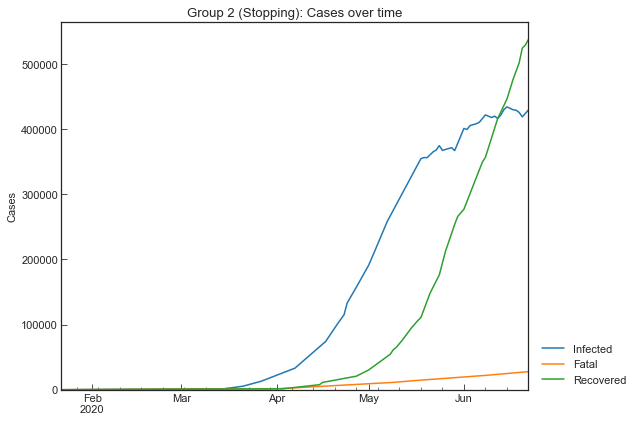

,Infected,Fatal,Recovered
Date,,,
2020-06-18,428958,26192,488986
2020-06-19,425533,26458,501910
2020-06-20,418834,27048,524167
2020-06-21,423058,27233,529003
2020-06-22,429291,27713,537590


In [55]:
df = ncov_df.loc[ncov_df["Group"] == "Stopping", ["Date", *data_cols]].groupby("Date").sum()
cs.line_plot(df, "Group 2 (Stopping): Cases over time", y_integer=True)
df.tail()

## Group 3: At a crossroad, the others

In [56]:
df = growth_df.loc[growth_df["Group"] == "Crossroad", :]
", ".join(df.index.tolist()) + "."

'Algeria, Croatia, Serbia, Cabo Verde, Guinea, Indonesia, Jamaica, Philippines, Syria, Vietnam, Azerbaijan, Bosnia and Herzegovina, Brazil, Burkina Faso, Finland, Iceland, Montenegro, Slovakia, Switzerland, Bangladesh, Dominican Republic, Ethiopia, Hungary, Mozambique, Singapore, Uruguay, Armenia, Georgia, Guatemala, Kenya, Kuwait, Malawi, Mongolia, Namibia, United Arab Emirates, Canada, Egypt, Guyana, Hong Kong, Iran, Niger, North Macedonia, Oman, South Korea, South Sudan, Thailand, UK, Bahamas, Equatorial Guinea, Saint Vincent and the Grenadines, San Marino, Kazakhstan, Sudan, Gambia, Italy, Poland, Qatar, Sweden, Belarus, China, Comoros, Denmark, Turkey, Afghanistan, Belgium, Cuba, Saudi Arabia, Albania, Benin, Burma, Colombia, Djibouti, India, Ireland, Ivory Coast, Kyrgyzstan, Mali, Portugal, Sri Lanka,  Azerbaijan, Antigua and Barbuda, Aruba, Bahamas, The, Bahrain, Brunei, Cape Verde, Cayman Islands, Channel Islands, Curacao, Cyprus, Dominica, East Timor, Faroe Islands, Fiji, Fren

In [57]:
growth_df.loc[growth_df["Group"] == "Crossroad", :].head()

Date,Group,GF > 1 [straight days],GF < 1 [straight days],16Jun2020,17Jun2020,18Jun2020,19Jun2020,20Jun2020,21Jun2020,22Jun2020
Country,,,,,,,,,,
Algeria,Crossroad,6,0,1.00,1.02,1.02,1.01,1.02,1.04,1.04
Croatia,Crossroad,6,0,0.86,1.14,1.67,1.67,1.77,1.83,1.70
Serbia,Crossroad,6,0,0.98,1.08,1.06,1.06,1.05,1.08,1.09
Cabo Verde,Crossroad,5,0,1.16,0.99,1.19,1.17,1.16,1.30,1.52
Guinea,Crossroad,5,0,0.84,0.90,1.61,1.60,1.57,1.52,1.40


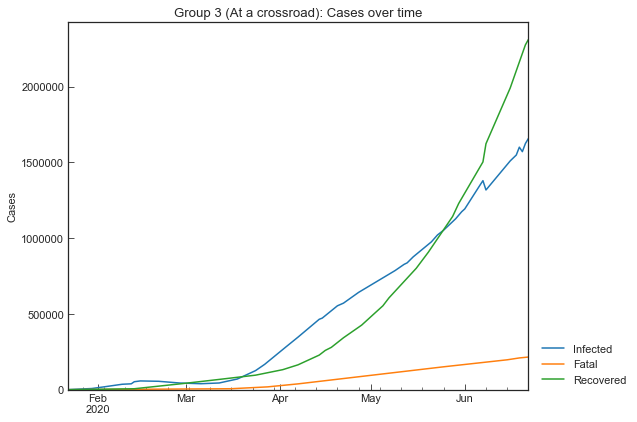

,Infected,Fatal,Recovered
Date,,,
2020-06-18,1549175,206997,2101499
2020-06-19,1601002,209646,2152891
2020-06-20,1571468,211987,2229922
2020-06-21,1624897,213934,2276226
2020-06-22,1658573,215685,2312088


In [58]:
df = ncov_df.loc[ncov_df["Group"] == "Crossroad", ["Date", *data_cols]].groupby("Date").sum()
cs.line_plot(df, "Group 3 (At a crossroad): Cases over time", y_integer=True)
df.tail()

# SIR to SIR-F<a id="4"></a>
In this section, we will create a customized mathematical model derived from SIR model.

## SIR model
To understand the trend of infection, we will use mathematical epidemic model. Let's start discussion using the simplest model named SIR.

### What is SIR model?
SIR model is a simple mathematical model to understand outbreak of infectious diseases.  
[The SIR epidemic model - Learning Scientific Programming with Python](https://scipython.com/book/chapter-8-scipy/additional-examples/the-sir-epidemic-model/)

 * S: Susceptible (=All - Confirmed)
 * I: Infected (=Confirmed - Recovered - Deaths)
 * R: Recovered or fatal (=Recovered + Deaths)
 
Note: THIS IS NOT THE GENERAL MODEL!  
Though R in SIR model is "Recovered and have immunity", I defined "R as Recovered or fatal". This is because mortality rate cannot be ignored in the real COVID-19 data.

Model:  
\begin{align*}
\mathrm{S} \overset{\beta I}{\longrightarrow} \mathrm{I} \overset{\gamma}{\longrightarrow} \mathrm{R}  \\
\end{align*}

$\beta$: Effective contact rate [1/min]  
$\gamma$: Recovery(+Mortality) rate [1/min]  

Ordinary Differential Equation (ODE):  
\begin{align*}
& \frac{\mathrm{d}S}{\mathrm{d}T}= - N^{-1}\beta S I  \\
& \frac{\mathrm{d}I}{\mathrm{d}T}= N^{-1}\beta S I - \gamma I  \\
& \frac{\mathrm{d}R}{\mathrm{d}T}= \gamma I  \\
\end{align*}

Where $N=S+I+R$ is the total population, $T$ is the elapsed time from the start date.

### Non-dimensional SIR model
To simplify the model, we will remove the units of the variables from ODE.

Set $(S, I, R) = N \times (x, y, z)$ and $(T, \beta, \gamma) = (\tau t, \tau^{-1} \rho, \tau^{-1} \sigma)$.  

This results in the ODE  
\begin{align*}
& \frac{\mathrm{d}x}{\mathrm{d}t}= - \rho x y  \\
& \frac{\mathrm{d}y}{\mathrm{d}t}= \rho x y - \sigma y  \\
& \frac{\mathrm{d}z}{\mathrm{d}t}= \sigma y  \\
\end{align*}

Where $N$ is the total population and $\tau$ is a coefficient ([min], is an integer to simplify).  

The range of variables and parameters:  
\begin{align*}
& 0 \leq (x, y, z, \rho, \sigma) \leq 1  \\
\end{align*}
\begin{align*}
& 1\leq \tau \leq 1440  \\
\end{align*}

Basic reproduction number, Non-dimentional parameter, is defined as  
\begin{align*}
R_0 = \rho \sigma^{-1} = \beta \gamma^{-1}
\end{align*}

Estimated Mean Values of $R_0$:  
$R_0$ ("R naught") means "the average number of secondary infections caused by an infected host" ([Infection Modeling — Part 1](https://towardsdatascience.com/infection-modeling-part-1-87e74645568a)).  
(Secondary data: [Van den Driessche, P., & Watmough, J. (2002).](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6002118))  
2.06: Zika in South America, 2015-2016  
1.51: Ebola in Guinea, 2014  
1.33: H1N1 influenza in South Africa, 2009  
3.5 : SARS in 2002-2003  
1.68: H2N2 influenza in US, 1957  
3.8 : Fall wave of 1918 Spanish influenza in Genova  
1.5 : Spring wave of 1918 Spanish influenza in Genova  

When $x=\frac{1}{R_0}$, $\frac{\mathrm{d}y}{\mathrm{d}t}=0$.
<!--This means that the max value of confirmed ($=y+z$) is $1-\frac{1}{R_0}$.-->

### Example of non-dimensional SIR model
For example, set $R_0 = 2.5, \rho=0.2$ and initial values $(x_{(0)}, y_{(0)}, z_{(0)}) = (0.999, 0.001, 0)$.

In [59]:
eg_r0, eg_rho = (2.5, 0.2)
eg_sigma = eg_rho / eg_r0
eg_initials = (0.999, 0.001, 0)
display(Markdown(rf"$\rho = {eg_rho},\ \sigma = {eg_sigma}$."))

$\rho = 0.2,\ \sigma = 0.08$.

In [60]:
eg_population = 1_000_000
eg_tau = 1440
sir_param_dict = {
    "rho": eg_rho, "sigma": eg_sigma
}
sir_simulator = cs.ODESimulator(country="Example", province="SIR")
sir_simulator.add(
    model=cs.SIR, step_n=180, population=eg_population,
    param_dict=sir_param_dict,
    y0_dict={"Susceptible": 999_000, "Infected": 1000, "Fatal or Recovered": 0}
)
sir_simulator.run()
sir_simulator.non_dim().tail()

,t,x,y,z
176,176,0.107762,0.000674,0.891564
177,177,0.107748,0.000635,0.891617
178,178,0.107734,0.000599,0.891667
179,179,0.107722,0.000565,0.891713
180,180,0.107710,0.000533,0.891757


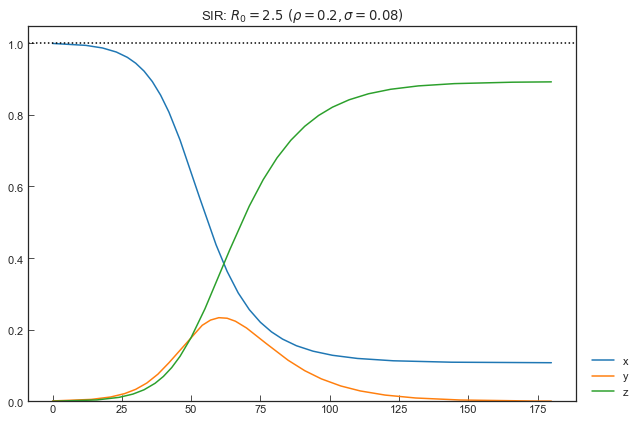

In [61]:
cs.line_plot(
    sir_simulator.non_dim().set_index("t"),
    title=r"SIR: $R_0={0}\ (\rho={1}, \sigma={2})$".format(eg_r0, eg_rho, eg_sigma),
    ylabel="",
    h=1
)

There is an inflection point of y (the number of currentry infected cases per total population). At this point, value of x (the number of susceptible cases per total population) is nearly equal to $\frac{1}{R_0}$.

In [62]:
df = sir_simulator.non_dim()
x_max = df.loc[df["y"].idxmax(), "x"]
(x_max, 1/eg_r0)

(0.39801, 0.4)

### Dimensionalization
Here, we will dimensionalize the data, assuming that start date is the first date of JHU dataset, $\tau=1440$ [min] and total population $N=1,000,000$.

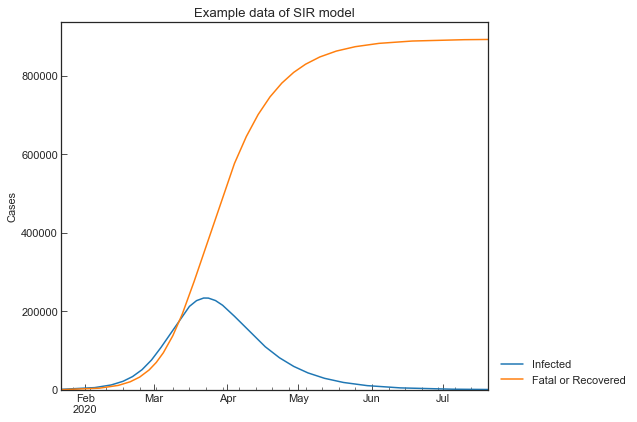

,Date,Country,Province,Susceptible,Infected,Fatal or Recovered
176,2020-07-16,Example,SIR,107762.0,674.0,891565.0
177,2020-07-17,Example,SIR,107748.0,635.0,891617.0
178,2020-07-18,Example,SIR,107734.0,599.0,891666.0
179,2020-07-19,Example,SIR,107722.0,565.0,891713.0
180,2020-07-20,Example,SIR,107710.0,533.0,891757.0


In [63]:
sir_eg_df = sir_simulator.dim(tau=eg_tau, start_date="22Jan2020")
cs.line_plot(
    sir_eg_df.set_index("Date")[["Infected", "Fatal or Recovered"]],
    "Example data of SIR model",
    h=eg_population, y_integer=True
)
sir_eg_df.tail()

## SIR-D model
Because we are measuring the number of fatal cases and recovered cases separately, we can use two variables ("Recovered" and "Deaths") instead of "Recovered + Deaths" in the mathematical model.

### What is SIR-D model?
* S: Susceptible
* I: Infected
* R: Recovered
* D: Deaths

Model:  
\begin{align*}
\mathrm{S} \overset{\beta  I}{\longrightarrow}\ & \mathrm{I} \overset{\gamma}{\longrightarrow} \mathrm{R}  \\
& \mathrm{I} \overset{\alpha}{\longrightarrow} \mathrm{D}  \\
\end{align*}

$\alpha$: Mortality rate [1/min]  
$\beta$: Effective contact rate [1/min]  
$\gamma$: Recovery rate [1/min]  

Ordinary Differential Equation (ODE):
\begin{align*}
& \frac{\mathrm{d}S}{\mathrm{d}T}= - N^{-1}\beta S I  \\
& \frac{\mathrm{d}I}{\mathrm{d}T}= N^{-1}\beta S I - (\gamma + \alpha) I  \\
& \frac{\mathrm{d}R}{\mathrm{d}T}= \gamma I  \\
& \frac{\mathrm{d}D}{\mathrm{d}T}= \alpha I  \\
\end{align*}

Where $N=S+I+R+D$ is the total population, $T$ is the elapsed time from the start date.

### Non-dimensional SIR-D model
Set $(S, I, R, D) = N \times (x, y, z, w)$ and $(T, \alpha, \beta, \gamma) = (\tau t, \tau^{-1} \kappa, \tau^{-1} \rho, \tau^{-1} \sigma)$.  
This results in the ODE  
\begin{align*}
& \frac{\mathrm{d}x}{\mathrm{d}t}= - \rho x y  \\
& \frac{\mathrm{d}y}{\mathrm{d}t}= \rho x y - (\sigma + \kappa) y  \\
& \frac{\mathrm{d}z}{\mathrm{d}t}= \sigma y  \\
& \frac{\mathrm{d}w}{\mathrm{d}t}= \kappa y  \\
\end{align*}

Where $N$ is the total population and $\tau$ is a coefficient ([min], is an integer to simplify).  

The range of variables and parameters:  
\begin{align*}
& 0 \leq (x, y, z, w, \kappa, \rho, \sigma) \leq 1  \\
\end{align*}
\begin{align*}
& 1\leq \tau \leq 1440  \\
\end{align*}

Reproduction number can be defined as  
\begin{align*}
R_0 = \rho (\sigma + \kappa)^{-1} = \beta (\gamma + \alpha)^{-1}
\end{align*}

### Example of non-dimensional SIR-D model
For example, set $R_0 = 2.5, \kappa=0.005, \rho=0.2$ and initial values $(x_{(0)}, y_{(0)}, z_{(0)}, w_{(0)}) = (0.999, 0.001, 0, 0)$.

In [64]:
eg_r0, eg_kappa, eg_rho = (2.5, 0.005, 0.2)
eg_sigma = eg_rho / eg_r0 - eg_kappa
eg_initials = (0.999, 0.001, 0, 0)
display(Markdown(rf"$\kappa = {eg_kappa},\ \rho = {eg_rho},\ \sigma = {eg_sigma}$."))

$\kappa = 0.005,\ \rho = 0.2,\ \sigma = 0.075$.

In [65]:
sird_param_dict = {
    "kappa": eg_kappa, "rho": eg_rho, "sigma": eg_sigma
}
sird_simulator = cs.ODESimulator(country="Example", province="SIR-D")
sird_simulator.add(
    model=cs.SIRD, step_n=180, population=eg_population,
    param_dict=sird_param_dict,
    y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
)
sird_simulator.run()
sird_simulator.non_dim().tail()

,t,x,y,z,w
176,176,0.111254,0.000710,0.832534,0.055502
177,177,0.111238,0.000670,0.832586,0.055506
178,178,0.111224,0.000632,0.832635,0.055509
179,179,0.111210,0.000597,0.832681,0.055512
180,180,0.111197,0.000563,0.832725,0.055515


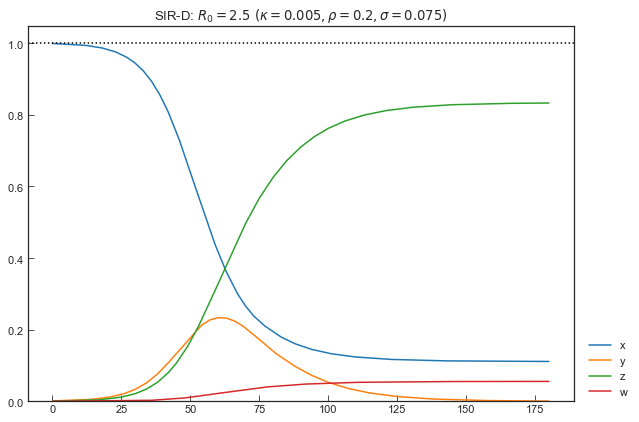

In [66]:
cs.line_plot(
    sird_simulator.non_dim().set_index("t"),
    title=r"SIR-D: $R_0={0}\ (\kappa={1}, \rho={2}, \sigma={3})$".format(eg_r0, eg_kappa, eg_rho, eg_sigma),
    ylabel="",
    h=1
)

There is an inflection point of y (the number of currentry infected cases per total population). At this point, value of x (the number of susceptible cases per total population) is nearly equal to $\frac{1}{R_0}$.

In [67]:
df = sird_simulator.non_dim()
x_max = df.loc[df["y"].idxmax(), "x"]
(x_max, 1/eg_r0)

(0.3978133978133978, 0.4)

### Dimensionalization
Here, we will dimensionalize the data, assuming that start date is the first date of JHU dataset, $\tau=1440$ [min] and total population $N=1,000,000$.

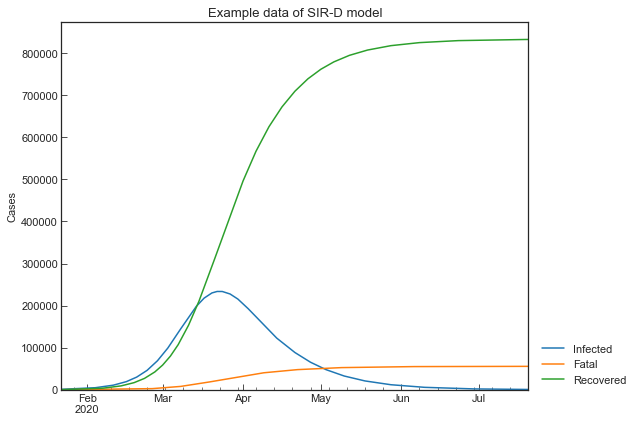

,Date,Country,Province,Susceptible,Infected,Recovered,Fatal
176,2020-07-16,Example,SIR-D,111254.0,710.0,832534.0,55502.0
177,2020-07-17,Example,SIR-D,111238.0,670.0,832586.0,55506.0
178,2020-07-18,Example,SIR-D,111224.0,632.0,832635.0,55509.0
179,2020-07-19,Example,SIR-D,111210.0,597.0,832681.0,55512.0
180,2020-07-20,Example,SIR-D,111197.0,563.0,832724.0,55515.0


In [68]:
sird_eg_df = sird_simulator.dim(tau=eg_tau, start_date="22Jan2020")
cs.line_plot(
    sird_eg_df.set_index("Date")[["Infected", "Fatal", "Recovered"]],
    "Example data of SIR-D model",
    h=eg_population, y_integer=True
)
sird_eg_df.tail()

## SIR-F model
It is reported that some cases died before clinical diagnosis of COVID-19. To consider this issue, "S + I $\to$ Fatal + I" will be added to the model.

### What is SIR-F model?
* S: Susceptible
* S$^\ast$: Confirmed and un-categorized
* I: Confirmed and categorized as I
* R: Recovered
* F: Fatal with confirmation

Measurable variables:  
Confirmed = $I+R+F$  
Recovered = $R$  
Deaths = $F$  

Model:  
\begin{align*}
\mathrm{S} \overset{\beta I}{\longrightarrow} \mathrm{S}^\ast \overset{\alpha_1}{\longrightarrow}\ & \mathrm{F}    \\
\mathrm{S}^\ast \overset{1 - \alpha_1}{\longrightarrow}\ & \mathrm{I} \overset{\gamma}{\longrightarrow} \mathrm{R}    \\
& \mathrm{I} \overset{\alpha_2}{\longrightarrow} \mathrm{F}    \\
\end{align*}

$\alpha_1$: Mortality rate of S$^\ast$ cases [-]  
$\alpha_2$: Mortality rate of I cases [1/min]  
$\beta$: Effective contact rate [1/min]  
$\gamma$: Recovery rate [1/min]  

Note: When $\alpha_1 = 0$, SIR-F model is the same as SIR-D model.

Ordinary Differential Equation (ODE):   
\begin{align*}
& \frac{\mathrm{d}S}{\mathrm{d}T}= - N^{-1}\beta S I  \\
& \frac{\mathrm{d}I}{\mathrm{d}T}= N^{-1}(1 - \alpha_1) \beta S I - (\gamma + \alpha_2) I  \\
& \frac{\mathrm{d}R}{\mathrm{d}T}= \gamma I  \\
& \frac{\mathrm{d}F}{\mathrm{d}T}= N^{-1}\alpha_1 \beta S I + \alpha_2 I  \\
\end{align*}

Where $N=S+I+R+F$ is the total population, $T$ is the elapsed time from the start date.

### Non-dimensional SIR-F model
Set $(S, I, R, F) = N \times (x, y, z, w)$ and $(T, \alpha_1, \alpha_2, \beta, \gamma) = (\tau t, \theta, \tau^{-1} \kappa, \tau^{-1} \rho, \tau^{-1} \sigma)$.  
This results in the ODE  
\begin{align*}
& \frac{\mathrm{d}x}{\mathrm{d}t}= - \rho x y  \\
& \frac{\mathrm{d}y}{\mathrm{d}t}= \rho (1-\theta) x y - (\sigma + \kappa) y  \\
& \frac{\mathrm{d}z}{\mathrm{d}t}= \sigma y  \\
& \frac{\mathrm{d}w}{\mathrm{d}t}= \rho \theta x y + \kappa y  \\
\end{align*}

Where $N$ is the total population and $\tau$ is a coefficient ([min], is an integer to simplify).  

The range of variables and parameters:  
\begin{align*}
& 0 \leq (x, y, z, w, \theta, \kappa, \rho, \sigma) \leq 1  \\
\end{align*}
\begin{align*}
& 1\leq \tau \leq 1440  \\
\end{align*}

Reproduction number can be defined as  
\begin{align*}
R_0 = \rho (1 - \theta) (\sigma + \kappa)^{-1} = \beta (1 - \alpha_1) (\gamma + \alpha_2)^{-1}
\end{align*}

### Example of non-dimensional SIR-F model
For example, set $R_0 = 2.5, \theta=0.002, \kappa=0.005, \rho=0.2$ and initial values $(x_{(0)}, y_{(0)}, z_{(0)}, w_{(0)}) = (0.999, 0.001, 0, 0)$.

In [69]:
eg_r0, eg_theta, eg_kappa, eg_rho = (2.5, 0.002, 0.005, 0.2)
eg_sigma = eg_rho / eg_r0 - eg_kappa
eg_initials = (0.999, 0.001, 0, 0)
display(Markdown(rf"$\theta = {eg_theta},\ \kappa = {eg_kappa},\ \rho = {eg_rho},\ \sigma = {eg_sigma}$."))

$\theta = 0.002,\ \kappa = 0.005,\ \rho = 0.2,\ \sigma = 0.075$.

In [70]:
sirf_param_dict = {
    "theta": eg_theta, "kappa": eg_kappa, "rho": eg_rho, "sigma": eg_sigma
}
sirf_simulator = cs.ODESimulator(country="Example", province="SIR-F")
sirf_simulator.add(
    model=cs.SIRF, step_n=180, population=eg_population,
    param_dict=sirf_param_dict,
    y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
)
sirf_simulator.run()
sirf_simulator.non_dim().tail()

,t,x,y,z,w
176,176,0.112236,0.000723,0.829938,0.057103
177,177,0.112221,0.000683,0.829990,0.057106
178,178,0.112206,0.000645,0.830039,0.057110
179,179,0.112192,0.000609,0.830086,0.057113
180,180,0.112178,0.000574,0.830132,0.057116


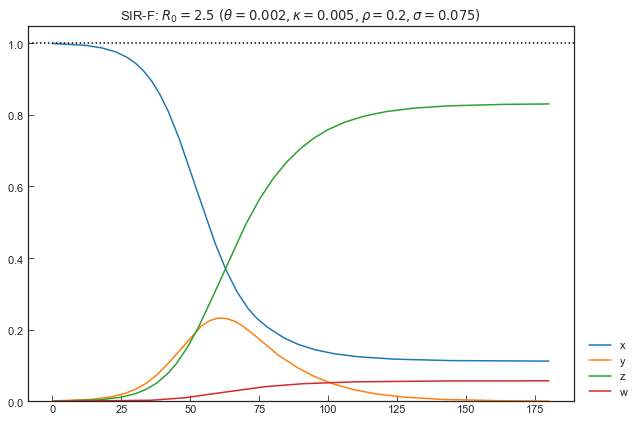

In [71]:
cs.line_plot(
    sirf_simulator.non_dim().set_index("t"),
    title=r"SIR-F: $R_0={0}\ (\theta={1}, \kappa={2}, \rho={3}, \sigma={4})$".format(
        eg_r0, eg_theta, eg_kappa, eg_rho, eg_sigma
    ),
    ylabel="",
    h=1
)

There is an inflection point of y (the number of currentry infected cases per total population). At this point, value of x (the number of susceptible cases per total population) is nearly equal to $\frac{1}{R_0}$.

In [72]:
df = sirf_simulator.non_dim()
x_max = df.loc[df["y"].idxmax(), "x"]
(x_max, 1/eg_r0)

(0.401442, 0.4)

### Dimensionalization
Here, we will dimensionalize the data, assuming that start date is the first date of JHU dataset, $\tau=1440$ [min] and total population $N=1,000,000$.

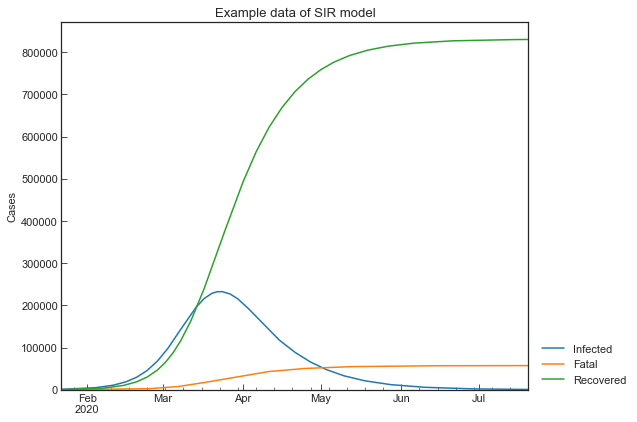

,Date,Country,Province,Susceptible,Infected,Recovered,Fatal
176,2020-07-16,Example,SIR-F,112236.0,723.0,829938.0,57103.0
177,2020-07-17,Example,SIR-F,112221.0,683.0,829990.0,57106.0
178,2020-07-18,Example,SIR-F,112206.0,645.0,830040.0,57110.0
179,2020-07-19,Example,SIR-F,112192.0,609.0,830087.0,57113.0
180,2020-07-20,Example,SIR-F,112178.0,574.0,830131.0,57116.0


In [73]:
sirf_eg_df = sirf_simulator.dim(tau=eg_tau, start_date="22Jan2020")
cs.line_plot(
    sirf_eg_df.set_index("Date")[["Infected", "Fatal", "Recovered"]],
    "Example data of SIR model",
    h=eg_population, y_integer=True
)
sirf_eg_df.tail()

### Hyperparameter optimization
In the previous paragraphs figures, we calculated the number of cases based on hypothesized parameter values. However, we do not know parameter values of the actual data. Here, we will estimate the ($\theta, \kappa, \rho, \sigma$) values of the example data using hyperparameter optimization method by Optuna package. $\tau$ will be fixed as 1440 [min].

In [74]:
estimator = cs.Estimator(
    clean_df=sirf_eg_df, model=cs.SIRF, population=eg_population,
    country="Example", province="SIR-F",
    tau=eg_tau
)
estimator.run()

	Running optimization...
	Finished 195 trials in 0 min 21 sec..


Trajectorie of parameter values in hyperparameter estimation are shown here.

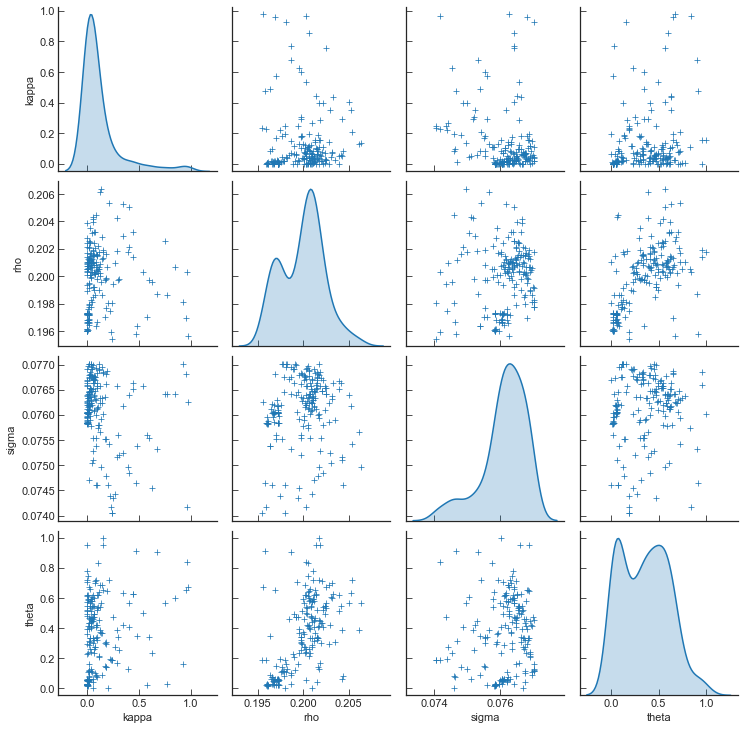

In [75]:
_ = estimator.history()

Estimated parameter values are shown here.

In [76]:
df = estimator.summary(name="SIR-F")
df.loc["Setting"] = pd.Series({**sirf_param_dict, "tau": eg_tau})
df["tau"] = df["tau"].astype(np.int64)
df.fillna("-")

,rho,sigma,theta,kappa,tau,Rt,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
SIR-F,0.197332,0.075845,0.022125,0.002721,1440,2.46,0.022,367,5,13,0.719841,195,0 min 21 sec
Setting,0.200000,0.075000,0.002000,0.005000,1440,-,-,-,-,-,-,-,-


Note:  
"Score" is Root Mean Squared Log Error (RMSLE) score.
\begin{align*}
& \sqrt{\cfrac{1}{n}\sum_{i=1}^{n}(log_{10}(A_{i} + 1) - log_{10}(P_{i} + 1))^2}
\end{align*}
Where $A$ is observed (actual) values, $P$ is estimated (predicted) values. Variables are $S$ ($i=1$), $I$ ($i=2$), $R$ ($i=3$) and $F$ ($i=n=4$) for SIR-F model. When RMSLE socre is low, hyperparameter estimation is highly accurate.  
Please refer to [What’s the Difference Between RMSE and RMSLE?](https://medium.com/analytics-vidhya/root-mean-square-log-error-rmse-vs-rmlse-935c6cc1802a)

Comparison of observed values and estimated values is shown here.

Note:  
This figures show the accuracy for each parameter. When "v_observed" and "v_estimated" (v=y, z, w) is overlapping, highly accurate.

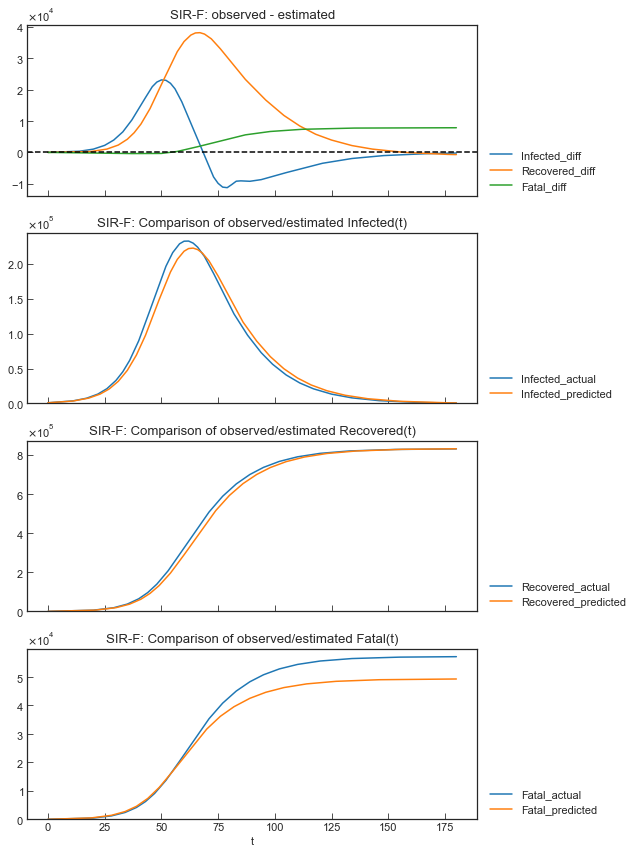

In [77]:
_ = estimator.accuracy()

# SIR-F with exposed/waiting cases<a id="5"></a>
The number of exposed cases in latent period (E) and wating cases for confirmation (W) are un-measurable variables, but key variables as well as S, I, R, F. If E and W are large, outbreak will occur in the near future. Let's replace S $\overset{\beta I}{\longrightarrow}$ S$^\ast$ with S $\overset{\beta_1 (W+I)}{\longrightarrow}$ E $\overset{\beta_2}{\longrightarrow}$ W $\overset{\beta_3}{\longrightarrow}$ S$^\ast$ because W also has infectivity.

Note:  
W and some rules were added to explain COVID-19 dataset, but this is like-SEIR model.  
To study general SEIR-model, please refer to PDF material in [Introduction to SEIR model Models](http://indico.ictp.it/event/7960/session/3/contribution/19/material/slides/).

## What is SEWIR-F model?
* S: Susceptible
* <u>E: Exposed and in latent period (without infectivity)</u>
* <u>W: Waiting cases for confirmation (with infectivity)</u>
* S$^\ast$: Confirmed and un-categorized
* I: Confirmed and categorized as I
* R: Recovered
* F: Fatal with confirmation

Measurable variables:  
Total population - Confirmed = $S+E+W+S^\ast$  
Confirmed = $I+R+F$  
Recovered = $R$  
Deaths = $F$  

Model:  
\begin{align*}
\mathrm{S} \overset{\beta_1 (W+I)}{\longrightarrow} \mathrm{E} \overset{\beta_2}{\longrightarrow} \mathrm{W} \overset{\beta_3}{\longrightarrow} \mathrm{S}^\ast \overset{\alpha_1}{\longrightarrow}\ & \mathrm{F}    \\
\mathrm{S}^\ast \overset{1 - \alpha_1}{\longrightarrow}\ & \mathrm{I} \overset{\gamma}{\longrightarrow} \mathrm{R}    \\
& \mathrm{I} \overset{\alpha_2}{\longrightarrow} \mathrm{F}    \\
\end{align*}

$\alpha_1$: Mortality rate of S$^\ast$ cases [-]  
$\alpha_2$: Mortality rate of I cases [1/min]  
$\beta_1$: <u>Exposure rate (the number of encounter with the virus in a minute)</u> [1/min]  
$\beta_2$: <u>Inverse of latent period</u> [1/min]  
$\beta_3$: <u>Inverse of waiting time for confirmation</u> [1/min]  
$\gamma$: Recovery rate [1/min]  

Ordinary Differential Equation (ODE):   
\begin{align*}
& \frac{\mathrm{d}S}{\mathrm{d}T}= - N^{-1}\beta_1 S (W + I)  \\
& \frac{\mathrm{d}E}{\mathrm{d}T}= N^{-1}\beta_1 S (W + I) - \beta_2 E  \\
& \frac{\mathrm{d}W}{\mathrm{d}T}= \beta_2 E - \beta_3 W  \\
& \frac{\mathrm{d}I}{\mathrm{d}T}= (1 - \alpha_1)\beta_3 W - (\gamma + \alpha_2) I  \\
& \frac{\mathrm{d}R}{\mathrm{d}T}= \gamma I  \\
& \frac{\mathrm{d}F}{\mathrm{d}T}= \alpha_1 \beta_3 W + \alpha_2 I  \\
\end{align*}

Where $N=S+E+W+I+R+F$ is the total population, $T$ is the elapsed time from the start date.

## Non-dimensional SEWIR-F model
Set $(S, E, W, I, R, F) = N \times (x_1, x_2, x_3, y, z, w)$, $(T, \alpha_1) = (\tau t, \theta)$ and $(\alpha_2, \beta_i, \gamma) = \tau^{-1} \times (\kappa, \rho_i, \sigma)$.  
This results in the ODE  
\begin{align*}
& \frac{\mathrm{d}x_1}{\mathrm{d}t}= - \rho_1 x_1 (x_3 + y)  \\
& \frac{\mathrm{d}x_2}{\mathrm{d}t}= \rho_1 x_1 (x_3 + y) - \rho_2 x_2  \\
& \frac{\mathrm{d}x_3}{\mathrm{d}t}= \rho_2 x_2 - \rho_3 x_3  \\
& \frac{\mathrm{d}y}{\mathrm{d}t}= (1-\theta) \rho_3 x_3 - (\sigma + \kappa) y  \\
& \frac{\mathrm{d}z}{\mathrm{d}t}= \sigma y  \\
& \frac{\mathrm{d}w}{\mathrm{d}t}= \theta \rho_3 x_3 + \kappa y  \\
\end{align*}

Where $N$ is the total population and $\tau$ is a coefficient ([min], is an integer to simplify).  

The range of variables and parameters:  
\begin{align*}
0 < (x_i, y, z, w, \theta, \kappa, \rho_i, \sigma) < 1\ \mathrm{for}\ i = 1, 2, 3
\end{align*}
\begin{align*}
1 \leq \tau \leq 1440
\end{align*}

Reproduction number can be defined as  
\begin{align*}
R_0 = \rho_1 (1-\theta) (\sigma + \kappa)^{-1}
\end{align*}

## Calculate $\rho_2$ and $\rho_3$
To estimate $\rho_2 = \tau \beta_2$ and $\rho_3 = \tau \beta_3$ of COVID-19, we first calculate median value of latent period $\overline{L_{E}}$ and waiting time for confirmation $\overline{L_{W}}$ using linelist. We assume that patients start to have infectivity from onset dates. This means latent period is equal to incubation period.

$\beta_2$: Inverse of latent period [1/min]  
$\beta_3$: Inverse of waiting time for confirmation [1/min]

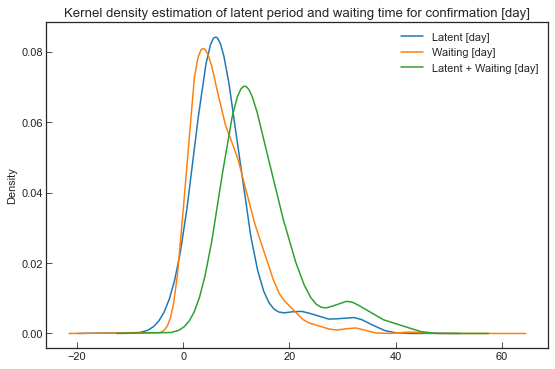

,count,mean,std,min,25%,50%,75%,max
Latent [day],83.0,8.180723,6.786185,-2.0,4.0,6.0,9.0,34.0
Waiting [day],563.0,7.682060,5.890473,0.0,3.0,6.0,11.0,43.0
Latent + Waiting [day],83.0,14.819277,7.305435,5.0,10.0,13.0,17.5,40.0


In [78]:
cols = ["Latent [day]", "Waiting [day]", "Latent + Waiting [day]"]
period_df[cols].plot.kde()
plt.title("Kernel density estimation of latent period and waiting time for confirmation [day]")
plt.show()
period_df[cols].describe().T

In [79]:
latent_period = period_df["Latent [min]"].median()
waiting_time = period_df["Waiting [min]"].median()
latent_waiting_day = period_df["Latent + Waiting [day]"].median()

In [80]:
df = estimator.summary(name="SIRF")
tau = df.loc[df.index[0], "tau"]
eg_rho2, eg_rho3 = tau / latent_period, tau / waiting_time
(eg_rho2, eg_rho3)

(0.16666666666666663, 0.16666666666666663)

### Example of non-dimensional SEWIR-F model
For example, set $\theta=0.002, \kappa=0.005, \rho_1=0.2, \sigma=0.08$ and initial values $(x_{1(0)}, x_{2(0)}, x_{3(0)}, y_{(0)}, z_{(0)}, w_{(0)}) = (0.994, 0.003, 0.002, 0.001, 0, 0)$.

In [81]:
eg_theta, eg_kappa, eg_rho1, eg_sigma = (0.002, 0.005, 0.2, 0.08)

In [82]:
sewirf_param_dict = {
    "theta": eg_theta, "kappa": eg_kappa,
    "rho1": eg_rho1, "rho2": eg_rho2, "rho3": eg_rho3, "sigma": eg_sigma
}
sewirf_simulator = cs.ODESimulator(country="Example", province="SEWIR-F")
sewirf_simulator.add(
    model=cs.SEWIRF, step_n=180, population=eg_population,
    param_dict=sewirf_param_dict,
    y0_dict={"Susceptible": 994_000, "Exposed": 3000, "Waiting": 0.002,
        "Infected": 1000, "Recovered": 0, "Fatal": 0
    }
)
sewirf_simulator.run()
sewirf_simulator.non_dim().tail()

,t,x1,y,z,w,x2,x3
176,176,0.032583,0.001566,0.906935,0.058615,0.000113,0.000187
177,177,0.032572,0.001468,0.907055,0.058623,0.000106,0.000175
178,178,0.032562,0.001375,0.907169,0.058630,0.000099,0.000164
179,179,0.032552,0.001289,0.907276,0.058637,0.000093,0.000153
180,180,0.032543,0.001207,0.907375,0.058643,0.000087,0.000144


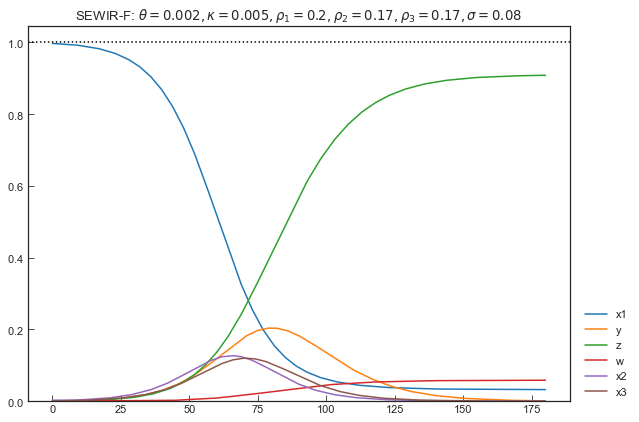

In [83]:
cs.line_plot(
    sewirf_simulator.non_dim().set_index("t"),
    title=r"SEWIR-F: $\theta={0}, \kappa={1}, \rho_1={2}, \rho_2={3}, \rho_3={4}, \sigma={5}$".format(
        eg_theta, eg_kappa, eg_rho1, round(eg_rho2, 2), round(eg_rho3, 2), eg_sigma
    ),
    ylabel="",
    h=1
)

### Dimensionalization
Here, we will dimensionalize the data, assuming that start date is the first date of JHU dataset, $\tau=1440$ [min] and total population $N=1,000,000$.

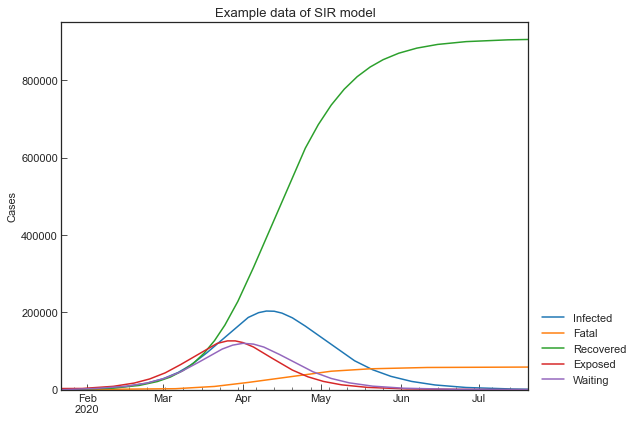

,Date,Country,Province,Susceptible,Infected,Recovered,Fatal,Exposed,Waiting
176,2020-07-16,Example,SEWIR-F,32518.0,1563.0,905120.0,58498.0,113.0,187.0
177,2020-07-17,Example,SEWIR-F,32507.0,1465.0,905241.0,58506.0,106.0,175.0
178,2020-07-18,Example,SEWIR-F,32497.0,1372.0,905355.0,58513.0,99.0,164.0
179,2020-07-19,Example,SEWIR-F,32487.0,1286.0,905461.0,58520.0,93.0,153.0
180,2020-07-20,Example,SEWIR-F,32478.0,1205.0,905560.0,58526.0,87.0,144.0


In [84]:
sewirf_eg_df = sewirf_simulator.dim(tau=eg_tau, start_date="22Jan2020")
cs.line_plot(
    sewirf_eg_df.set_index("Date")[["Infected", "Fatal", "Recovered", "Exposed", "Waiting"]],
    "Example data of SIR model",
    h=eg_population, y_integer=True
)
sewirf_eg_df.tail()

# Factors of model parameters<a id="6"></a>
To figure out what to do for minimizing the damage, we will perform scenario analysis in the next part. In this section, we will define the control factors of the SIR-F parameters.

Comment:  
For accurate SEWIR-F prediction, we need to calculate $\rho_1$ and $\rho_2$ with linelist (case reports) of each country. However, it is difficult to get enough data for all countries and we will use SIR-F model as the main model in scenario analysis part.

## Control factors of effective contact rate $\beta_1$
Please reconsider S $\overset{\beta_1 (W+I)}{\longrightarrow}$ E formula. Susceptible persons may contact with waiting/confirmed patients, and susceptible persons will be infected with COVID-19. The formura can be replaced with  
\begin{alignat}{1}
{\mathrm{S}}_{\mathrm{q}} & \overset{g_{s}}{\Longleftrightarrow} {\mathrm{S}}_{\mathrm{g}} \overset{f_1}
 {\longrightarrow} \ & \mathrm{E}^\ast \overset{e^{-h_2}}{\longrightarrow} \mathrm{E}   \\
& & \mathrm{E}^\ast \overset{1-e^{-h_2}}{\longrightarrow} \mathrm{R}^\ast  \\
\mathrm{W}_\mathrm{q} & \overset{g_w}{\Longleftrightarrow} \mathrm{W}_{\mathrm{g}}  \\
\mathrm{I}_\mathrm{q} & \overset{g_i}{\Longleftrightarrow} \mathrm{I}_{\mathrm{g}}  \\
\mathrm{I}_\mathrm{q} & \overset{q}{\longrightarrow} \mathrm{I}_{\hat{\mathrm{q}}}  \\
\end{alignat}

$\Longleftrightarrow$ (as substitute for $\longrightarrow$ with $\longleftarrow$) means that right side can be return to the left side.  
S$_\mathrm{q}$: Susceptible persons with self-quaranting <!--Susceptible in the strict sense-->  
S$_\mathrm{g}$: Susceptible persons with family members or friends etc.  
W$_\mathrm{q}$: Waiting patients with self-quaranting  
W$_\mathrm{g}$: Waiting patients with family members or friends etc.  
I$_\mathrm{q}$: Confimered and un-recovered patients with self-quaranting  
I$_\mathrm{g}$: Confimered and un-recovered patients with family members or friends etc.  
I$_\hat{\mathrm{q}}$: Confimered and un-recovered patients who was hospitalized  
E$^\ast$: Just after being exposed to the virus  
R$^\ast$: Being exposed to the virus, fighted with the virus, recovered and immuned without confirmation  

$f_1 = v(W_{\mathrm{g}} + I_{\mathrm{g}})(1-m)^2(1-w_e)^{w_n}e^{-h_1}sc$ [-] 

Control factors:  
$g_s$: The number of days in <u>a week</u> susceptible persons go out [day]  
$g_w$: The number of days in <u>a week</u> waiting but un-quarantined persons go out [day]  
$g_i$: The number of days in <u>a week</u> currently infected (confirmed) but un-quarantined persons go out [day]  
$q$: Quarantine rate of currently infected (confirmed) patients [-]  
$v$: Probability of virus existance in a droplet [-]  
$m$: Rate of persons wearing masks effectively (depends logistically on supply of masks) [-]  
$w_e$: Virus reduction effect of washing hands [-]  
$w_n$: The number of times people washes their hands before touching their own faces after go out [-]  
$h_1$: Health condition (active rate of cellular immunity factors) of susceptible and contacted persons [-]  
$h_2$: Health condition (active rate of humoral immunity factors) of susceptible and contacted persons [-]  
$c$: The number of contacts between susceptible persons and patients while on the go in a minute (depends on population density) [1/min]  
$\delta$:The product of unknown real factors [-]  

The parameter in the math model:  
$\beta_1 = \cfrac{1}{49}[g_s \{g_w + g_i (1-q) \} v (1-m)^2 (1-w_e)^{w_n} e^{-(h_{1}+h_{2})} c \delta]$ [1/min]

In [85]:
# Value of beta before actions are taken
beta_before = eg_rho / eg_tau
beta_before

0.0001388888888888889

**As a example, we will predict the impact of lockdown. The number of days in a week susceptible persons go out, $g_s$, will be minimized.**

### $g_s$ value before actions are taken
$g_s$: The number of days in <u>a week</u>, susceptible persons go out [day]  

We can calculate weighted average of days with age composion of population. Population pyramid in the entire world (global data) will be used.

In [86]:
eg_out_df = go_out("Global")
eg_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,nursery,3,0,0,0.052210
1,3,5,nursery school,4,0,1,0.051864
2,6,10,elementary school,5,0,1,0.084689
3,11,13,middle school,5,0,1,0.049386
4,14,18,high school,6,0,1,0.079324
5,19,25,university/work,3,3,1,0.107659
6,26,35,work,0,6,1,0.152774
7,36,45,work,0,5,1,0.131630
8,46,55,work,0,5,1,0.116396
9,56,65,work,0,5,1,0.088096


$g_s$ value is

In [87]:
gs_before = (eg_out_df[["School", "Office", "Others"]].sum(axis=1) * eg_out_df["Portion"]).sum()
gs_before

5.921853248424339

### $g_s$ value AFTER actions are taken
We will assume the following situation (lockdown) here.
* All schools are closed
* offices are closed and 50% of people works remotely.
* People will go out one day for other reasons instead of going to school/office.

In [88]:
df = eg_out_df.copy()
df.loc[df["School"] + df["Office"] > 0, "Others"] += 1
df["School"] = 0
df["Office"] *= 0.5
eg_out_df_after = df.copy()
eg_out_df_after

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,nursery,0,0.0,1,0.052210
1,3,5,nursery school,0,0.0,2,0.051864
2,6,10,elementary school,0,0.0,2,0.084689
3,11,13,middle school,0,0.0,2,0.049386
4,14,18,high school,0,0.0,2,0.079324
5,19,25,university/work,0,1.5,2,0.107659
6,26,35,work,0,3.0,2,0.152774
7,36,45,work,0,2.5,2,0.131630
8,46,55,work,0,2.5,2,0.116396
9,56,65,work,0,2.5,2,0.088096


In [89]:
df = eg_out_df_after.copy()
gs_after = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
gs_after

3.5423821085758442

## Impact of actions on $\beta$
In SIR-F model $g_s$ is a control factor of $\beta$.  
Actions taken at 15th day:  
All schools and offices will be closed.  

In [90]:
beta_after = beta_before * (gs_after / gs_before)
beta_after / beta_before

0.5981880941609597

## Predict the number of cases: with actions from 15th day
There is a delay between the time point of starting actions and that of appearing the effect. Because $I$ is the main variable, the length of delay can be estimated as sum of latent period and waiting time for confirmation. This value [day] was calculated in "SIR-F with exposed/waiting cases" section.

In [91]:
latent_waiting_day

13.0

In [92]:
param_dict = sirf_param_dict.copy()
lock_param_dict = param_dict.copy()
lock_param_dict["rho"] = param_dict["rho"] * beta_after / beta_before
df = pd.DataFrame.from_dict(
    {"No actions": param_dict, "Lockdown": lock_param_dict},
    orient="index"
)
df = df.loc[:, ["theta", "kappa", "rho", "sigma"]]
df["R0"] = df.apply(lambda x: cs.SIRF(eg_population, **x.to_dict()).calc_r0(), axis=1)
df["tau"] = eg_tau
df

,theta,kappa,rho,sigma,R0,tau
No actions,0.002,0.005,0.200000,0.075,2.50,1440
Lockdown,0.002,0.005,0.119638,0.075,1.49,1440


No actions:

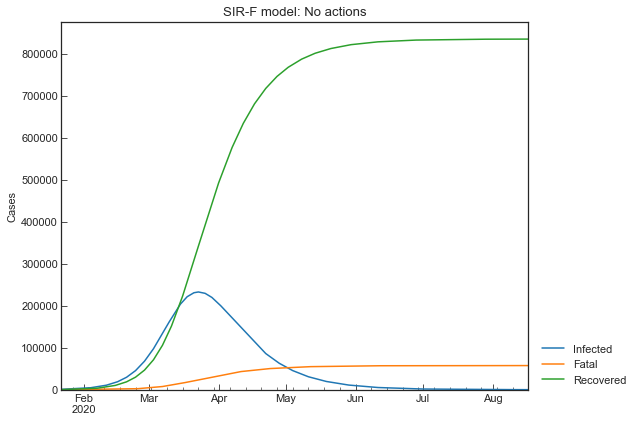

In [93]:
simulator = cs.ODESimulator(country="Example", province="No actions")
simulator.add(
    model=cs.SIRF,
    step_n=15,
    population=eg_population,
    param_dict=param_dict,
    y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
)
simulator.add(
    model=cs.SIRF,
    step_n=int(latent_waiting_day),
    population=eg_population,
    param_dict=param_dict
)
simulator.add(
    model=cs.SIRF,
    step_n=180,
    population=eg_population,
    param_dict=param_dict
)
simulator.run()
pred_df_no = simulator.dim(tau=eg_tau, start_date="22Jan2020").set_index("Date")
cs.line_plot(
    pred_df_no[["Infected", "Fatal", "Recovered"]],
    "SIR-F model: No actions", h=eg_population, y_integer=True
)

With lockdown from 15th day:

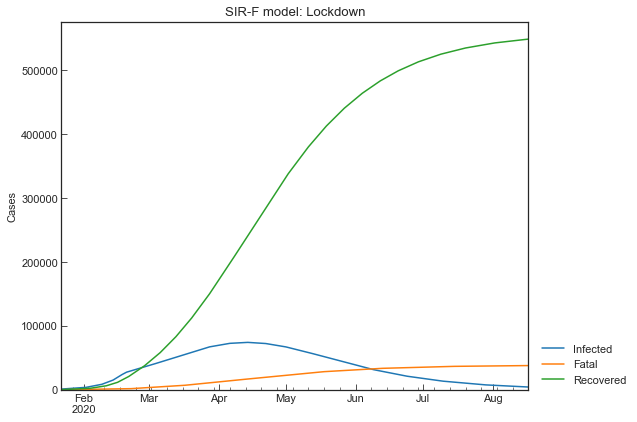

In [94]:
simulator = cs.ODESimulator(country="Example", province="Lockdown")
simulator.add(
    model=cs.SIRF,
    step_n=15,
    population=eg_population,
    param_dict=param_dict,
    y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
)
simulator.add(
    model=cs.SIRF,
    step_n=int(latent_waiting_day),
    population=eg_population,
    param_dict=param_dict
)
simulator.add(
    model=cs.SIRF,
    step_n=180,
    population=eg_population,
    param_dict=lock_param_dict
)
simulator.run()
pred_df_lock = simulator.dim(tau=eg_tau, start_date="22Jan2020").set_index("Date")
cs.line_plot(
    pred_df_lock[["Infected", "Fatal", "Recovered"]],
    "SIR-F model: Lockdown", h=eg_population, y_integer=True
)

In [95]:
_last_date = pred_df_no.index[-1].strftime("%d%b%Y")
_dict = {
    "No actions": {
        "max(Infected)": pred_df_no["Infected"].max(),
        "argmax(Infected)": pred_df_no["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_no["Infected"][-1],
    },
    "With lockdown": {
        "max(Infected)": pred_df_lock["Infected"].max(),
        "argmax(Infected)": pred_df_lock["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_lock["Infected"][-1],
    }   
}
pd.DataFrame.from_dict(_dict, orient="index")

,max(Infected),argmax(Infected),Infected on 17Aug2020
No actions,232807.0,2020-03-23,104.0
With lockdown,74113.0,2020-04-14,4191.0


The actions result in:  
* reduction of max value of Infected,
* delay of peak point (argmax) of Infected, and
* extention of period with COVID-19.

## Control factors of recovery rate $\gamma$ and mortality rate $\alpha_2$
Here, let's reconsider I $\overset{\gamma}{\longrightarrow}$ R and I $\overset{\alpha_2}{\longrightarrow}$ F.  
Because balance of immunity (+effect of treatments) and virulence determines whether patients can recover or not, the formulas can be replaced with  

\begin{align*}
& \mathrm{I} \overset{\bar{h}}{\longrightarrow} \mathrm{I}^\star \overset{\bar{s}}{\longrightarrow} \mathrm{F}^\star \overset{L^{-1}}{\longrightarrow} \mathrm{F}    \\
& \mathrm{I} \overset{f_2}{\longrightarrow} \mathrm{R}^\star \overset{l^{-1}}{\longrightarrow} \mathrm{R}    \\
\end{align*}

I$^\star$: Confirmed cases whose immune systems did not overcome virus multiplication, and <u>without</u> severe events  
F$^\star$: Confirmed cases whose immune systems did not overcome virus multiplication, and <u>with</u> severe events  
R$^\star$: Confirmed cases whose immune systems overcame virus multiplication or comfirmed cases whose severe events can be stopped

$f_2 = 1 - \bar{h}\ \bar{s}$  

$\bar{h}$: Rate of I whose immune systems does NOT overcame virus multiplication [-]  
$\bar{s}$: Rate of I$^\star$ who have severe events, including respiratory failure  [-]  
$L_i$: Inverse of F$^\star$'s mortality rate for people $i$ years old [min]  
$l_i$: Inverse of R$^\star$'s mortality rate for people $i$ years old [min]  
$P_i$: The number of people $i$ years old [-]  
$N$: Total population  

\begin{align*}
& \alpha_2 = \cfrac{\bar{h}\ \bar{s}}{N} \sum_{n=0}^{\infty}\cfrac{P_{i}}{L_i} \\
& \gamma = \cfrac{1 - \bar{h}\ \bar{s}}{N} \sum_{n=0}^{\infty}\cfrac{P_{i}}{l_i} \\
\end{align*}

## $\bar{h}$ and $\bar{s}$ value before actions are taken
We assume that $\bar{h}=0.5$ and $\bar{s}=0.5$.  
**(Using population distribution data and case reports, $\bar{h}\ \bar{s}$ and $1 - \bar{h}\ \bar{s}$ can be calculated.)**

In [96]:
gamma_before = param_dict["sigma"] / eg_tau
alpha2_before = param_dict["kappa"] / eg_tau
(gamma_before, alpha2_before)

(5.208333333333333e-05, 3.4722222222222224e-06)

In [97]:
h_bar_before, s_bar_before = 0.5, 0.5

## $\bar{h}$ and $\bar{s}$ value AFTER actions are taken
Assumtions of new medicines:  
"Protease inhibitor" inhibits virus multiplication. This will reduce $\bar{h}$. We assume that $\bar{h}$ will be 10% of $\bar{h}_{before}$.

In [98]:
h_bar_after = h_bar_before * 0.1
s_bar_after = s_bar_before
(h_bar_after, s_bar_after)

(0.05, 0.5)

## Impact on $\gamma$ and $\alpha_2$
Actions to take:  
New Protein inhibitor medicine was introduced.

In [99]:
gamma_after = gamma_before * (1 - h_bar_after * s_bar_after) / (1 - h_bar_before * s_bar_before)
gamma_after

6.770833333333333e-05

In [100]:
alpha2_after = alpha2_before * (h_bar_after * s_bar_after) / (h_bar_before * s_bar_before)
alpha2_after

3.4722222222222224e-07

## Predict the number of case: with new medicines from 15th day

In [101]:
param_dict = sirf_param_dict.copy()
med_param_dict = param_dict.copy()
med_param_dict["sigma"] = param_dict["sigma"] * gamma_after / gamma_before
med_param_dict["kappa"] = param_dict["kappa"] * alpha2_after / alpha2_before
df = pd.DataFrame.from_dict(
    {"No actions": param_dict, "Medicine": med_param_dict},
    orient="index"
)
df = df.loc[:, ["theta", "kappa", "rho", "sigma"]]
df["R0"] = df.apply(lambda x: cs.SIRF(eg_population, **x.to_dict()).calc_r0(), axis=1)
df["tau"] = eg_tau
df

,theta,kappa,rho,sigma,R0,tau
No actions,0.002,0.0050,0.2,0.0750,2.50,1440
Medicine,0.002,0.0005,0.2,0.0975,2.04,1440


No actions:

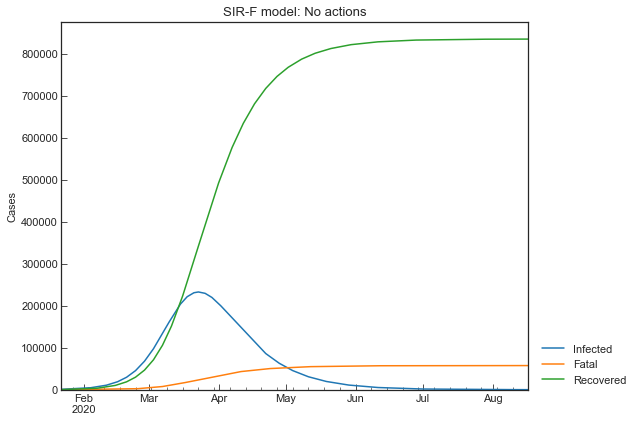

In [102]:
simulator = cs.ODESimulator(country="Example", province="No actions")
simulator.add(
    model=cs.SIRF,
    step_n=15,
    population=eg_population,
    param_dict=param_dict,
    y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
)
simulator.add(
    model=cs.SIRF,
    step_n=int(latent_waiting_day),
    population=eg_population,
    param_dict=param_dict
)
simulator.add(
    model=cs.SIRF,
    step_n=180,
    population=eg_population,
    param_dict=param_dict
)
simulator.run()
pred_df_no = simulator.dim(tau=eg_tau, start_date="22Jan2020").set_index("Date")
cs.line_plot(
    pred_df_no[["Infected", "Fatal", "Recovered"]],
    "SIR-F model: No actions", h=eg_population, y_integer=True
)

With new medicines:

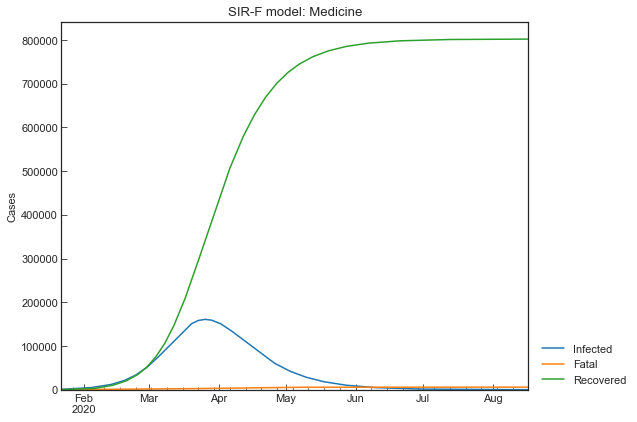

In [103]:
simulator = cs.ODESimulator(country="Example", province="Medicine")
simulator.add(
    model=cs.SIRF,
    step_n=15,
    population=eg_population,
    param_dict=param_dict,
    y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
)
simulator.add(
    model=cs.SIRF,
    step_n=int(latent_waiting_day) + 180,
    population=eg_population,
    param_dict=med_param_dict
)
simulator.run()
pred_df_med = simulator.dim(tau=eg_tau, start_date="22Jan2020").set_index("Date")
cs.line_plot(
    pred_df_med[["Infected", "Fatal", "Recovered"]],
    "SIR-F model: Medicine", h=eg_population, y_integer=True
)

In [104]:
_last_date = pred_df_no.index[-1].strftime("%d%b%Y")
_dict = {
    "No actions": {
        "max(Infected)": pred_df_no["Infected"].max(),
        "argmax(Infected)": pred_df_no["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_no["Infected"][-1],
        f"Fatal on {_last_date}": pred_df_no["Fatal"][-1],
    },
    "Lockdown": {
        "max(Infected)": pred_df_lock["Infected"].max(),
        "argmax(Infected)": pred_df_lock["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_lock["Infected"][-1],
        f"Fatal on {_last_date}": pred_df_lock["Fatal"][-1],
    },
    "Medicine": {
        "max(Infected)": pred_df_med["Infected"].max(),
        "argmax(Infected)": pred_df_med["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_med["Infected"][-1],
        f"Fatal on {_last_date}": pred_df_med["Fatal"][-1],
    }
}
pd.DataFrame.from_dict(_dict, orient="index")

,max(Infected),argmax(Infected),Infected on 17Aug2020,Fatal on 17Aug2020
No actions,232807.0,2020-03-23,104.0,57458.0
Lockdown,74113.0,2020-04-14,4191.0,37786.0
Medicine,160879.0,2020-03-26,83.0,5919.0


New medicines result in:  
* reduction of max value of Infected,
* reduction of Fatal, and
* shortened period with COVID-19.

## If 1,000/day are vaccinated (SIR-FV model) from 15th day
We will predict the numbers of cases in the assumption that 10,000 persons will be vacctinated in one day until there are no susceptible people.  

\begin{align*}
& \frac{\mathrm{d}x}{\mathrm{d}t}= - \rho x y - \omega  \\
& \frac{\mathrm{d}y}{\mathrm{d}t}= \rho (1-\theta) x y - (\sigma + \kappa) y  \\
& \frac{\mathrm{d}z}{\mathrm{d}t}= \sigma y  \\
& \frac{\mathrm{d}w}{\mathrm{d}t}= \rho \theta x y + \kappa y  \\
\end{align*}

Where $\omega_{(x>0)}=\frac{1,000}{N}$ and $N$ is the total population.

Reproduction number can be defined as  
\begin{align*}
R_0 = \rho (1 - \theta) (\sigma + \kappa)^{-1}
\end{align*}

In [105]:
print(f"Total population is {eg_population:,}.")

Total population is 1,000,000.


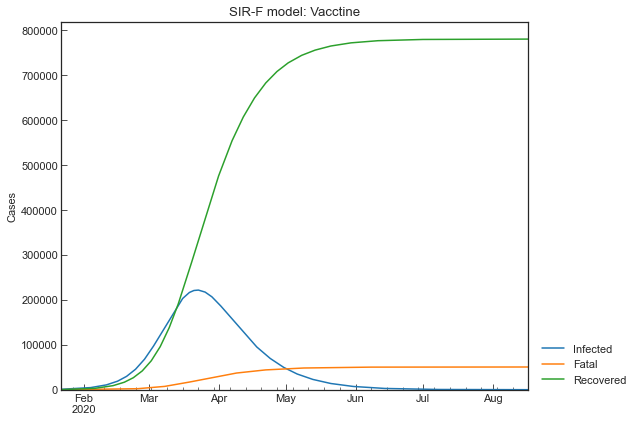

In [106]:
vac_param_dict = param_dict.copy()
vac_param_dict["omega"] = 1_000 / eg_population

simulator = cs.ODESimulator(country="Example", province="Vacctine")
simulator.add(
    model=cs.SIRF,
    step_n=15,
    population=eg_population,
    param_dict=param_dict,
    y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
)
simulator.add(
    model=cs.SIRF,
    step_n=int(latent_waiting_day),
    population=eg_population,
    param_dict=param_dict
)
simulator.add(
    model=cs.SIRFV,
    step_n=180,
    population=eg_population,
    param_dict=vac_param_dict,
    y0_dict={"Vaccinated": 0}
)
simulator.run()
pred_df_vac = simulator.dim(tau=eg_tau, start_date="22Jan2020").set_index("Date")
cs.line_plot(
    pred_df_vac[["Infected", "Fatal", "Recovered"]],
    "SIR-F model: Vacctine", h=eg_population, y_integer=True
)

In [107]:
_last_date = pred_df_no.index[-1].strftime("%d%b%Y")
_dict = {
    "No actions": {
        "max(Infected)": pred_df_no["Infected"].max(),
        "argmax(Infected)": pred_df_no["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_no["Infected"][-1],
        f"Fatal on {_last_date}": pred_df_no["Fatal"][-1],
    },
    "Lockdown": {
        "max(Infected)": pred_df_lock["Infected"].max(),
        "argmax(Infected)": pred_df_lock["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_lock["Infected"][-1],
        f"Fatal on {_last_date}": pred_df_lock["Fatal"][-1],
    },
    "Medicine": {
        "max(Infected)": pred_df_med["Infected"].max(),
        "argmax(Infected)": pred_df_med["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_med["Infected"][-1],
        f"Fatal on {_last_date}": pred_df_med["Fatal"][-1],
    },
    "Vacctine": {
        "max(Infected)": pred_df_vac["Infected"].max(),
        "argmax(Infected)": pred_df_vac["Infected"].idxmax(),
        f"Infected on {_last_date}": pred_df_vac["Infected"][-1],
        f"Fatal on {_last_date}": pred_df_vac["Fatal"][-1],
    }
}
pd.DataFrame.from_dict(_dict, orient="index")

,max(Infected),argmax(Infected),Infected on 17Aug2020,Fatal on 17Aug2020
No actions,232807.0,2020-03-23,104.0,57458.0
Lockdown,74113.0,2020-04-14,4191.0,37786.0
Medicine,160879.0,2020-03-26,83.0,5919.0
Vacctine,221598.0,2020-03-23,22.0,50508.0


Vacctines result in:  
* reduction of max value of Infected,
* reduction of Fatal, and
* shortened period with COVID-19.

# S-R trend analysis<a id="10"></a>
In the previous section, we found that parameter values can be changed by actions. To predict the future, we need to recognize the parameter change from the actual records. Here, trend analysis method will be introduced.

## Example datasets
With the same initial values $(x_{(0)}, y_{(0)}, z_{(0)}, w_{(0)})=(0.999, 0.001, 0, 0)$, we will create five SIR-F example datasets.
* Example 1: $(\theta, \kappa, \rho, \sigma) = (0.0002, 0.005, 0.20, 0.075)$
* Example 2: $(\theta, \kappa, \rho, \sigma) = (0.0002, 0.005, \underline{0.40}, 0.075)$, spread quickly
* Example 3: $(\theta, \kappa, \rho, \sigma) = (0.0002, 0.005, \underline{0.15}, 0.075)$, spread slowly
* Example 4: $(\theta, \kappa, \rho, \sigma) = (0.0002, \underline{0.003}, 0.20, \underline{0.150})$, improved heakthcare system
* Example 5: $(\theta, \kappa, \rho, \sigma) = (\underline{0.0000}, 0.005, 0.20, 0.075)$, as the same as SIR-D model

Values are dimensionalized with total population $N=1,000,000$ in the example datasets.

In [108]:
df = pd.DataFrame()
eg_step_n = 200
eg_param_dict = {
    "1": {"theta": 0.0002, "kappa": 0.005, "rho": 0.20, "sigma": 0.075},
    "2": {"theta": 0.0002, "kappa": 0.005, "rho": 0.40, "sigma": 0.075},
    "3": {"theta": 0.0002, "kappa": 0.005, "rho": 0.15, "sigma": 0.075},
    "4": {"theta": 0.0002, "kappa": 0.003, "rho": 0.20, "sigma": 0.150},
    "5": {"theta": 0.0000, "kappa": 0.005, "rho": 0.20, "sigma": 0.075},
}

for (num, _dict) in eg_param_dict.items():
    simulator = cs.ODESimulator(country=f"Example {num}")
    simulator.add(
        model=cs.SIRF,
        step_n=eg_step_n,
        population=eg_population,
        param_dict=_dict,
        y0_dict={"Susceptible": 999_000, "Infected": 1000, "Recovered": 0, "Fatal": 0}
    )
    simulator.run()
    _df = simulator.dim(tau=eg_tau, start_date="22Jan2020")
    df = pd.concat([df, _df], axis=0, ignore_index=True)

df["Confirmed"] = df[["Infected", "Recovered", "Fatal"]].sum(axis=1)
eg_ncov_df = df.copy()
eg_ncov_df.tail()

,Date,Country,Province,Susceptible,Infected,Recovered,Fatal,Confirmed
1000,2020-08-05,Example 5,-,111067.0,224.0,833165.0,55544.0,888933.0
1001,2020-08-06,Example 5,-,111062.0,211.0,833181.0,55545.0,888937.0
1002,2020-08-07,Example 5,-,111057.0,199.0,833197.0,55546.0,888942.0
1003,2020-08-08,Example 5,-,111053.0,188.0,833211.0,55547.0,888946.0
1004,2020-08-09,Example 5,-,111049.0,178.0,833225.0,55548.0,888951.0


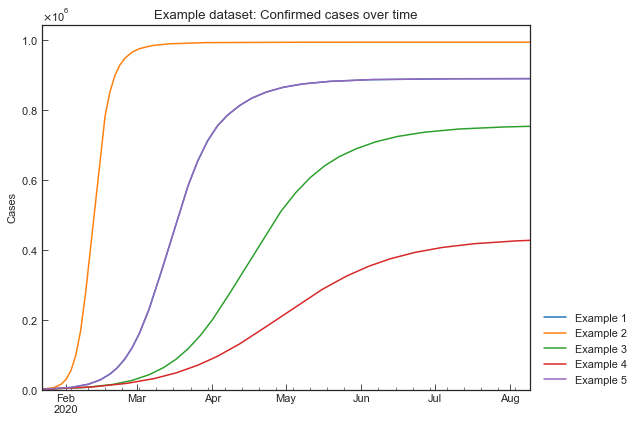

In [109]:
cs.line_plot(
    eg_ncov_df.pivot_table(index="Date", columns="Country", values="Confirmed"),
    "Example dataset: Confirmed cases over time"
)

Values of Example 1 $(\kappa=0.002)$ are nealy equal to that of Example 5 $(\kappa=0.000)$ as shown in the next figure.

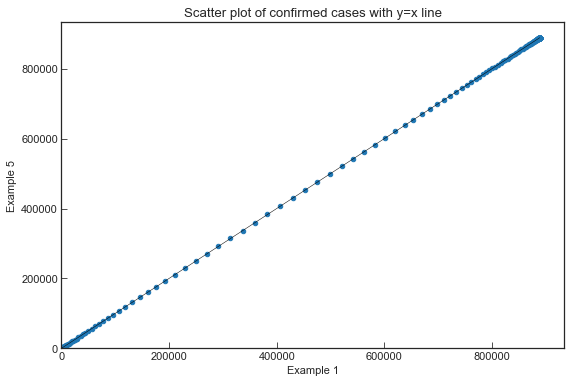

In [110]:
df = eg_ncov_df.pivot_table(index="Date", columns="Country", values="Confirmed")
df.plot.scatter(x="Example 1", y="Example 5")
plt.plot(df["Example 1"], df["Example 1"], color="black", linewidth=0.5)
plt.xlim(0, None)
plt.ylim(0, None)
plt.title("Scatter plot of confirmed cases with y=x line")
plt.show()

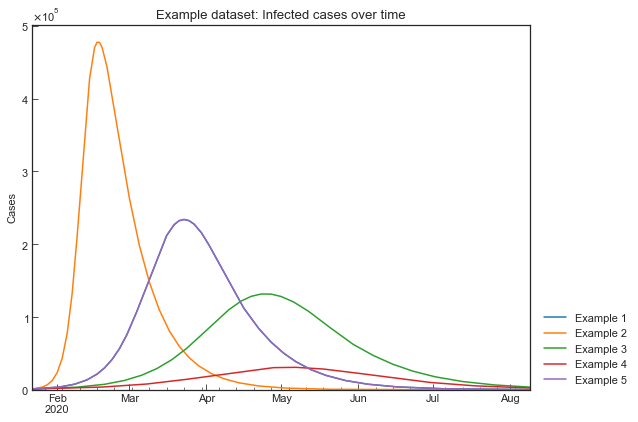

In [111]:
cs.line_plot(
    eg_ncov_df.pivot_table(index="Date", columns="Country", values="Infected"),
    "Example dataset: Infected cases over time"
)

Note: This seems Gamma distribution curve.
\begin{align*}
f(x>0) & = \cfrac{\lambda^{k}}{\Gamma(k)} x^{k-1} e^{-\lambda x}  \\
\Gamma(k) & = \int_{0}^{\infty} t^{k-1} e^{-t} dt
\end{align*}

Curve fitting with Gamma distribution curve is done by Bill Holst. Please find the URLs in ["Acknowledgement" subsection](#3).

## $\Delta$Confirmed vs. Confirmed in log-log plot
The numer of new confirmed cases $\Delta C$ can be desribed as,
\begin{align*}
\Delta C=N^{-1}\beta (N - C) I
\end{align*}
This is because $C=I+R+F$ and $S=N-C$ in SIR-F model.

$t$ is a measurable variable, but this is just an intermediate variable. $\Delta C$ is determined by cummurative number of cases.

In addition, $I$ is determined by $C$ when the parameters $(\alpha_1, \alpha_2, \beta, \gamma)$ are fixed.  
Then,
$$\Delta C = f(C)$$

Plots of $(x, y) = (C, \Delta C)$ in log-log scale are shown in the next figure.  

Note:  
This idea is from [YouTube: How To Tell If We're Beating COVID-19](https://www.youtube.com/watch?v=54XLXg4fYsc). SIR-type models are not mentioned in this video, but we can link the idea with SIR-F model as above.

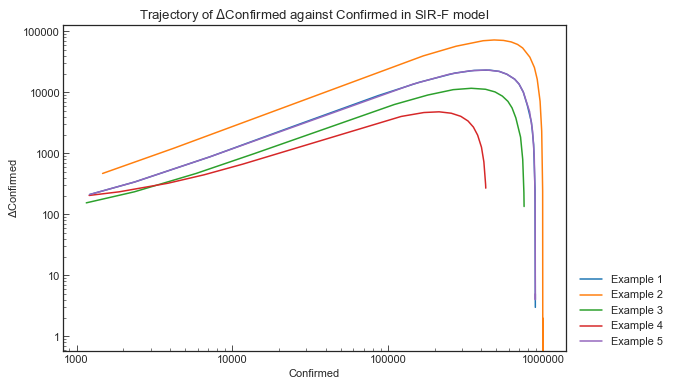

In [112]:
for country in eg_ncov_df["Country"].unique():
    df = eg_ncov_df.copy()
    df = df.loc[df["Country"] == country, :]
    df = df.groupby("Date").last()
    plt.plot(df["Confirmed"], df["Confirmed"].diff(), label=country)

plt.title(r"Trajectory of $\Delta$Confirmed against Confirmed in SIR-F model")
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Confirmed")
plt.ylabel(r"$\Delta$Confirmed")
fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
fmt.set_scientific(False)
plt.gca().xaxis.set_major_formatter(fmt)
plt.gca().yaxis.set_major_formatter(fmt)
plt.legend(bbox_to_anchor=(1.02, 0), loc="lower left", borderaxespad=0)
plt.show()

Nete: Because $C(t)$ is a cummurative number, $C(t+\Delta t) \geq C(t)$ for all $t$ and $\Delta t > 0$.

## argmax($\Delta C$) in $(x, y) = (t, C(t))$ plot
What can we know from $(C, \Delta C)$ plot? Here, we will discuss max value of $\Delta C$.

When $\Delta C$ shows max value of $\Delta C$ in "Example 5" dataset (equal to SIR-D model), $t$ and $C(t)$ is

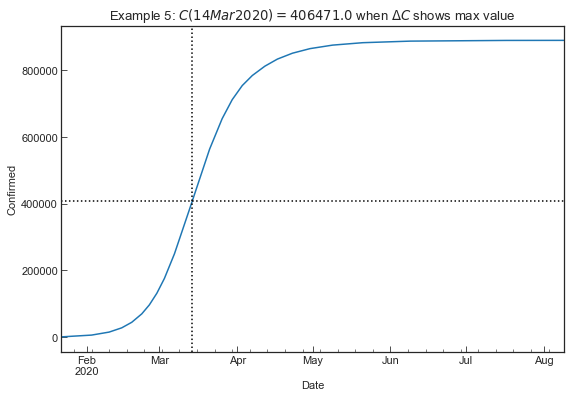

In [113]:
country = "Example 5"
df = eg_ncov_df.copy()
df = df.loc[df["Country"] == country, :].groupby("Date").last()
arg_tt = df["Confirmed"].diff().idxmax()
arg_cc = df.loc[arg_tt, "Confirmed"]
# Plot
df["Confirmed"].plot()
plt.axhline(y=arg_cc, color="black", linestyle=":")
plt.axvline(x=arg_tt, color="black", linestyle=":")
plt.ylabel("Confirmed")
plt.title(
    r'{0}: $C({1})={2}$ when $\Delta C$ shows max value'.format(
        country, arg_tt.strftime("%d%b%Y"), arg_cc)
)
fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
fmt.set_scientific(False)
plt.gca().yaxis.set_major_formatter(fmt)
plt.show()

## Curve fitting of $C(t)$
$C(t)$ is sometimes described by logistic function and Gompertz function.

\begin{align*}
\mathrm{Logistic\ function:\ } g(t) & = \cfrac{N}{1 + A e^{-Bt}}  \\
\mathrm{Gompertz\ function:\ } h(t) & = N e^{-A e^{-Bt}}
\end{align*}

cf.)  
These functions are used for prediction of the number of case in [Jia, Lin, et al., 2020](https://arxiv.org/ftp/arxiv/papers/2003/2003.05447.pdf).  

$f(t)$ can be divided to to stages;
* exponential growth function $(t \leq \mathrm{argmax}\ \Delta C(t))$ and
* negative exponential function $(otherwise)$.

With constant $(a, b, A, B, C)$,
$$
f(t) = \left\{
\begin{array}{ll}
    a e^{bt} & (t \leq \mathrm{argmax}\ \Delta C(t)) \\
    C - Ae^{-Bt} & (otherwise)
\end{array}
\right.
$$

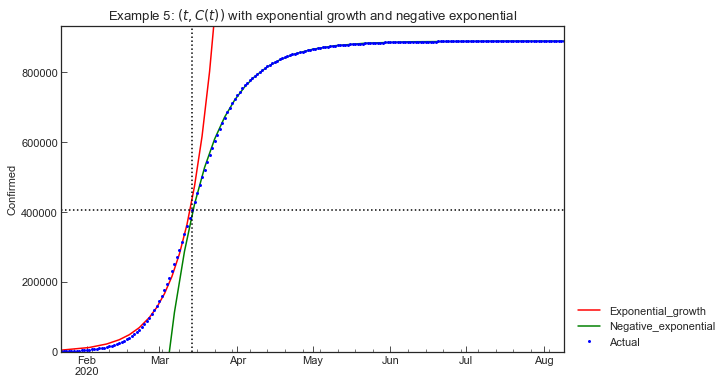

In [114]:
country = "Example 5"
df = eg_ncov_df.copy()
df = df.loc[df["Country"] == country, :].groupby("Date").last()
start_date = df.index.min()
arg_tt = df["Confirmed"].diff().idxmax()
arg_dd = int((arg_tt - start_date).total_seconds() / 60 / 60 / 24)
arg_cc = df.loc[arg_tt, "Confirmed"]
# Convert date to elapsed time (day)
df.index = ((df.index - start_date).total_seconds() / 60 / 60 / 24).astype(np.int64)
# Curve fitting with exponential growth function
f = lambda x, a, b: a * np.exp(b * x)
series = df.loc[df.index <= arg_dd, "Confirmed"]
a_ini = series[0]
b_ini = np.log(arg_cc / a_ini) / arg_dd
param, _ = sci.optimize.curve_fit(f, series.index, series, p0=[a_ini, b_ini])
f_partial = functools.partial(f, a=param[0], b=param[1])
df["Exponential_growth"] = pd.Series(df.index).apply(lambda x: f_partial(x))
# Curve fitting with negative exponential function
f = lambda x, a, b, c: c - a * np.exp(- b * (x - arg_dd))
series = df.loc[df.index >= arg_dd, "Confirmed"]
c_ini = series.max()
a_ini = c_ini - arg_cc
b_ini = series.diff()[arg_dd + 1] / a_ini
param, _ = sci.optimize.curve_fit(f, series.index, series, p0=[a_ini, b_ini, c_ini])
f_partial = functools.partial(f, a=param[0], b=param[1], c=param[2])
df["Negative_exponential"] = pd.Series(df.index).apply(lambda x: f_partial(x))
# Convert elapsed time (day) to date
df.index = start_date + pd.Series(df.index).apply(lambda x: timedelta(days=x))
# Plot
df[["Exponential_growth", "Negative_exponential"]].plot(color=["red", "green"])
df["Actual"] = df["Confirmed"]
df["Actual"].plot(color="blue", marker=".", markeredgewidth=0, linewidth=0)
plt.axhline(y=arg_cc, color="black", linestyle=":")
plt.axvline(x=arg_tt, color="black", linestyle=":")
plt.ylabel("Confirmed")
plt.ylim(0, max(df["Confirmed"]) * 1.05)
plt.title(r"{0}: $(t, C(t))$ with exponential growth and negative exponential".format(country))
fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
fmt.set_scientific(False)
plt.gca().yaxis.set_major_formatter(fmt)
plt.legend(bbox_to_anchor=(1.02, 0), loc="lower left", borderaxespad=0)
plt.show()

However, errors were found for curve fitting when $t \leq \mathrm{argmax}\ \Delta C(t)$.  
This is because
$$
\cfrac{\mathrm{d}C}{\mathrm{d}T} = \cfrac{\beta}{N} S I
$$
$S \simeq N: const.$ for $t \leq \mathrm{argmax}\ \Delta C(t)$, but $I$ is not proportinal to $C$ in SIR-like model.  

This means we cannot convert the differencial equation to the following equations.
\begin{align*}
\frac{\mathrm{d}x}{\mathrm{d}t} & = B x \\
\mathrm{i.e.\ } x(t) & = A e^{Bt}
\end{align*}

## S-R plane
Here, we will discuss the replationship of Susceptible and Recovered.

In SIR-F model,
\begin{align*}
\frac{\mathrm{d}S}{\mathrm{d}T} &= - \cfrac{\beta}{N} S I  \\
\frac{\mathrm{d}R}{\mathrm{d}T} &= \gamma I  \\
I &> 0 \\
S & \simeq N \ \mathrm{when}\ R = 0\\
\end{align*}

Then,
\begin{align*}
\cfrac{\mathrm{d}S}{\mathrm{d}R} &= - \cfrac{\beta}{N \gamma} S  \\
\end{align*}

This leads to

In [115]:
S = sym.symbols("S", cls=sym.Function)
N, R = sym.symbols("N R", positive=True)
beta, gamma = sym.symbols(r"\beta \gamma", positive=True)
dSdR = - beta / (N * gamma) * S(R)
sr = sym.dsolve(S(R).diff(R) - dSdR, hint="separable", ics={S(0): N})
sr

Eq(S(R), N*exp(-R*\beta/(N*\gamma)))

Note:  
This idea is from [Balkew, Teshome Mogessie, "The SIR Model When S(t) is a Multi-Exponential Function." (2010).Electronic Theses and Dissertations.Paper 1747.](https://dc.etsu.edu/cgi/viewcontent.cgi?article=3102&context=etd) This is for simplest SIR model, but we can apply it to SIR-F model.

In [116]:
sym.Eq(sym.simplify(sym.log(sr.lhs)), sym.simplify(sym.log(sr.rhs)))

Eq(log(S(R)), log(N) - R*\beta/(N*\gamma))

With constant $a=\frac{\beta}{N\gamma}$ and constant $b=\log N$,
$$
\log S_{(R)} = - a R + b
$$

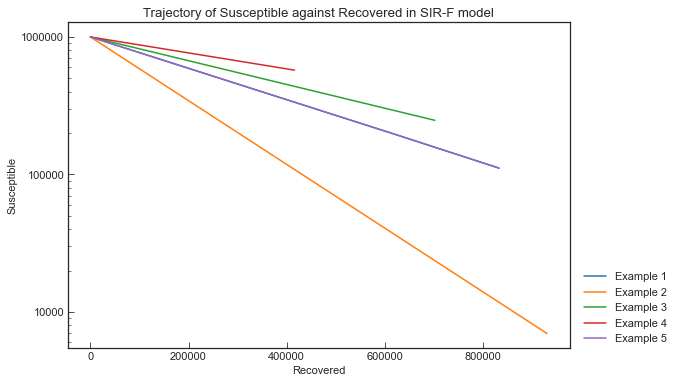

In [117]:
for country in eg_ncov_df["Country"].unique():
    df = eg_ncov_df.copy()
    df = df.loc[df["Country"] == country, :]
    df = df.groupby("Date").last()
    plt.plot(df["Recovered"], eg_population - df["Confirmed"], label=country)

plt.title(r"Trajectory of Susceptible against Recovered in SIR-F model")
plt.yscale("log")
plt.xlabel("Recovered")
plt.ylabel("Susceptible")
fmt = matplotlib.ticker.ScalarFormatter(useOffset=False)
fmt.set_scientific(False)
plt.gca().xaxis.set_major_formatter(fmt)
plt.gca().yaxis.set_major_formatter(fmt)
plt.legend(bbox_to_anchor=(1.02, 0), loc="lower left", borderaxespad=0)
plt.show()

Nete: Because $R(t)$ is a cummurative number, $R(t+\Delta t) \geq R(t)$ for all $t$ and $\Delta t > 0$.

**Thus, slope of $\log S_{(R)}$ will be changed when SIR-F parameters are changed. We need to split the actual data, considering the change points of S-R line in log-scale. This logic will be used for actual data in scenario analysis section.**

## S-R trend of actual data in one country
We will perform S-R trend analysis for actual data in Italy as an example.

Let's see the plot of S-R trend.

C:\Users\sonal\OneDrive\Desktop\Covid19_project\covid19-sir-2.2.0\covsirphy\phase\trend.py:192: MatplotlibDeprecationWarning:

The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.



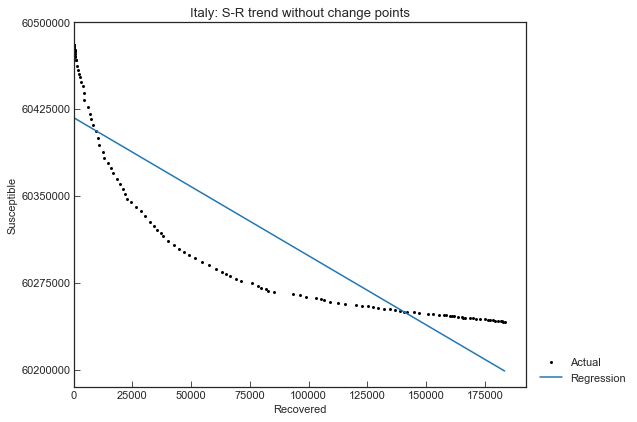

In [118]:
ita_scenario = cs.Scenario(jhu_data, pop_data, "Italy")
ita_scenario.trend()

Plots of Actual data do not show a line. This means SIR-F parameters were changed at some time-points. In the next section, we will find the time-points, assuming that there are four change points in Italy dataset.

# Scenario in Italy<a id="7"></a>
In this section, we will perform scenario analysis using the records of Italy.

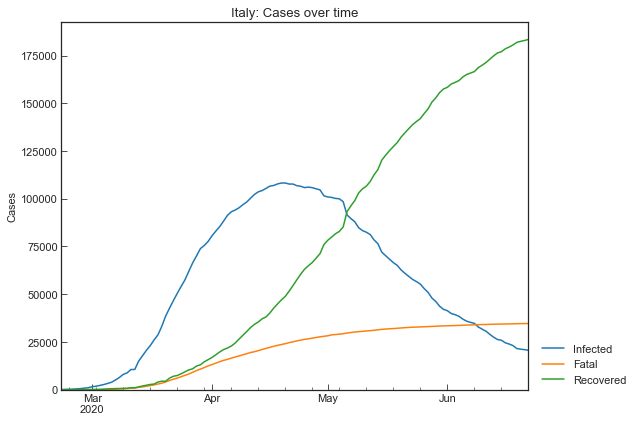

,Date,Confirmed,Infected,Fatal,Recovered
139,2020-06-18,238159,23101,34514,180544
140,2020-06-19,238011,21543,34561,181907
141,2020-06-20,238275,21212,34610,182453
142,2020-06-21,238499,20972,34634,182893
143,2020-06-22,238720,20637,34657,183426


In [119]:
ita_scenario = cs.Scenario(jhu_data, pop_data, "Italy")
ita_scenario.records().tail()

## S-R Trend analysis

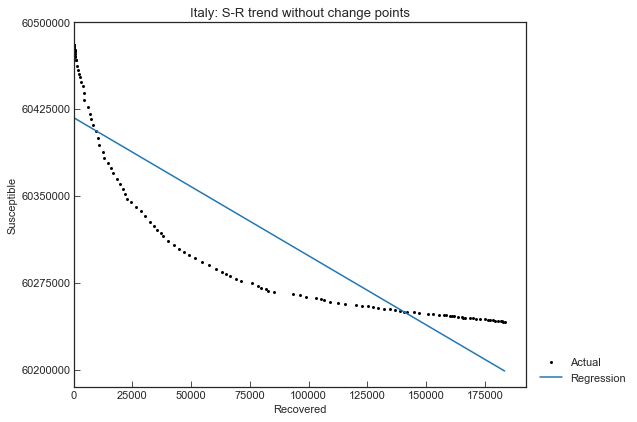

In [120]:
ita_scenario.trend()

**We will find the time-points, assuming that there are four change points.**

Finding change points of S-R trend...
Finished 170 trials in 0 min 38 sec..


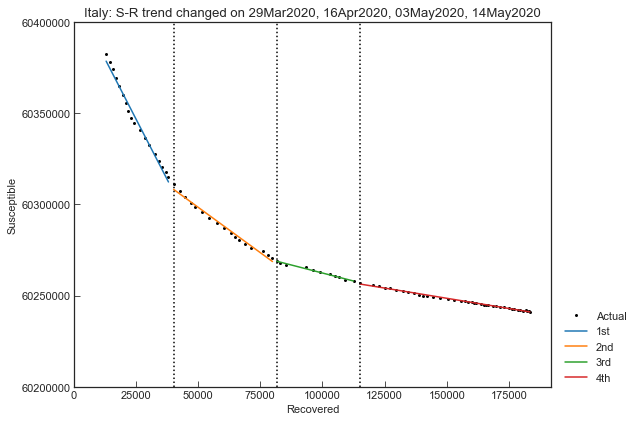

In [121]:
ita_scenario.trend(n_points=4)

## Phases in Italy
We will use the change points as the start date of phases. For each phase, will apply SIR-F model. $\tau$ values will be the same value.

In [122]:
ita_scenario.summary()

,Type,Start,End,Population
1st,Past,29Mar2020,15Apr2020,60480000
2nd,Past,16Apr2020,02May2020,60480000
3rd,Past,03May2020,13May2020,60480000
4th,Past,14May2020,22Jun2020,60480000


## Estimate SIR-F parameters

In [123]:
ita_scenario.estimate(cs.SIRF)

1st phase with SIR-F model:
	Running optimization...
	Finished 161 trials in 0 min 34 sec..
2nd phase with SIR-F model:
	Running optimization...
	Finished 92 trials in 0 min 10 sec..
3rd phase with SIR-F model:
	Running optimization...
	Finished 91 trials in 0 min 10 sec..
4th phase with SIR-F model:
	Running optimization...
	Finished 70 trials in 0 min 10 sec..


### 1st phase

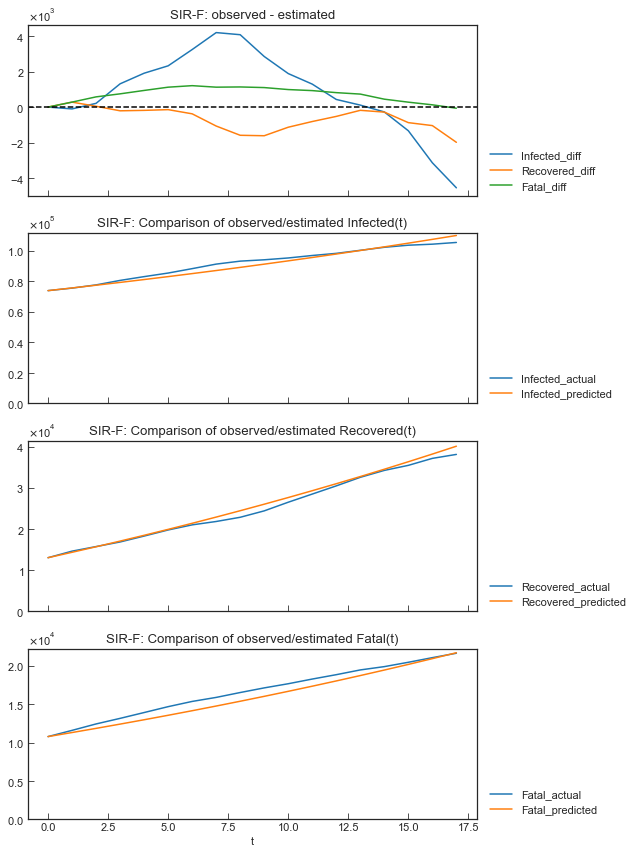

In [124]:
ita_scenario.estimate_accuracy(phase="1st")

### 2nd phase

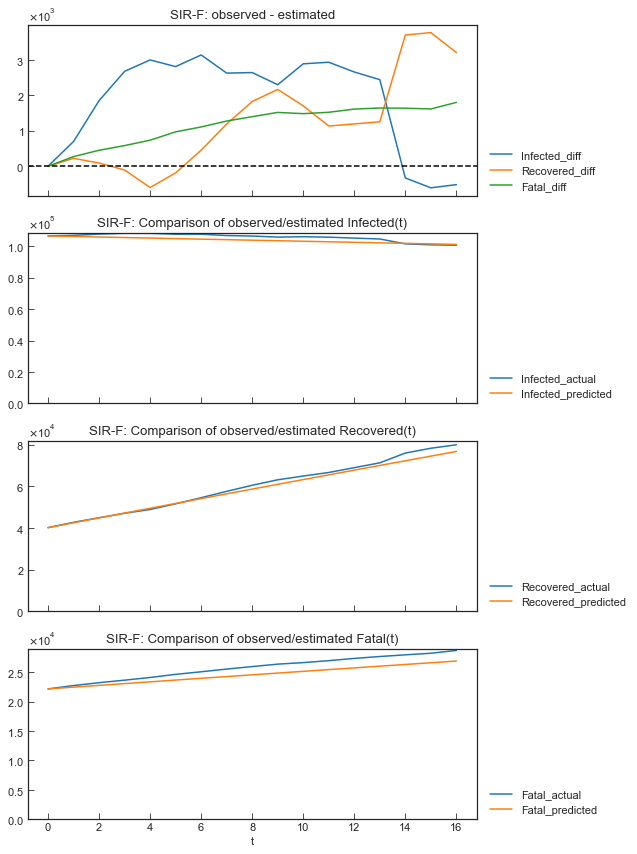

In [125]:
ita_scenario.estimate_accuracy(phase="2nd")

### 3rd phase

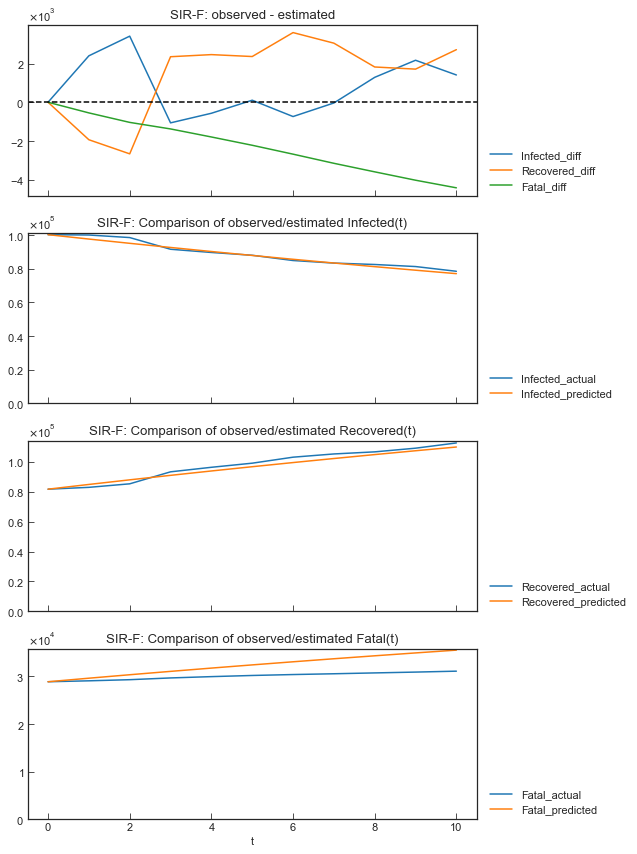

In [126]:
ita_scenario.estimate_accuracy(phase="3rd")

### 4th phase

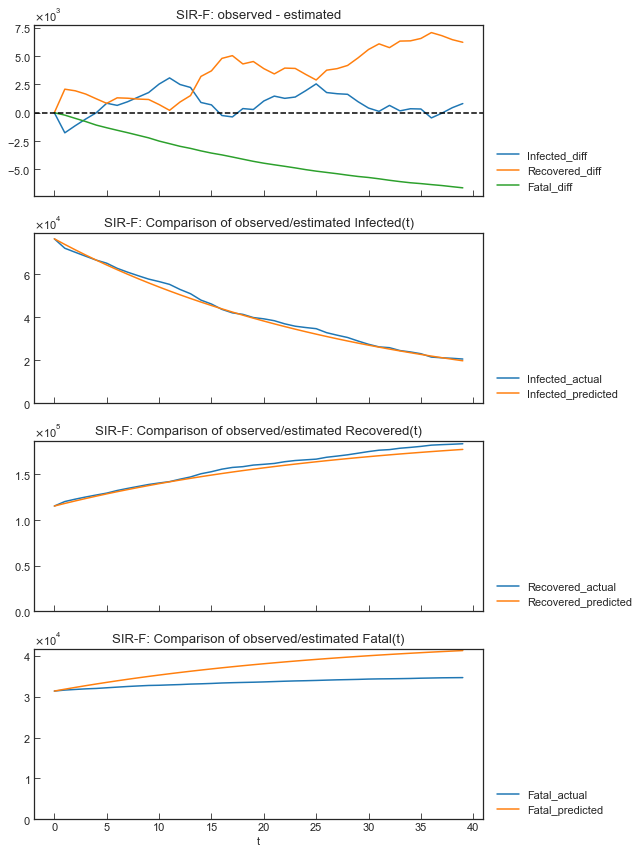

In [127]:
ita_scenario.estimate_accuracy(phase="4th")

### Compare parameters

In [128]:
ita_scenario.summary()

,Type,Start,End,Population,ODE,tau,rho,sigma,theta,kappa,Rt,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
1st,Past,29Mar2020,15Apr2020,60480000,SIR-F,1440,0.048128,0.017536,0.137403,0.000487,2.30,0.137,2053,20,57,0.061386,161,0 min 34 sec
2nd,Past,16Apr2020,02May2020,60480000,SIR-F,1440,0.021661,0.021983,0.051894,0.001729,0.87,0.052,578,46,45,0.052934,92,0 min 10 sec
3rd,Past,03May2020,13May2020,60480000,SIR-F,1440,0.013305,0.031974,0.532369,0.000478,0.19,0.532,2091,75,31,0.062821,91,0 min 10 sec
4th,Past,14May2020,22Jun2020,60480000,SIR-F,1440,0.009344,0.037855,0.520018,0.001213,0.11,0.520,824,107,26,0.174450,70,0 min 10 sec


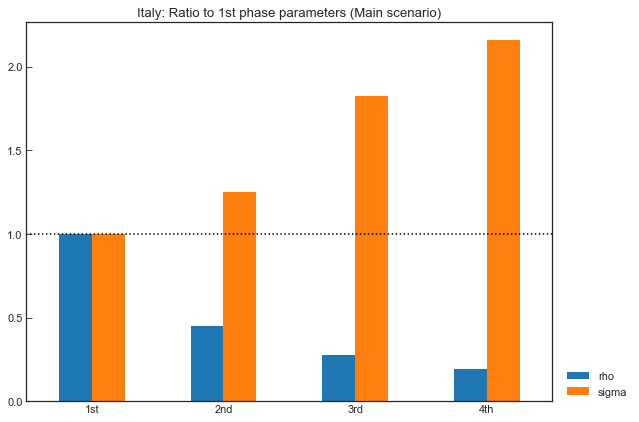

,rho,sigma
1st,1.000000,1.000000
2nd,0.450061,1.253567
3rd,0.276456,1.823300
4th,0.194157,2.158700


In [129]:
ita_scenario.param_history(targets=["rho", "sigma"])

**Non-dimensional effective contact rate $\rho$ was reduced in phases.**

## Why $\rho$ was reduced?

Measures taken in Italy are shown here.

In [130]:
def _color(data_df):
    df = data_df.copy()
    df.loc[:, :] = str()
    df.iloc[[3, 6, 8], :] = "background-color: lightgreen"
    return df

ita_action_df.style.apply(_color, axis=None)

,Region,Start_date,End_date,Action,Detail,Number_of_people
0,-,2020-01-30 00:00:00,NaT,Restriction of entry,All flights to and from China have been suspended,-1
1,-,2020-02-03 00:00:00,NaT,Leave from epidemic area,Return of people present in countries at risk and return of foreign citizens to the countries of origin exposed to the risk,-1
2,-,2020-02-06 00:00:00,NaT,Control in the Airport,Airport monitoring and control for domestic and international flights,62000
3,-,2020-02-21 00:00:00,2020-02-21 00:00:00,Quaranteene,"Mandatory quarantine isolation for close contacts with a positive cases, and provides active surveillance with fiduciary home permanence for those who have been in risk areas in the last 14 days",-1
4,"Lombardia,Veneto",2020-02-23 00:00:00,NaT,containment and management the Italian infected areas,decree-law introducing urgent measures regarding the containment and management of the epidemiological emergency from COVID-2019.,53856‬
5,"Emilia Romagna,Friuli Venezia Giulia, Lombardia, Veneto, Piemonte e Liguria,",2020-02-25 00:00:00,NaT,containment and management the Italian infected areas,decree-law introducing urgent measures regarding the containment and management of the epidemiological emergency from COVID-2019.,37447171‬
6,All,2020-03-04 00:00:00,2020-03-15 00:00:00,Close school and university,relative decree-law containing further measures to combat and contain the spread of the COVID-19 virus throughout the country,8466064
7,"Emilia Romagna,Friuli Venezia Giulia, Lombardia, Veneto, Piemonte e Liguria,",2020-03-07 00:00:00,2020-03-07 00:00:00,more containment and management the Italian infected areas,"prohibit any movement in Lombardy and in fourteen provinces of Veneto, Emilia Romagna, Piedmont, Marche.",-1
8,-,2020-03-09 00:00:00,2020-05-04 00:00:00,lockdown,people must stay at home and go out only for food or work needs. Many activities are closed and only the essential ones remain open.,60483973
9,-,2020-03-19 00:00:00,NaT,Medicine sperimentation,"testing began on the drug Tocilizumab, a drug used against rheumatoid arthritis that has had beneficial effects against COVID-19 in China.",330


**It seems that (quaranitine of person contacted with positive patients), school closure and lockdown reduced $\rho$ value.**

## Effect of school closure and lockdown

Acording to first report of [COVID-19 Mobility Monitoring project](https://covid19mm.github.io/in-progress/2020/03/13/first-report-assessment.html) on 13Mar2020, the government of Italy declared a national lockdown on 09Mar2020 and all peole are asked to remain home. This resulted in average reduction of potential encounters of 19% during week 3 (from 07Mar2020 to 10Mar2020).

**Here, we will predict the effect of school closure (started before 04Mar2020), lockdown on 13Mar2020 with assumtion that the effect will be shown from the start date of 3rd phase.**

In [131]:
ita_scenario.get("Start", name="Main", phase="3rd")

'03May2020'

### Real factors of $\beta_1$

The parameter in the math model:  
\begin{align*}
\rho_1 & = \tau \beta_1  \\  
\beta_1 & = \cfrac{1}{49}[g_s \{g_w + g_i (1-q) \} v (1-m)^2 (1-w_e)^{w_n} e^{-(h_{1}+h_{2})} c \delta]  \\
\end{align*}

Control factors:  
$g_s$: **The number of days in <u>a week</u> susceptible persons go out [day]**  
$g_w$: The number of days in <u>a week</u> waiting but un-quarantined persons go out [day]  
$g_i$: The number of days in <u>a week</u> currently infected (confirmed) but un-quarantined persons go out [day]  
$q$: Quarantine rate of currently infected (confirmed) patients [-]  
$v$: Probability of virus existance in a droplet [-]  
$m$: Rate of persons wearing masks effectively (depends logistically on supply of masks) [-]  
$w_e$: Virus reduction effect of washing hands [-]  
$w_n$: The number of times people washes their hands before touching their own faces after go out [-]  
$h_1$: Health condition (active rate of cellular immunity factors) of susceptible and contacted persons [-]  
$h_2$: Health condition (active rate of humoral immunity factors) of susceptible and contacted persons [-]  
$c$: **The number of contacts between susceptible persons and patients while on the go in a minute (depends on population density) [1/min]**  
$\delta$:The product of unknown real factors [-]  

### Value of control factors of $\beta_1$ before/after the national lockdown
A national lockdown will effect on $g_s$ and $c$.

Acccoring the report, we assume average reduction of potential encounters ($c$[-]) of 19%.

In [132]:
c_before, c_after = 1.0, 0.81

### $g_s$ before the lockdown
We will estimate average number peple go out using @marcoferrante estimation table and population pyramid data.
It is necessary to replace the population pyramid data for Italy because the situation is different from the average data.

In [133]:
ita_out_df = go_out("Italy")
ita_out_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,nursery,3,0,0,0.023674
1,3,5,nursery school,4,0,1,0.024795
2,6,10,elementary school,5,0,1,0.045552
3,11,13,middle school,5,0,1,0.028506
4,14,18,high school,6,0,1,0.047546
5,19,25,university/work,3,3,1,0.068986
6,26,35,work,0,6,1,0.110560
7,36,45,work,0,5,1,0.137011
8,46,55,work,0,5,1,0.161104
9,56,65,work,0,5,1,0.135972


In [134]:
df = ita_out_df.copy()
gs_before = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
print(f"{round(gs_before, 1)} days in a week susceptible people go out.")

5.6 days in a week susceptible people go out.


### Estimation of $g_s$ after school closure/lockdown
Here, we estimate the $g_s$ after school closure/lockdown with the assumption that only $g_s$ and $c$ was changed.   

Because
$$\cfrac{\rho_{\mathrm{after}}}{gs_{\mathrm{after}}\times c_{\mathrm{after}}} = \cfrac{\rho_{\mathrm{before}}}{gs_{\mathrm{before}}\times c_{\mathrm{before}}}$$

$gs_{\mathrm{after}}$ is

In [135]:
rho_before = ita_scenario.get("rho", name="Main", phase="1st")
rho_after = ita_scenario.get("rho", name="Main", phase="3rd")
gs_after = rho_after / rho_before / c_after * gs_before * c_before
print(f"{round(gs_after, 1)} days in a week susceptible people go out after lockdown.")

1.9 days in a week susceptible people go out after lockdown.


Let's apply this value to the go_out table!  
We assume that workers go to their office one day in a week.

In [136]:
df = ita_out_df.copy()
df["School"] = 0
df.loc[df["Office"] > 0, "Office"] = 1
sum_so = (df[["School", "Office"]].sum(axis=1) * df["Portion"]).sum()
df.loc[df["Others"] > 0, "Others"] = round(gs_after - sum_so, 1)
ita_out_after_df = df.copy()
ita_out_after_df

,Age_first,Age_last,Period_of_life,School,Office,Others,Portion
0,0,2,nursery,0,0,0.0,0.023674
1,3,5,nursery school,0,0,1.3,0.024795
2,6,10,elementary school,0,0,1.3,0.045552
3,11,13,middle school,0,0,1.3,0.028506
4,14,18,high school,0,0,1.3,0.047546
5,19,25,university/work,0,1,1.3,0.068986
6,26,35,work,0,1,1.3,0.110560
7,36,45,work,0,1,1.3,0.137011
8,46,55,work,0,1,1.3,0.161104
9,56,65,work,0,1,1.3,0.135972


Check the $g_s$ value calculated with the table.

In [137]:
df = ita_out_after_df.copy()
gs_after2 = (df[["School", "Office", "Others"]].sum(axis=1) * df["Portion"]).sum()
print(f"{round(gs_after2, 1)} days in a week susceptible people go out after lockdown.")

1.9 days in a week susceptible people go out after lockdown.


## Predict the future with the last parameters

In a week,

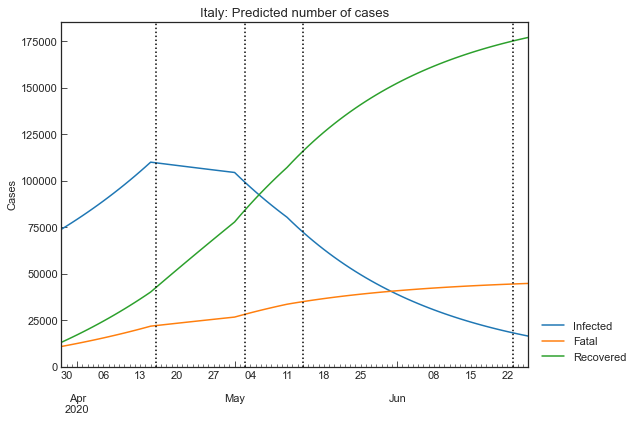

,Date,Susceptible,Infected,Recovered,Fatal
83,20Jun2020,60242836,20126,172989,44047
84,21Jun2020,60242652,19442,173738,44167
85,22Jun2020,60242474,18781,174461,44282
86,23Jun2020,60242303,18142,175160,44394
87,24Jun2020,60242137,17525,175835,44502
88,25Jun2020,60241976,16929,176487,44606
89,26Jun2020,60241821,16353,177117,44707


In [138]:
ita_scenario.clear()
ita_scenario.add_phase(days=7)
ita_scenario.simulate().tail(7).style.background_gradient(axis=0)

In 30 days,

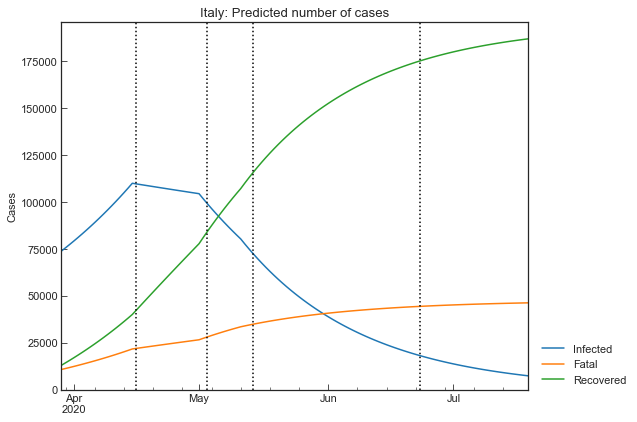

,Date,Susceptible,Infected,Recovered,Fatal
106,13Jul2020,60239866,9083,185071,45979
107,14Jul2020,60239783,8774,185409,46033
108,15Jul2020,60239702,8476,185736,46085
109,16Jul2020,60239625,8188,186051,46136
110,17Jul2020,60239550,7909,186356,46184
111,18Jul2020,60239478,7640,186650,46231
112,19Jul2020,60239408,7380,186934,46277


In [139]:
ita_scenario.clear()
ita_scenario.add_phase(days=30)
ita_scenario.simulate().tail(7).style.background_gradient(axis=0)

In the long-term,

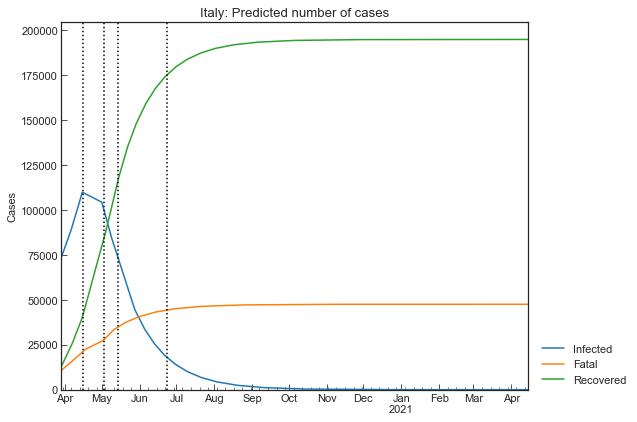

In [140]:
ita_scenario.clear()
ita_scenario.add_phase(days=300)
_ = ita_scenario.simulate()

## Effect of expected new medicines
New medicines are necessary so that patients can recover more quicky from the disease. Drug repositioning strategy (i.e.finding effective candidates from library of existing drugs of different diseases) is used to develop the medicines of COVID-19. For example, Remdesivir (USAN) and Favipiravir (AVIGAN) are candidates. 

* KEGG DRUG DATABASE: [Remdesivir (USAN)](https://www.kegg.jp/dbget-bin/www_bget?dr:D11472), Antiviral.
* KEGG DRUG DATABASE: [Favipiravir (AVIGAN)](https://www.kegg.jp/dbget-bin/www_bget?dr:D09537), efficancy is Antiviral, RNA replicase inhibitor.

Certainly, Favipiravir (AVIGAN) may lead many serious adverse reactions and it cannot be provided to expectant mothers [KEGG database AVIGAN](https://www.kegg.jp/medicus-bin/japic_med?japic_code=00066852) (Sorry, this is written in Japanese). However, it may help to save many thousand lives.  

Un-controlled clinical study of Remdesivir from 25Jan2020 to 07Mar2020:  
According to [Grein, Jonathan, et al., 2020](https://www.nejm.org/doi/full/10.1056/NEJMoa2007016?query=RP), 10-day course of Remdesivir administration (200 mg at day 1 followed by 100 mg daily) with median foloow-up of 18 days were performed.  

53 patients in the full analysis set were those with confirmed infection and had oxygen satulation of 94% or less while they were breathing ambient air or receiving oxygen support. They are from USA (22 patients), Europe/Canada (22 patients) and Japan (9 patients). 36 patients (68%) showed clinical improvement. 25 patients (47%) was discharged, 7 patients (13%) deceased.

clinical trial with placebo is necessary for evaluation, but we can assume $\gamma$ and $\alpha$ as follows. (This estimation is not refered in this paper. This just a rough evaluation.)
<!--
\begin{align*}
& \kappa \tau^{-1} = \alpha_2 = \cfrac{\bar{h}\ \bar{s}}{N} \sum_{n=0}^{\infty}\cfrac{P_{i}}{L_i} \\
& \sigma \tau^{-1} = \gamma = \cfrac{1 - \bar{h}\ \bar{s}}{N} \sum_{n=0}^{\infty}\cfrac{P_{i}}{l_i} \\
\end{align*}
$\bar{h}$: Rate of I whose immune systems does NOT overcame virus multiplication [-]  
$\bar{s}$: Rate of I$^\star$ who have severe events, including respiratory failure  [-]  
$L_i$: Inverse of F$^\star$'s mortality rate for people $i$ years old [min]  
$l_i$: Inverse of R$^\star$'s mortality rate for people $i$ years old [min]  
$P_i$: The number of people $i$ years old [-]  
$N$: Total population  
-->

$$
\gamma_{med} = \cfrac{\tau \times(\mathrm{Percentage\ of\ discharged)}}{\mathrm{Total\ number\ of\ minutes\ with\ obserbvation}}
$$

In [141]:
sigma_before = ita_scenario.get("sigma", name="Main", phase="3rd")
kappa_before = ita_scenario.get("kappa", name="Main", phase="3rd")
(sigma_before, kappa_before)

(0.031973715128783775, 0.00047816850808033253)

In [142]:
# Tentative evaluation with clinical study
sigma_med = ita_scenario.get("tau", name="Main", phase="3rd") * (25 / 53) / ((10 + 18) * 1440)
kappa_med = ita_scenario.get("tau", name="Main", phase="3rd") * (7 / 53) / ((10 + 18) * 1440)
(sigma_med, kappa_med)

(0.016846361185983826, 0.0047169811320754715)

In three 90 days,

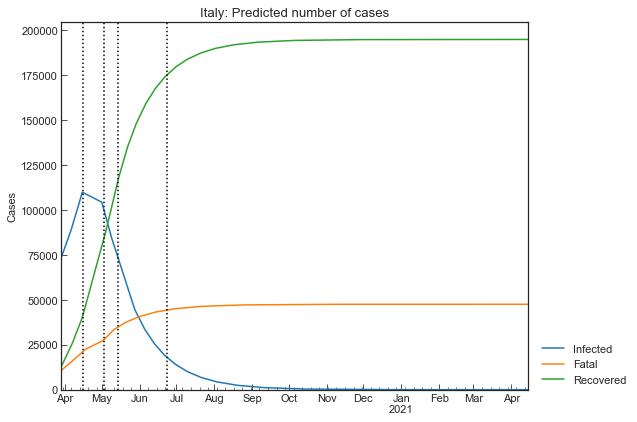

,Date,Susceptible,Infected,Recovered,Fatal
376,09Apr2021,60237423,1,195008,47568
377,10Apr2021,60237423,1,195008,47568
378,11Apr2021,60237423,1,195008,47568
379,12Apr2021,60237423,1,195008,47568
380,13Apr2021,60237423,1,195008,47568
381,14Apr2021,60237423,1,195008,47568
382,15Apr2021,60237423,1,195008,47568


In [143]:
ita_scenario.add_phase(days=90, name="Medicine", kappa=kappa_med, sigma=sigma_med)
ita_scenario.simulate().tail(7).style.background_gradient(axis=0)

In the long-term,

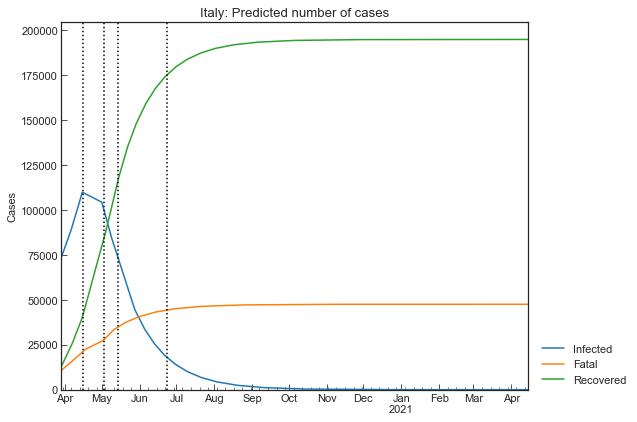

In [144]:
ita_scenario.clear(name="Medicine")
ita_scenario.add_phase(days=300, name="Medicine", kappa=kappa_med, sigma=sigma_med)
_ = ita_scenario.simulate()

# Scenario in Japan<a id="8"></a>
In this section, we will perform scenario analysis using the records of Japan.

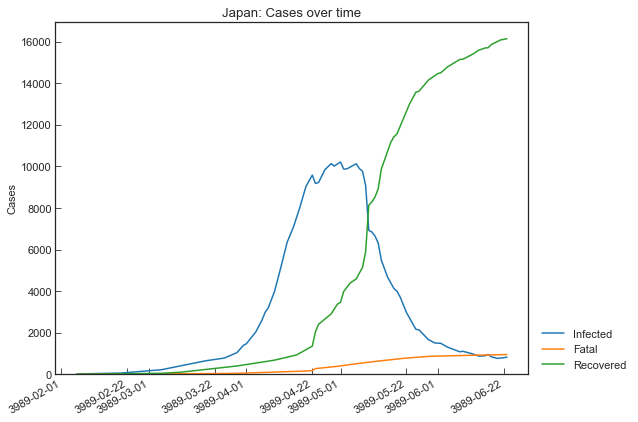

,Date,Confirmed,Infected,Fatal,Recovered
128,2020-06-18,17668,803,935,15930
129,2020-06-19,17710,767,935,16008
130,2020-06-20,17799,770,952,16077
131,2020-06-21,17864,803,953,16108
132,2020-06-22,17916,830,953,16133


In [145]:
jpn_scenario = cs.Scenario(jhu_data, pop_data, "Japan")
jpn_scenario.records().tail()

## S-R Trend analysis

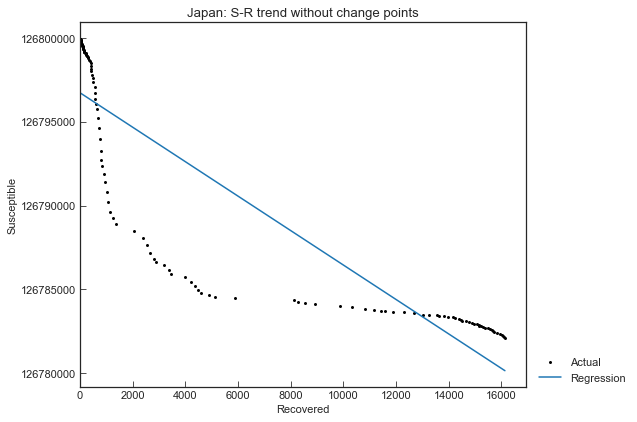

In [146]:
jpn_scenario.trend()

**We will find the time-points, assuming that there are four change points.**

Finding change points of S-R trend...
Finished 170 trials in 0 min 45 sec..


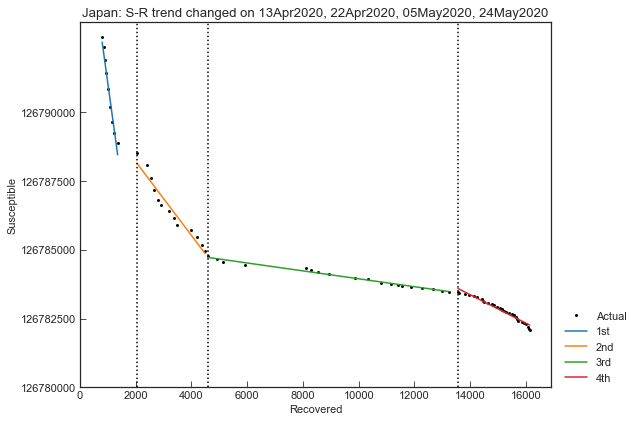

In [147]:
jpn_scenario.trend(n_points=4)

## Phase in Japan
We will use the change points as the start date of phases. For each phase, will apply SIR-F model. $\tau$ values will be the same value.

In [148]:
jpn_scenario.summary()

,Type,Start,End,Population
1st,Past,13Apr2020,21Apr2020,126800000
2nd,Past,22Apr2020,04May2020,126800000
3rd,Past,05May2020,23May2020,126800000
4th,Past,24May2020,22Jun2020,126800000


## Estimate SIR-F parameters

In [149]:
jpn_scenario.estimate(cs.SIRF)

1st phase with SIR-F model:
	Running optimization...
	Finished 425 trials in 1 min 3 sec.c.
2nd phase with SIR-F model:
	Running optimization...
	Finished 341 trials in 0 min 41 sec..
3rd phase with SIR-F model:
	Running optimization...
	Finished 79 trials in 0 min 10 sec..
4th phase with SIR-F model:
	Running optimization...
	Finished 159 trials in 0 min 20 sec..


### 1st phase

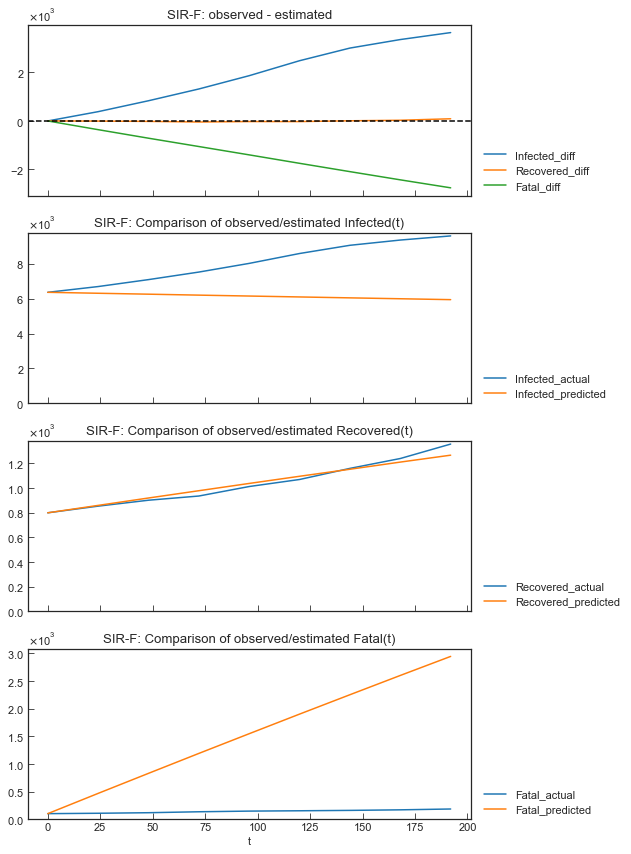

In [150]:
jpn_scenario.estimate_accuracy(phase="1st")

### 2nd phase

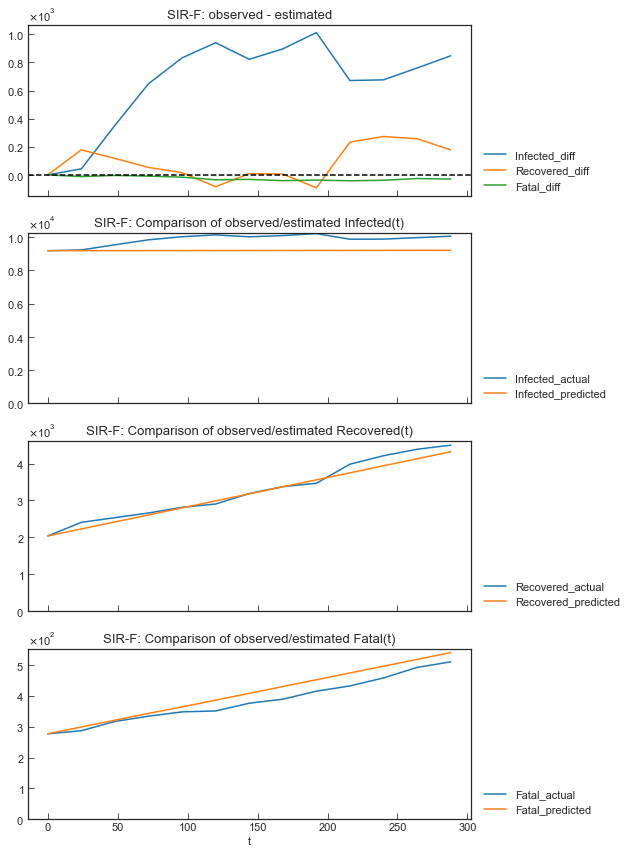

In [151]:
jpn_scenario.estimate_accuracy(phase="2nd")

### 3rd phase

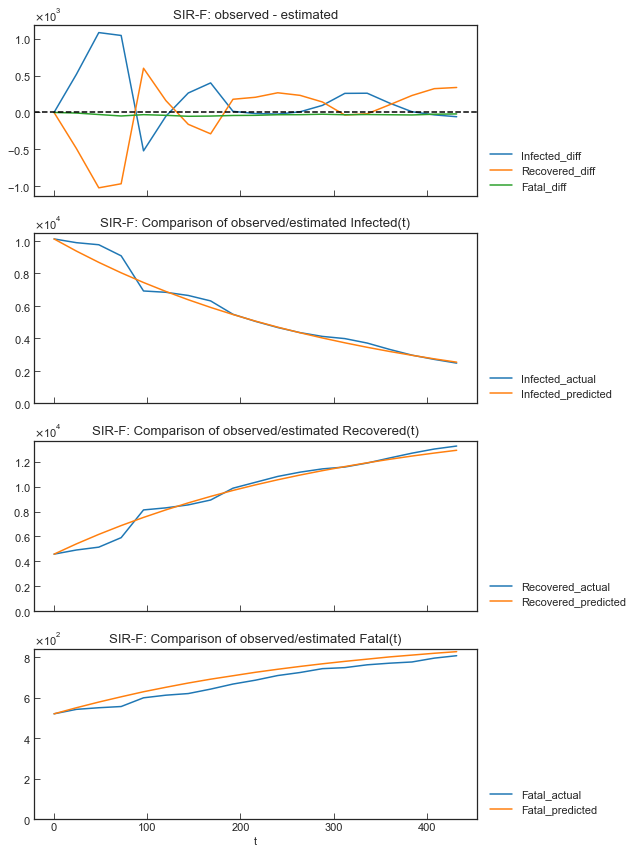

In [152]:
jpn_scenario.estimate_accuracy(phase="3rd")

### 4th phase

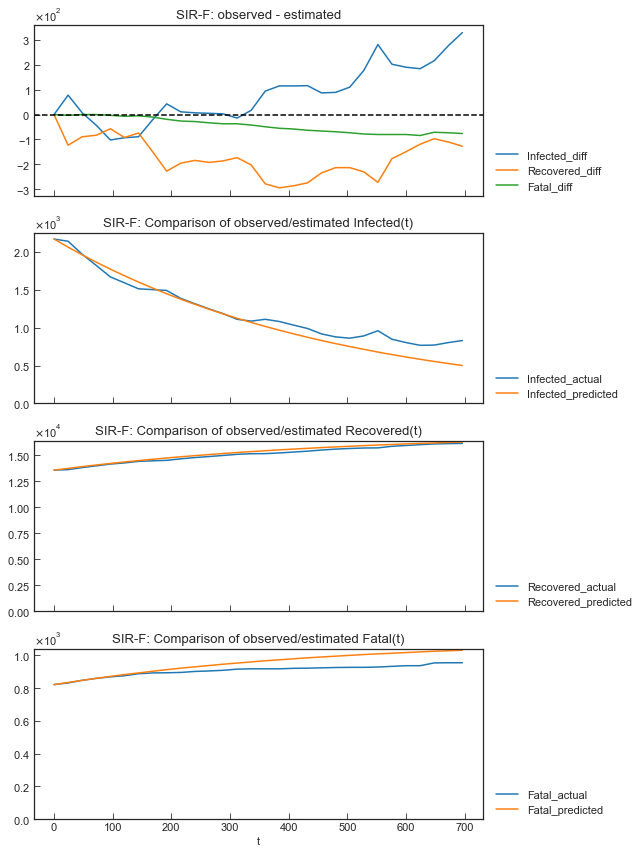

In [153]:
jpn_scenario.estimate_accuracy(phase="4th")

### Compare parameters

In [154]:
jpn_scenario.summary()

,Type,Start,End,Population,ODE,tau,rho,sigma,theta,kappa,Rt,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
1st,Past,13Apr2020,21Apr2020,126800000,SIR-F,60,0.002449,0.000396,0.528992,0.001113,0.76,0.529,37,17,105,1.457006,425,1 min 3 sec
2nd,Past,22Apr2020,04May2020,126800000,SIR-F,60,0.000969,0.000861,0.089428,0.000013,1.01,0.089,3313,42,48,0.085675,341,0 min 41 sec
3rd,Past,05May2020,23May2020,126800000,SIR-F,60,0.000441,0.003511,0.097263,0.000087,0.11,0.097,480,94,11,0.091629,79,0 min 10 sec
4th,Past,24May2020,22Jun2020,126800000,SIR-F,60,0.001567,0.003407,0.165901,0.000004,0.38,0.166,9458,26,12,0.230502,159,0 min 20 sec


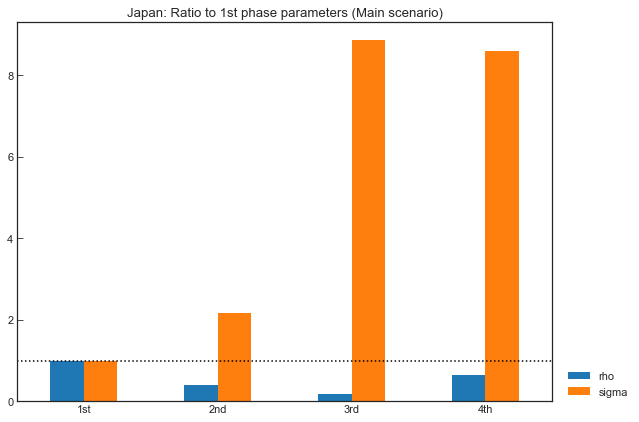

In [155]:
_ = jpn_scenario.param_history(targets=["rho", "sigma"])

Tokyo 2020 Olympics was postponed until 2021, and $\rho$ is decreasing from 2nd phase to 3rd phase.

## Why $\rho$ is decreasing?
Japan declared a state of emergency three times.
* 07Apr2020 - 15APr2020: Only three metropolitan areas (Tokyo/Kanagawa/Saitama/Chiba, Osaka/Hyogo, Fukuoka)
* 16Apr2020 - 06May2020: Nation-wide
* 07May2020 - (31May2020): Nation-wide

However, national/city lock is not be done. Japan is mainly taking the following three actions.

* Physical (social) distancing: to avoid closed spaces, crowd, conversation at close distance
* Trace the link of patients and give tests on the linked persons preferentially
* Maintain medical level to increase recovery rate and decrease mortality rate

### Prefectures where currently infected cases are
Most of the currently infected cases are in Tokyo and Osaka as shown in the next figure.

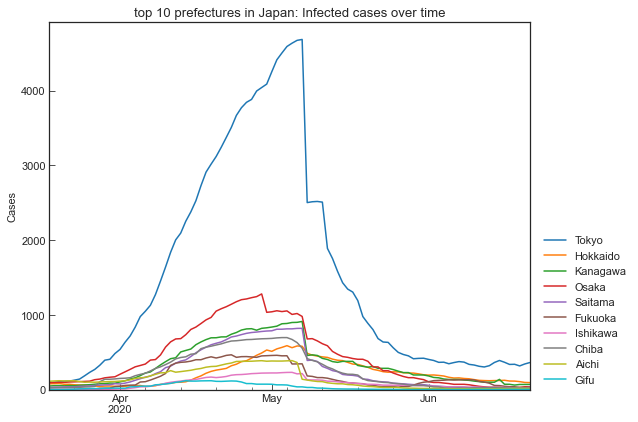

In [156]:
df = jpn_pref_df.copy()
df["Infected"] = df["Positive"] - df["Discharged"] - df["Fatal"]
df = df.pivot_table(
    index="Date", columns="Prefecture", values="Infected", aggfunc="last"
)
jpn_i_df = df.sort_values(by=df.index[-1], axis=1, ascending=False)
cs.line_plot(
    jpn_i_df.iloc[:, :10],
    "top 10 prefectures in Japan: Infected cases over time",
    y_integer=True
)

The prefecture where the highest number of currently infected cases was chronologically changed as follows.

In [157]:
df = jpn_i_df.idxmax(axis=1)
df = df[df != df.shift()].reset_index()
df.columns = ["Start_date", "Where_highest"]
df

,Start_date,Where_highest
0,2020-03-18,Aichi
1,2020-03-23,Tokyo


At the last record, infected cases are mainly in the prefectures with large population.

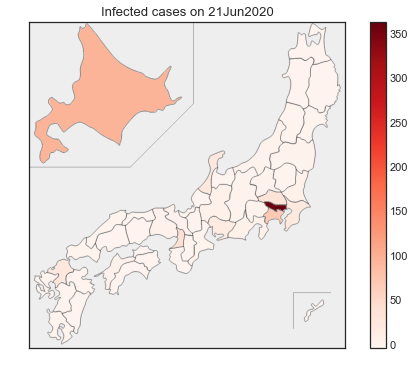

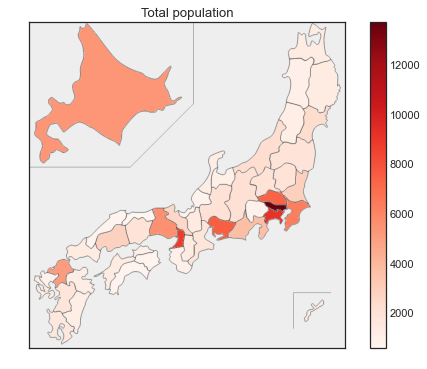

In [158]:
_date = jpn_i_df.index[-1].strftime("%d%b%Y")
df = pd.merge(
    jpn_meta_df[["Population_Total", "Area_Habitable"]],
    jpn_i_df.loc[jpn_i_df.index[-1], :],
    left_index=True, right_index=True
)
df.columns = ["Population", "Area", "Infected"]
df["Density"] = df["Population"] / df["Area"]
df["I_rate"] = df["Infected"] / df["Population"]
cs.jpn_map(df.index, df["Infected"], f"Infected cases on {_date}")
cs.jpn_map(df.index, df["Population"], f"Total population")

## Why $\sigma$ was decreased?

In [159]:
sigma2 = jpn_scenario.get("sigma", name="Main", phase="2nd")
sigma1 = jpn_scenario.get("sigma", name="Main", phase="1st")
sigma2 / sigma1

2.171765917231065

## Predict the future with the last parameters

In a week,

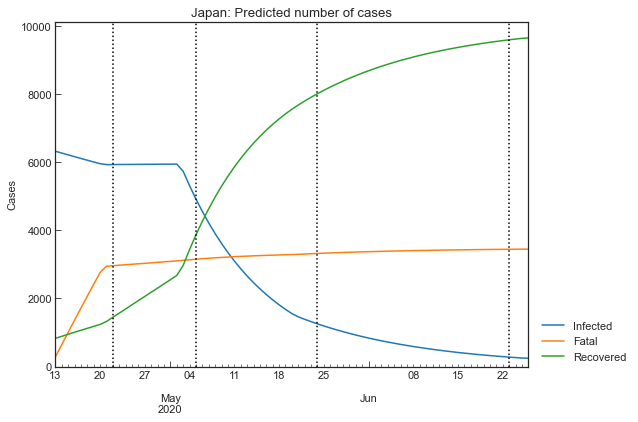

,Date,Susceptible,Infected,Recovered,Fatal
68,20Jun2020,126786710,321,9530,3440
69,21Jun2020,126786698,305,9555,3442
70,22Jun2020,126786687,290,9580,3444
71,23Jun2020,126786676,275,9603,3445
72,24Jun2020,126786666,262,9625,3447
73,25Jun2020,126786657,249,9646,3449
74,26Jun2020,126786652,243,9657,3450


In [160]:
jpn_scenario.clear()
jpn_scenario.add_phase(days=7)
jpn_scenario.simulate().tail(7).style.background_gradient(axis=0)

In 30 days,

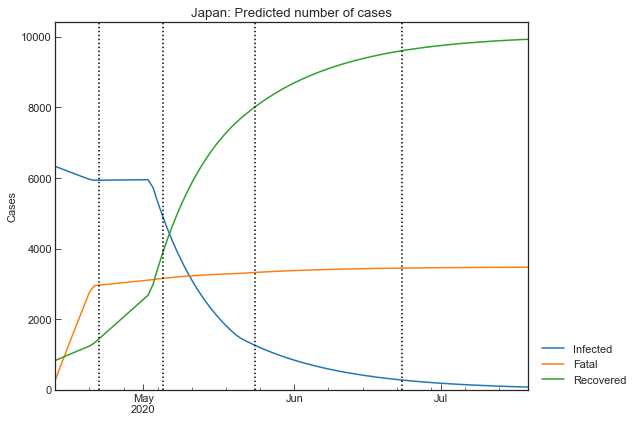

,Date,Susceptible,Infected,Recovered,Fatal
91,13Jul2020,126786546,100,9887,3468
92,14Jul2020,126786542,95,9895,3468
93,15Jul2020,126786539,90,9903,3469
94,16Jul2020,126786535,86,9910,3469
95,17Jul2020,126786532,82,9917,3470
96,18Jul2020,126786529,78,9923,3470
97,19Jul2020,126786528,76,9927,3471


In [161]:
jpn_scenario.clear()
jpn_scenario.add_phase(days=30)
jpn_scenario.simulate().tail(7).style.background_gradient(axis=0)

In the logn-term,

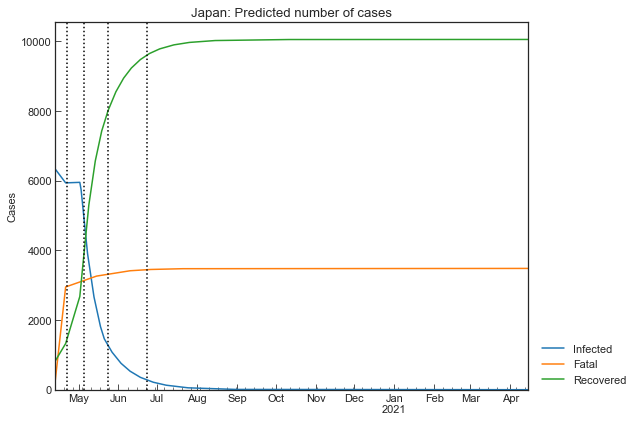

In [162]:
jpn_scenario.clear()
jpn_scenario.add_phase(days=300)
_ = jpn_scenario.simulate()

## How to make way by 31May2020 for the number of cases peaking out

### The current situation
Under the assumtion that the current trend continues, when will the number of currently infected cases peak out?  
We can use $R_t$ as the index. When $R_t < 1$, $\frac{\mathrm{d}y}{\mathrm{d}t} < 0$.

This is because  
\begin{align*}
& \frac{\mathrm{d}y}{\mathrm{d}t}= \rho (1-\theta) x y - (\sigma + \kappa) y\\
& R_t = \rho (1 - \theta) (\sigma + \kappa)^{-1}\\
& x \simeq 1 \\
\end{align*}

where $R_t$ is reproduction number (phase/time-dependent version of $R_0$).

$x$ is

In [163]:
df = jpn_scenario.records(show_figure=False)
1 - df.iloc[-1, :]["Confirmed"] / pop_data.value("Japan")

0.9998587066246056

The current value of $R_t$ is

In [164]:
jpn_scenario.get("Rt", name="Main", phase="2nd")

1.01

The number of currently infected cases will peak on

In [165]:
jpn_scenario.clear()
jpn_scenario.add_phase(days=1000)
df = jpn_scenario.simulate(show_figure=False)
df.loc[df["Infected"].idxmax(), "Date"]

'13Apr2020'

### How to set $R_t < 1$ by 31May2020
$R_t < 1$ when $\rho$ is under

In [166]:
current_rho = jpn_scenario.get("rho", name="Main", phase="last")
limit_rho = current_rho / jpn_scenario.get("Rt", name="Main", phase="last") * 1.0
limit_rho

0.004123081703943458

Here, we assume $\rho$ is

In [167]:
jpn_tau = jpn_scenario.get("tau", name="Main", phase="last")
beta_inv = math.ceil(jpn_tau / 24 / 60 / limit_rho) + 1
target_rho = jpn_tau / 24 / 60 / beta_inv
target_rho

0.003472222222222222

In [168]:
target_rho < limit_rho

True

Set $\rho$ with the assumtion that $\rho$ will decrease,

In [169]:
jpn_scenario.clear()
jpn_scenario.add_phase(end_date="30Jun2020", rho=target_rho)
jpn_scenario.summary()

,Type,Start,End,Population,ODE,tau,rho,sigma,theta,kappa,Rt,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
1st,Past,13Apr2020,21Apr2020,126800000,SIR-F,60,0.002449,0.000396,0.528992,0.001113,0.76,0.529,37,17,105,1.45701,425,1 min 3 sec
2nd,Past,22Apr2020,04May2020,126800000,SIR-F,60,0.000969,0.000861,0.089428,0.000013,1.01,0.089,3313,42,48,0.0856752,341,0 min 41 sec
3rd,Past,05May2020,23May2020,126800000,SIR-F,60,0.000441,0.003511,0.097263,0.000087,0.11,0.097,480,94,11,0.0916295,79,0 min 10 sec
4th,Past,24May2020,22Jun2020,126800000,SIR-F,60,0.001567,0.003407,0.165901,0.000004,0.38,0.166,9458,26,12,0.230502,159,0 min 20 sec
5th,Future,23Jun2020,30Jun2020,126800000,SIR-F,60,0.003472,0.003407,0.165901,0.000004,0.85,0.166,9458,12,12,-,-,-


$R_t$ will be

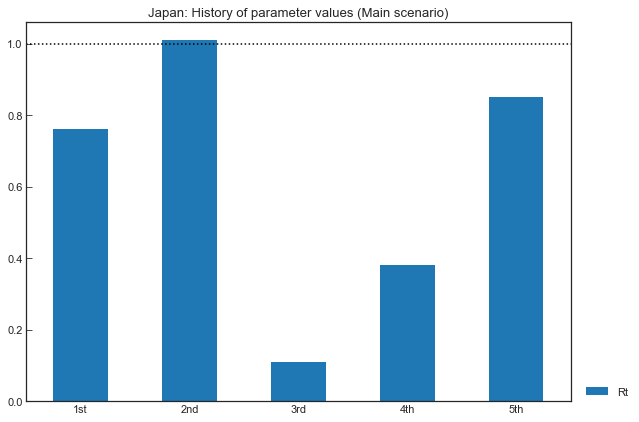

In [170]:
_ = jpn_scenario.param_history(targets=["Rt"], divide_by_first=False)

Trajectory of the number of cases and peak date will be

In [171]:
jpn_scenario.clear()
jpn_scenario.add_phase(days=100, rho=target_rho)
df = jpn_scenario.simulate(show_figure=False)
df.loc[df["Infected"].idxmax(), "Date"]

'13Apr2020'

### Change factor of $\beta$
Japan focuses on the rate of people in closed spaces/crowd. We need to avoid business offices, meeting spaces, entertainment distincts, shopping malls etc.

Here, we assume that $\beta=\tau^{-1}\rho$ is
\begin{align*}
& \beta_{(p)} = \overline{\beta}(1-p) + \beta^{\ast}p
\end{align*}
where  
$\overline{\beta}$: effective contact rate in average [1/min]  
$\beta^{\ast}$: effective contact rate in closed spaces/crowd [1/min]  
$p$: rate of people in closed spaces/crowd [-]

### Max value of $p$ to meet the goal

@ClusterJapan (expert team to prevent COVID-19 outbreak in Japan) analysed link of patients and summarized as follows. This is from [Twitter @ClusterJapan on 11Apr2020](https://twitter.com/ClusterJapan/status/1248884086581514242?s=20) (in Japanese).
* 80% of patients have less than 1 secondary infected patient
* 10% of patients have 8-12 secondary patients and they are in closed space/crowd

As my personal point of view, $\beta^{\ast}$ can be estimated as $\beta^{\ast} = 10 \times \overline{\beta}$.  
This means
\begin{align*}
& \beta_{(p)} = \overline{\beta}(1+9P)
\end{align*}

$P$ is the rate of people in the spaces where effcetive contact rate is 10 times as the average value.

With the assumption that $\overline{\beta}$ is constant,  
\begin{align*}
& \cfrac{\beta_{before}}{1+9P_{before}} = \cfrac{\beta_{after}}{1+9P_{after}}
\end{align*}
("Before" means "before the national emergency declaration on 06Apr2020.)

Then,
\begin{align*}
& \cfrac{1+9P_{after}}{1+9P_{before}} = \cfrac{\rho_{after}}{\rho_{before}}
\end{align*}

So,
\begin{align*}
& P_{after} = \frac{1}{9}\left[ \cfrac{\rho_{after}}{\rho_{before}}(1+9P_{before}) - 1 \right]
\end{align*}

$\cfrac{\rho_{after}}{\rho_{before}}$ is

In [172]:
target_rho / jpn_scenario.get("rho", name="Main", phase="last")

1.0

We can estimate $P_{before}$ with go-out table.
* Schools were closed
* 10.6% of people work remotely because
  - 5.6% of respondents work remotely (cf.1),
  - total number of respondents is 23,992,701 (cf.2),
  - 2,651,272 respondents are working in service industry (cf.2),
  - 2,128,322 respondents are medical personnel or care worker (cf.2),
  - 7,928,268 respondents are office workers or workers of logistics companies (cf.2).
  - The number of days the respondent work remotely is not known.
* As usual, 75% of people are in closed space/crowded (CC) area: this is just my point of view, I'm gathering information.
* Compared to baseline, 25% reduction was shown in Retail & recreation area: cf.3

cf.1: (In Japanese) [Report of 1st survey by Ministry of Health, Labor and Welfare & LINE Corporation](https://www.mhlw.go.jp/stf/newpage_10695.html)  
cf.2: (In Japanese) [Detailed report of 1st survey by Ministry of Health, Labor and Welfare & LINE Corporation](https://www.mhlw.go.jp/stf/newpage_10798.html)
Movility reports: [COVID-19 Community Mobility Reports in Japan on 05Apr2020](https://www.gstatic.com/covid19/mobility/2020-04-05_JP_Mobility_Report_en.pdf)

In [173]:
remote_rate = round(0.056 * 23992701 / (2651272 + 2128322 + 7928268), 3)
remote_rate

0.106

In [174]:
df = go_out("Japan")
df["School"] = 0
df["Remote"] = df["Office"] * remote_rate
df["Workplace"] = df["Office"] - df["Remote"]
df["Others_CC"] = df["Others"] * 0.75 * (1 - 0.25)
df["Others"] = df["Others"] - df["Others_CC"]
df = pd.concat([df["Portion"], df.loc[:, ~df.columns.isin(["Portion"])]], axis=1)
df = df.drop("Office", axis=1)
jpn_go_df = df.copy()
jpn_go_df

,Portion,Age_first,Age_last,Period_of_life,School,Others,Remote,Workplace,Others_CC
0,0.023292,0,2,nursery,0,0.0000,0.000,0.000,0.0000
1,0.024166,3,5,nursery school,0,0.4375,0.000,0.000,0.5625
2,0.043395,6,10,elementary school,0,0.4375,0.000,0.000,0.5625
3,0.026526,11,13,middle school,0,0.4375,0.000,0.000,0.5625
4,0.045251,14,18,high school,0,0.4375,0.000,0.000,0.5625
5,0.066696,19,25,university/work,0,0.4375,0.318,2.682,0.5625
6,0.106875,26,35,work,0,0.4375,0.636,5.364,0.5625
7,0.134815,36,45,work,0,0.4375,0.530,4.470,0.5625
8,0.142129,46,55,work,0,0.4375,0.530,4.470,0.5625
9,0.123395,56,65,work,0,0.4375,0.530,4.470,0.5625


$P_{before}$ can be estimated as

In [175]:
df = jpn_go_df.copy()
p_before = (df[["School", "Workplace", "Others_CC"]].sum(axis=1) * df["Portion"]).sum() / 7
p_before

0.4920099997132164

\begin{align*}
& P_{after} = \frac{1}{9}\left[ \cfrac{\rho_{after}}{\rho_{before}}(1+9P_{before}) - 1 \right]
\end{align*}

To meet the goal, $P_{after}$ should be under

In [176]:
def calc_target_p(rho_before, rho_after, p_before):
    return (rho_before / rho_after * (1 + 9 * p_before) - 1) / 9

In [177]:
rho_last = jpn_scenario.get("rho", name="Main", phase="last")
target_p = calc_target_p(target_rho, rho_last, p_before)
target_p

0.49200999971321635

### Max value of go-out index to meet the goal

## How to prevent overwhelming medical system
We need to flatten the curve of currently infected cases so that prevent overwhelming medical system. The peak value of currently infected cases must not exceed the number of hospital capacity.

### How many medical staffs, ICU beds, hospitals and other sites we have

### Severity of the currently infected patients
We categoize the patient with severity as the following.
* Grade1: Asymptomtic or mild symptoms, need self-quarantine at home or hotel
* Grade2: Severity is unknown and need hospitalization for diagnosis
* Grade3: Severe and need ICU

### Max value of $\gamma$ to meet the goal

### Are new medicines are effective?

# Scenario in India<a id="12"></a>
In this section, we will perform scenario analysis using the records of India.

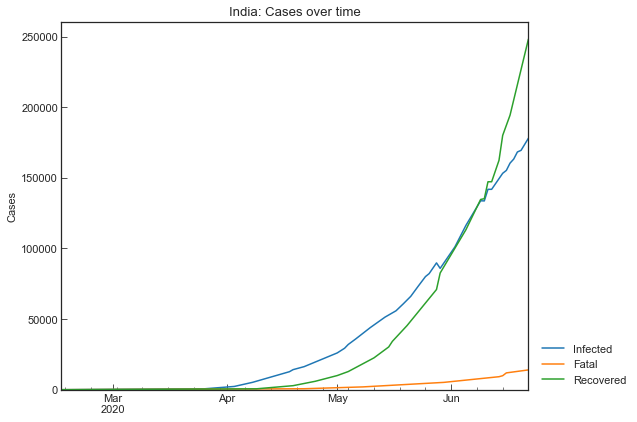

,Date,Confirmed,Infected,Fatal,Recovered
140,2020-06-18,380532,163248,12573,204711
141,2020-06-19,395048,168269,12948,213831
142,2020-06-20,410461,169451,13254,227756
143,2020-06-21,425282,174387,13699,237196
144,2020-06-22,440215,178014,14011,248190


In [178]:
ind_scenario = cs.Scenario(jhu_data, pop_data, "India")
ind_scenario.records().tail()

## S-R Trend analysis

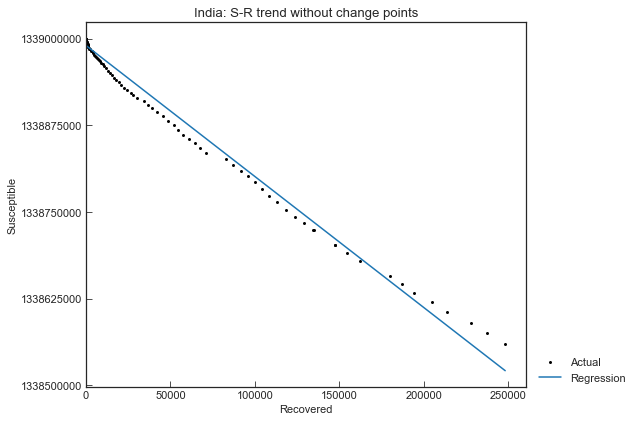

In [179]:
ind_scenario.trend()

**We will find the time-points, assuming that there are two change points.**

Finding change points of S-R trend...
Finished 170 trials in 0 min 28 sec..


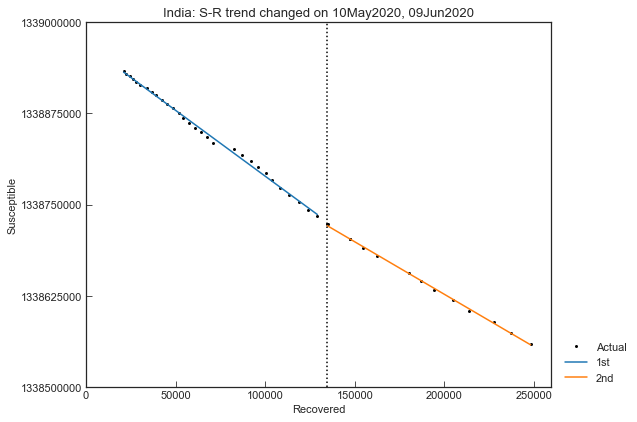

In [180]:
ind_scenario.trend(n_points=2)

## Phases in India
We will use the change points as the start date of phases. For each phase, will apply SIR-F model. $\tau$ values will be the same value.

In [181]:
ind_scenario.summary()

,Type,Start,End,Population
1st,Past,10May2020,08Jun2020,1339000000
2nd,Past,09Jun2020,22Jun2020,1339000000


In [182]:
ind_scenario.estimate(cs.SIRF)

1st phase with SIR-F model:
	Running optimization...
	Finished 46 trials in 1 min 12 sec..
2nd phase with SIR-F model:
	Running optimization...
	Finished 28 trials in 1 min 9 sec.c.


### 1st phase

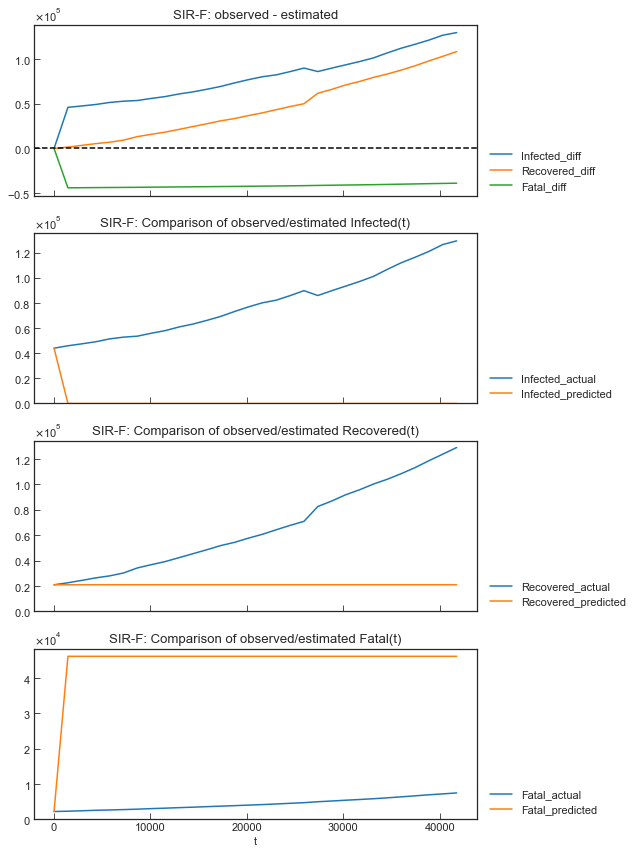

In [183]:
ind_scenario.estimate_accuracy(phase="1st")

### 2nd phase

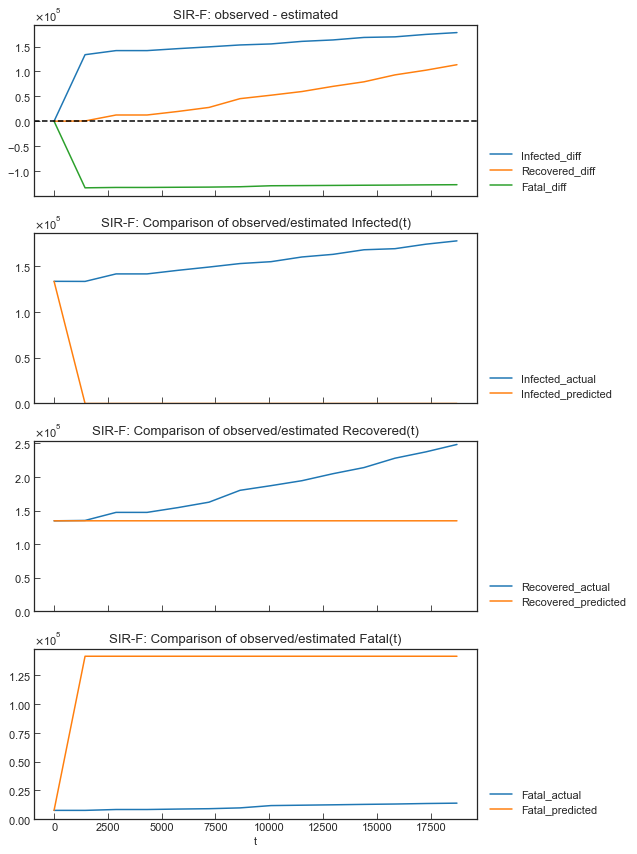

In [184]:
ind_scenario.estimate_accuracy(phase="2nd")

### Compare parameters

In [185]:
ind_scenario.summary()

,Type,Start,End,Population,ODE,tau,rho,sigma,theta,kappa,Rt,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
1st,Past,10May2020,08Jun2020,1339000000,SIR-F,1,0.000060,0.000030,0.481203,0.990091,0.0,0.481,0,11,22,13.531358,46,1 min 12 sec
2nd,Past,09Jun2020,22Jun2020,1339000000,SIR-F,1,0.000056,0.000043,0.659869,0.783091,0.0,0.660,0,12,16,9.581822,28,1 min 9 sec


## Predict the future with the last parameters

In a week,

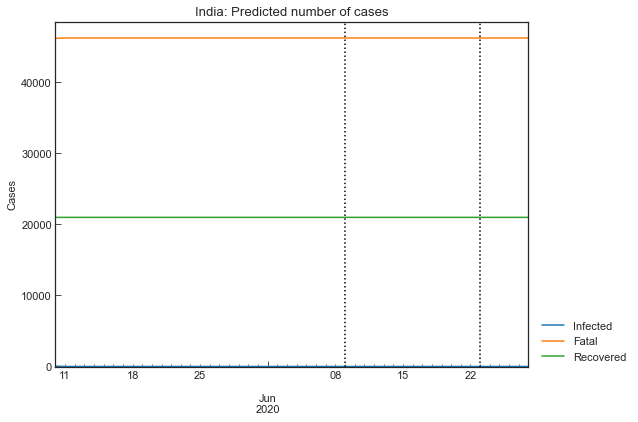

,Date,Susceptible,Infected,Recovered,Fatal
43,22Jun2020,1338932836,0,20970,46193
44,23Jun2020,1338932836,0,20970,46193
45,24Jun2020,1338932836,0,20970,46193
46,25Jun2020,1338932836,0,20970,46193
47,26Jun2020,1338932836,0,20970,46193
48,27Jun2020,1338932836,0,20970,46193
49,28Jun2020,1338932836,0,20970,46193


In [186]:
ind_scenario.clear()
ind_scenario.add_phase(days=7)
ind_scenario.simulate().tail(7).style.background_gradient(axis=0)

In 30 days,

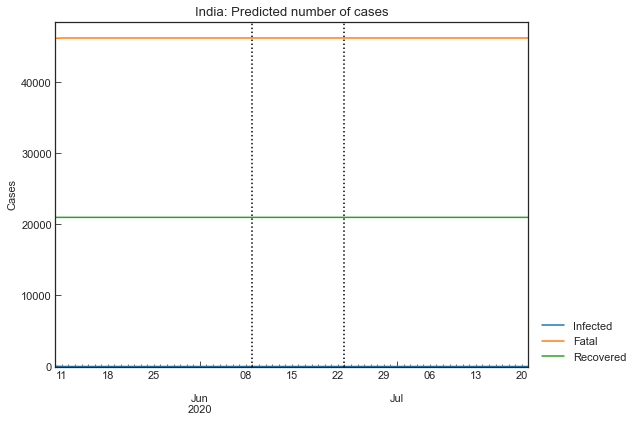

,Date,Susceptible,Infected,Recovered,Fatal
66,15Jul2020,1338932836,0,20970,46193
67,16Jul2020,1338932836,0,20970,46193
68,17Jul2020,1338932836,0,20970,46193
69,18Jul2020,1338932836,0,20970,46193
70,19Jul2020,1338932836,0,20970,46193
71,20Jul2020,1338932836,0,20970,46193
72,21Jul2020,1338932836,0,20970,46193


In [187]:
ind_scenario.clear()
ind_scenario.add_phase(days=30)
ind_scenario.simulate().tail(7).style.background_gradient(axis=0)

In the long-term,

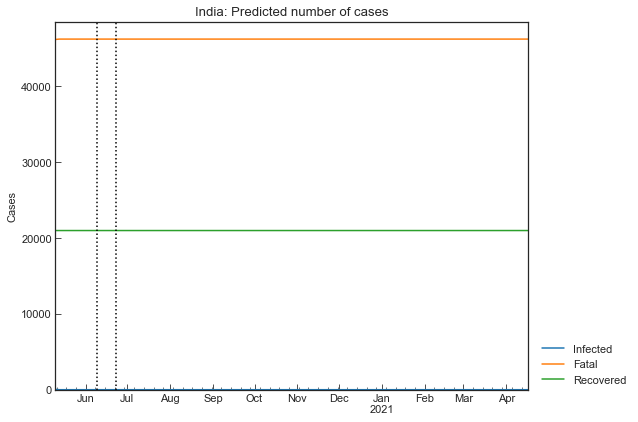

In [188]:
ind_scenario.clear()
ind_scenario.add_phase(days=300)
_ = ind_scenario.simulate()

# Scenario in USA<a id="14"></a>
In this section, we will perform scenario analysis using the records of USA (United States of America, US).

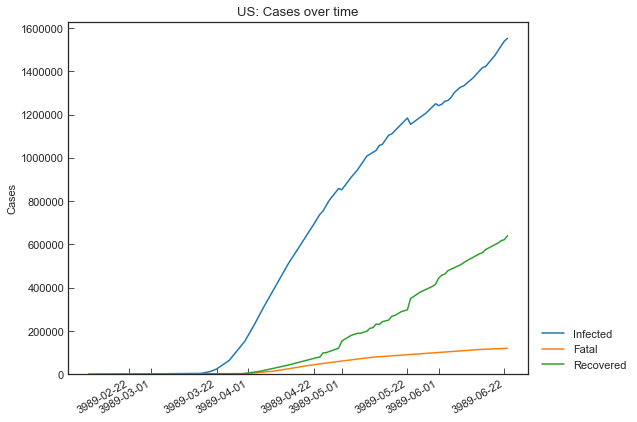

,Date,Confirmed,Infected,Fatal,Recovered
148,2020-06-18,2191053,1473500,118438,599115
149,2020-06-19,2222812,1496972,119125,606715
150,2020-06-20,2255119,1517940,119719,617460
151,2020-06-21,2281290,1539180,119977,622133
152,2020-06-22,2312300,1551700,120402,640198


In [189]:
usa_scenario = cs.Scenario(jhu_data, pop_data, "US")
usa_scenario.records().tail()

## S-R Trend analysis

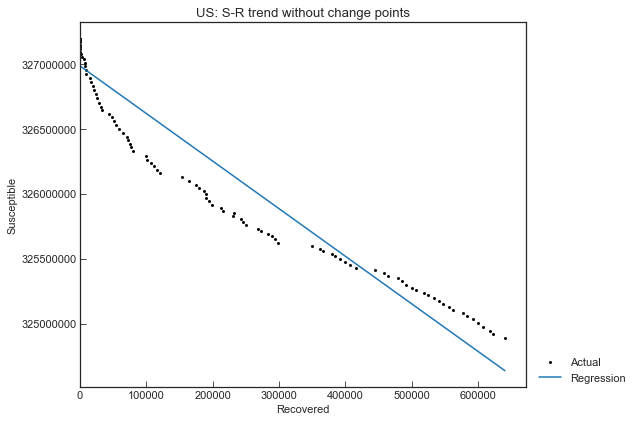

In [190]:
_ = usa_scenario.trend()

**We will find the time-points, assuming that there are three change points.**

Finding change points of S-R trend...


C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10



Performed 10 trials in 0 min 2 sec.

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10



Performed 20 trials in 0 min 4 sec.

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10



Performed 30 trials in 0 min 6 sec.

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10



Performed 40 trials in 0 min 9 sec.

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10



Performed 50 trials in 0 min 11 sec.

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10



Performed 60 trials in 0 min 13 sec.

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

divide by zero encountered in log10

C:\Users\sonal\Anaconda3\lib\site-packages\pandas\core\series.py:679: RuntimeWarning:

invalid value encountered in log10



Finished 70 trials in 0 min 15 sec.


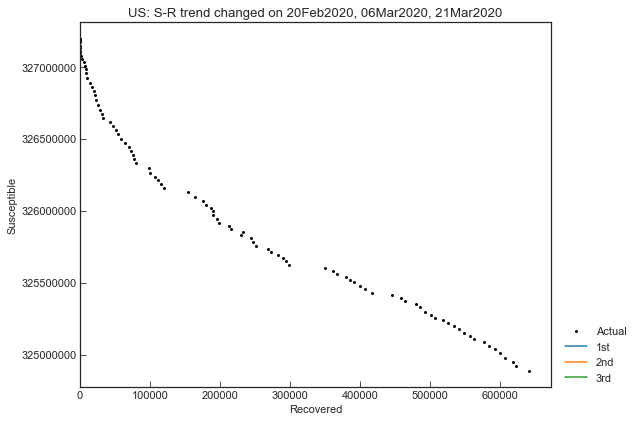

In [191]:
usa_scenario.trend(n_points=3)

## Phases in USA
We will use the change points as the start date of phases. For each phase, will apply SIR-F model. $\tau$ values will be the same value.

In [192]:
usa_scenario.summary()

,Type,Start,End,Population
1st,Past,20Feb2020,05Mar2020,327200000
2nd,Past,06Mar2020,20Mar2020,327200000
3rd,Past,21Mar2020,22Jun2020,327200000


In [193]:
usa_scenario.estimate(cs.SIRF)

1st phase with SIR-F model:
	Running optimization...
	Finished 329 trials in 1 min 8 sec.c.
2nd phase with SIR-F model:
	Running optimization...
	Finished 467 trials in 1 min 3 sec.c.
3rd phase with SIR-F model:
	Running optimization...
	Finished 488 trials in 1 min 2 sec.c.


### 1st phase

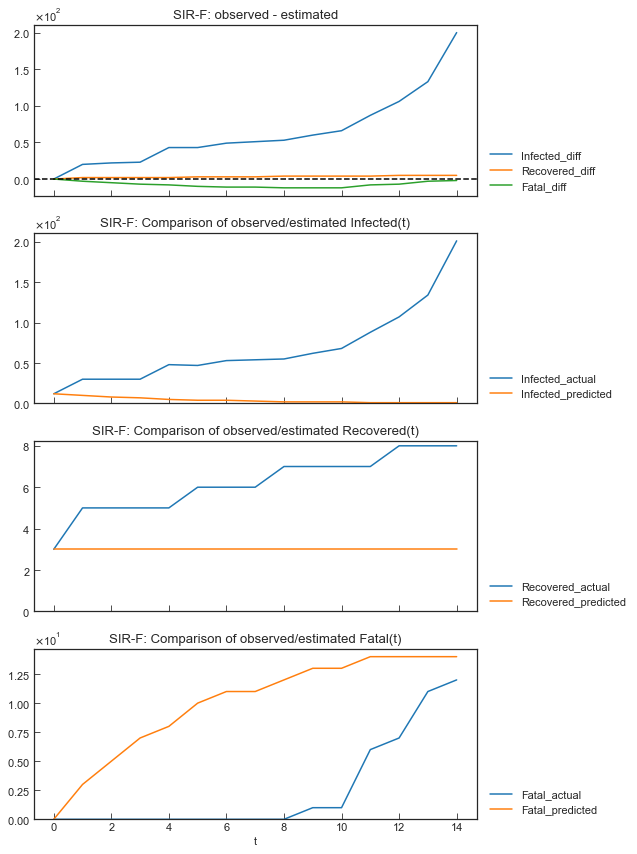

In [194]:
usa_scenario.estimate_accuracy(phase="1st")

### 2nd phase

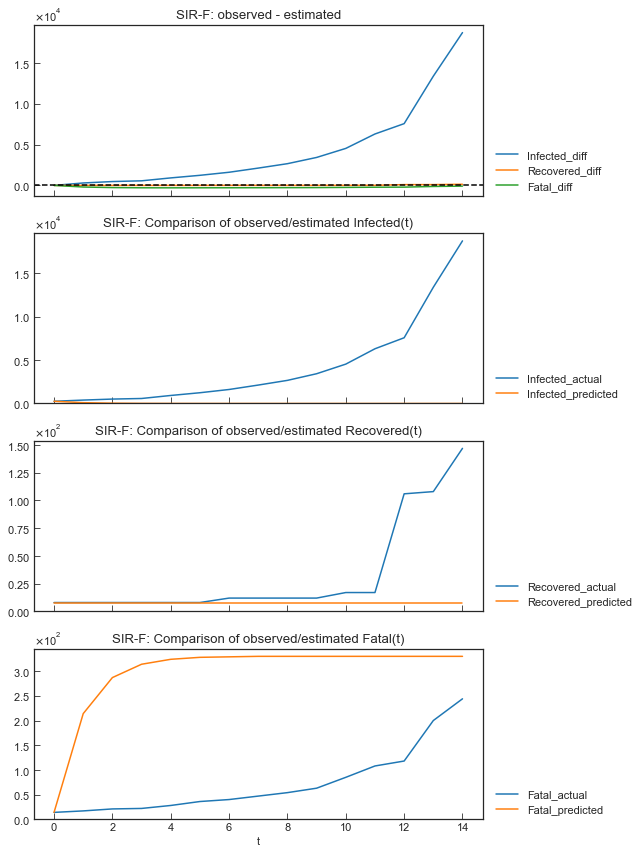

In [195]:
usa_scenario.estimate_accuracy(phase="2nd")

### 3rd phase

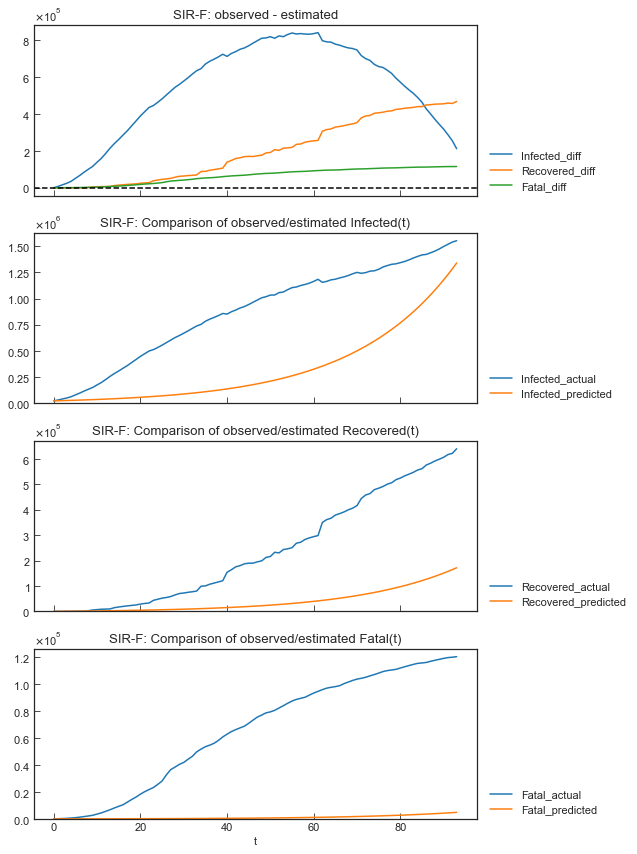

In [196]:
usa_scenario.estimate_accuracy(phase="3rd")

### Compare parameters

In [197]:
usa_scenario.summary()

,Type,Start,End,Population,ODE,tau,rho,sigma,theta,kappa,Rt,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
1st,Past,20Feb2020,05Mar2020,327200000,SIR-F,1440,0.053719,0.000293,0.888171,0.203568,0.03,0.888,4,18,3416,2.885647,329,1 min 7 sec
2nd,Past,06Mar2020,20Mar2020,327200000,SIR-F,1440,0.235181,0.000094,0.996431,0.999490,0.00,0.996,1,4,10656,6.145441,467,1 min 3 sec
3rd,Past,21Mar2020,22Jun2020,327200000,SIR-F,1440,0.048585,0.005579,0.002093,0.000056,8.60,0.002,17946,20,179,9.478534,488,1 min 2 sec


## Predict the future with the last parameters

In a week,

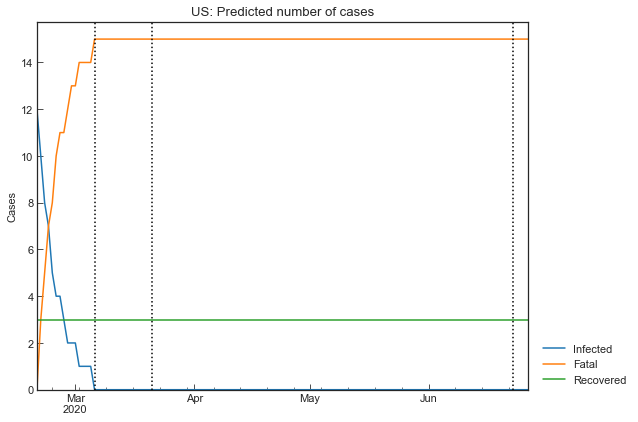

,Date,Susceptible,Infected,Recovered,Fatal
122,21Jun2020,327199982,0,3,15
123,22Jun2020,327199982,0,3,15
124,23Jun2020,327199982,0,3,15
125,24Jun2020,327199982,0,3,15
126,25Jun2020,327199982,0,3,15
127,26Jun2020,327199982,0,3,15
128,27Jun2020,327199982,0,3,15


In [198]:
usa_scenario.clear()
usa_scenario.add_phase(days=7)
usa_scenario.simulate().tail(7).style.background_gradient(axis=0)

In 30 days,

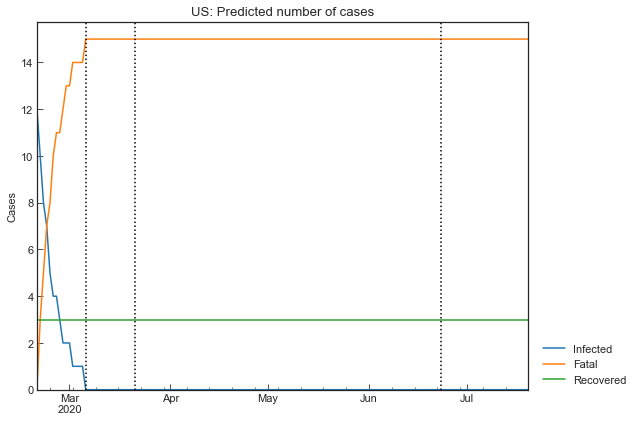

,Date,Susceptible,Infected,Recovered,Fatal
145,14Jul2020,327199982,0,3,15
146,15Jul2020,327199982,0,3,15
147,16Jul2020,327199982,0,3,15
148,17Jul2020,327199982,0,3,15
149,18Jul2020,327199982,0,3,15
150,19Jul2020,327199982,0,3,15
151,20Jul2020,327199982,0,3,15


In [199]:
usa_scenario.clear()
usa_scenario.add_phase(days=30)
usa_scenario.simulate().tail(7).style.background_gradient(axis=0)

In the long-term,

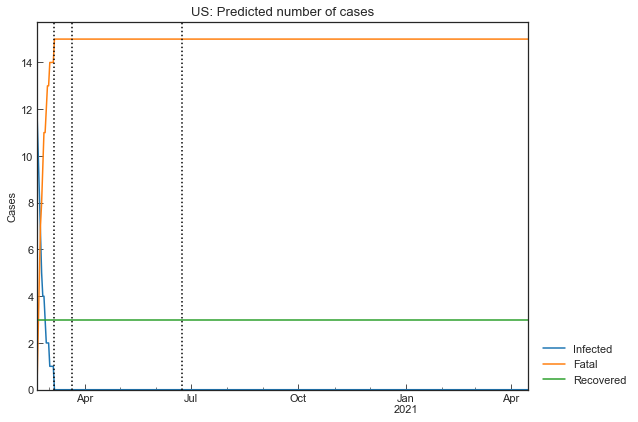

In [200]:
usa_scenario.clear()
usa_scenario.add_phase(days=300)
_ = usa_scenario.simulate()

# Scenario in New Zealand<a id="15"></a>
In this section, we will perform scenario analysis using the records of New Zealand.

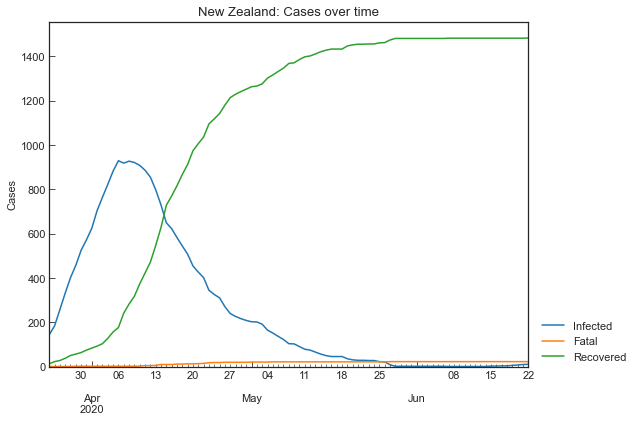

,Date,Confirmed,Infected,Fatal,Recovered
111,2020-06-18,1507,3,22,1482
112,2020-06-19,1509,5,22,1482
113,2020-06-20,1511,7,22,1482
114,2020-06-21,1513,9,22,1482
115,2020-06-22,1515,10,22,1483


In [201]:
nzl_scenario = cs.Scenario(jhu_data, pop_data, "New Zealand")
nzl_scenario.records().tail()

## S-R Trend analysis

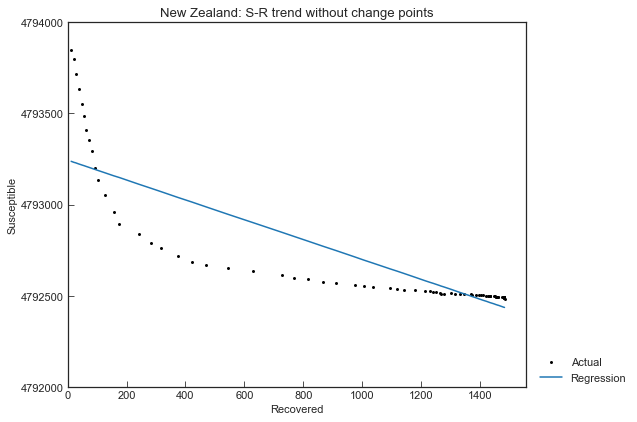

In [202]:
nzl_scenario.trend()

**We will find the time-points, assuming that there are three change points.**

Finding change points of S-R trend...
Finished 70 trials in 0 min 10 sec.


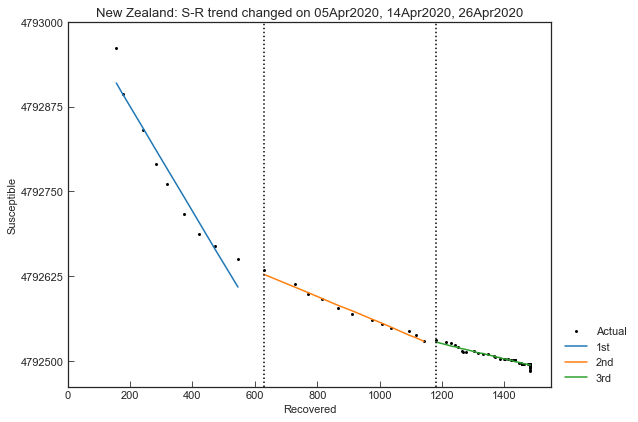

In [203]:
nzl_scenario.trend(n_points=3)

## Phases in New Zealand
We will use the change points as the start date of phases. For each phase, will apply SIR-F model. $\tau$ values will be the same value.

In [204]:
nzl_scenario.summary()

,Type,Start,End,Population
1st,Past,05Apr2020,13Apr2020,4794000
2nd,Past,14Apr2020,25Apr2020,4794000
3rd,Past,26Apr2020,22Jun2020,4794000


In [205]:
nzl_scenario.estimate(cs.SIRF)

1st phase with SIR-F model:
	Running optimization...
	Finished 504 trials in 1 min 3 sec.c.
2nd phase with SIR-F model:
	Running optimization...
	Finished 475 trials in 1 min 2 sec.c.
3rd phase with SIR-F model:
	Running optimization...
	Finished 411 trials in 0 min 52 sec..


### 1st phase

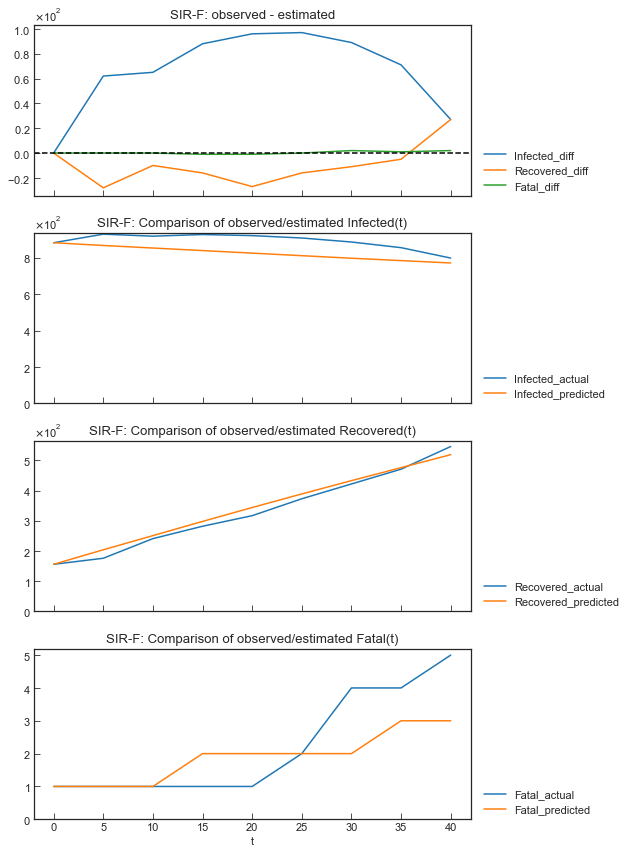

In [206]:
nzl_scenario.estimate_accuracy(phase="1st")

### 2nd phase

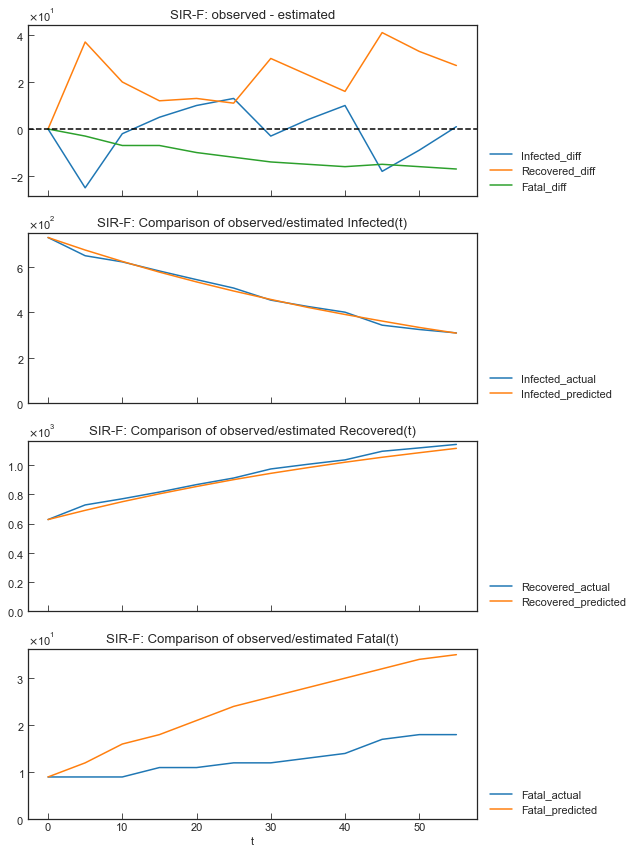

In [207]:
nzl_scenario.estimate_accuracy(phase="2nd")

### 3rd phase

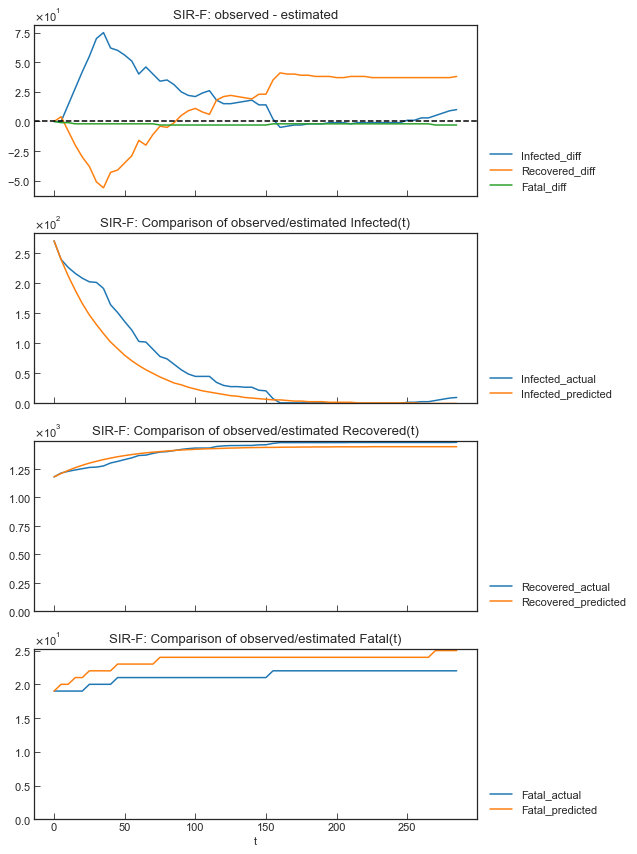

In [208]:
nzl_scenario.estimate_accuracy(phase="3rd")

### Compare parameters

In [209]:
nzl_scenario.summary()

,Type,Start,End,Population,ODE,tau,rho,sigma,theta,kappa,Rt,alpha1 [-],1/alpha2 [day],1/beta [day],1/gamma [day],RMSLE,Trials,Runtime
1st,Past,05Apr2020,13Apr2020,4794000,SIR-F,288,0.007693,0.011000,0.000492,0.000051,0.70,0.000,3923,25,18,0.206764,504,1 min 3 sec
2nd,Past,14Apr2020,25Apr2020,4794000,SIR-F,288,0.003460,0.018070,0.135900,0.000504,0.16,0.136,396,57,11,0.440356,475,1 min 2 sec
3rd,Past,26Apr2020,22Jun2020,4794000,SIR-F,288,0.000107,0.023842,0.725966,0.000417,0.00,0.726,479,1869,8,1.477135,411,0 min 52 sec


## Predict the future with the last parameters

In a week,

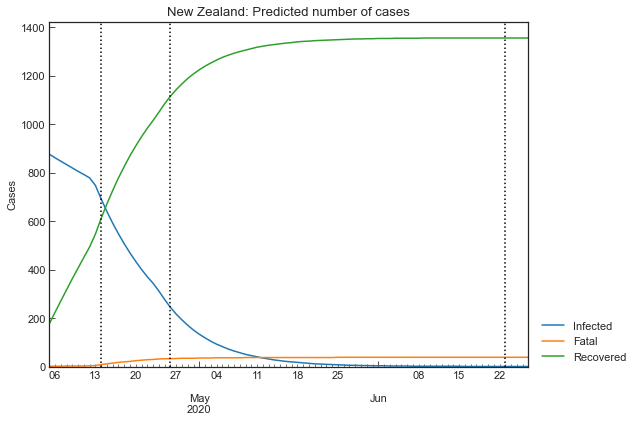

,Date,Susceptible,Infected,Recovered,Fatal
77,21Jun2020,4792608,0,1355,38
78,22Jun2020,4792608,0,1355,38
79,23Jun2020,4792608,0,1355,38
80,24Jun2020,4792608,0,1355,38
81,25Jun2020,4792608,0,1355,38
82,26Jun2020,4792608,0,1355,38
83,27Jun2020,4792608,0,1355,38


In [210]:
nzl_scenario.clear()
nzl_scenario.add_phase(days=7)
nzl_scenario.simulate().tail(7).style.background_gradient(axis=0)

In 30 days,

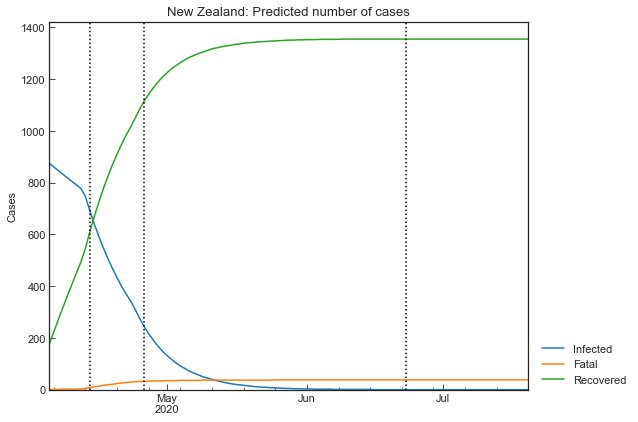

,Date,Susceptible,Infected,Recovered,Fatal
100,14Jul2020,4792608,0,1355,38
101,15Jul2020,4792608,0,1355,38
102,16Jul2020,4792608,0,1355,38
103,17Jul2020,4792608,0,1355,38
104,18Jul2020,4792608,0,1355,38
105,19Jul2020,4792608,0,1355,38
106,20Jul2020,4792608,0,1355,38


In [211]:
nzl_scenario.clear()
nzl_scenario.add_phase(days=30)
nzl_scenario.simulate().tail(7).style.background_gradient(axis=0)

In the long-term,

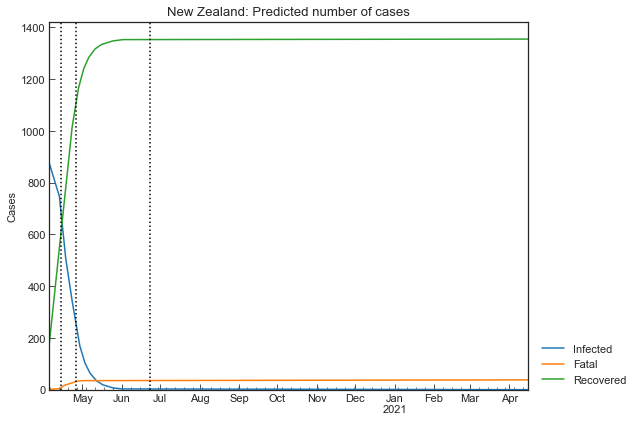

In [212]:
nzl_scenario.clear()
nzl_scenario.add_phase(days=300)
_ = nzl_scenario.simulate()

## Further Analysis<a id="13"></a>

In [214]:
confirmed = pd.read_csv('novel-corona-virus-2019-dataset/time_series_covid_19_confirmed.csv')
recovered = pd.read_csv('novel-corona-virus-2019-dataset/time_series_covid_19_recovered.csv')
deaths = pd.read_csv('novel-corona-virus-2019-dataset/time_series_covid_19_deaths.csv')

In [215]:
confirmed.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,24102,24766,25527,26310,26874,27532,27878,28424,28833,29157
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,1464,1521,1590,1672,1722,1788,1838,1891,1962,1995
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,10810,10919,11031,11147,11268,11385,11504,11631,11771,11920
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,853,853,853,854,854,855,855,855,855,855
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,138,140,142,148,155,166,172,176,183,186


In [216]:
recovered.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,4201,4725,5164,5508,6158,7660,7962,8292,8764,8841
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,1039,1044,1055,1064,1077,1086,1114,1126,1134,1159
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,7420,7606,7735,7842,7943,8078,8196,8324,8422,8559
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,781,781,789,789,791,792,792,792,792,796
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,61,61,64,64,64,64,66,66,77,77


In [217]:
deaths.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,451,471,478,491,504,546,548,569,581,598
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,36,36,36,37,38,39,42,43,44,44
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,760,767,777,788,799,811,825,837,845,852
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,51,51,51,52,52,52,52,52,52,52
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,6,6,6,6,7,8,8,9,9,10


In [218]:
confirmed.isnull().sum()[confirmed.isnull().sum()>0]

Province/State    185
dtype: int64

In [219]:
recovered.isnull().sum()[confirmed.isnull().sum()>0]

Province/State    186
dtype: int64

In [220]:
deaths.isnull().sum()[confirmed.isnull().sum()>0]

Province/State    185
dtype: int64

In [221]:
confirmed = confirmed.drop(columns='Province/State')
recovered = recovered.drop(columns='Province/State')
deaths = deaths.drop(columns='Province/State')

In [222]:
date = deaths.columns[3:]

In [223]:
currentCase = pd.DataFrame()
currentCase['Country/Region'] = confirmed['Country/Region']
currentCase['Lat'] = confirmed['Lat']
currentCase['Long'] = confirmed['Long']

In [224]:
currentCase.head()

,Country/Region,Lat,Long
0,Afghanistan,33.0000,65.0000
1,Albania,41.1533,20.1683
2,Algeria,28.0339,1.6596
3,Andorra,42.5063,1.5218
4,Angola,-11.2027,17.8739


In [225]:
for c in date:
    currentCase[c] = confirmed[c] - recovered[c] - deaths[c]

In [226]:
cum_confirmed = confirmed.groupby(['Country/Region','Lat','Long'])[date].agg('sum').reset_index()
cum_recovered = recovered.groupby(['Country/Region','Lat','Long'])[date].agg('sum').reset_index()
cum_deaths = deaths.groupby(['Country/Region','Lat','Long'])[date].agg('sum').reset_index()
cum_currentCase = currentCase.groupby(['Country/Region','Lat','Long'])[date].agg('sum').reset_index()

In [227]:
lat_mean = cum_confirmed.Lat.mean()
long_mean = cum_confirmed.Long.mean()
v = cum_confirmed.copy()

In [230]:
# Installs
!pip install pycountry_convert 
!pip install folium
!pip install calmap
# !pip install pandas==0.25.1
#!wget https://raw.githubusercontent.com/tarunk04/COVID-19-CaseStudy-and-Predictions/master/models/model_deaths_v5.h5
#!wget https://raw.githubusercontent.com/tarunk04/COVID-19-CaseStudy-and-Predictions/master/models/model_confirmed_v4.h5
#!wget https://raw.githubusercontent.com/tarunk04/COVID-19-CaseStudy-and-Predictions/master/models/model_usa_c_v3.h5

ERROR: After October 2020 you may experience errors when installing or updating packages. This is because pip will change the way that it resolves dependency conflicts.

We recommend you use --use-feature=2020-resolver to test your packages with the new resolver before it becomes the default.


streamlit 0.64.0 requires watchdog, which is not installed.


  Using cached toml-0.10.1-py2.py3-none-any.whl (19 kB)


In [231]:
!pip install keras==2.3.1

In [232]:
from matplotlib import ticker 
import pycountry_convert as pc
import folium
import branca
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline
import plotly.express as px
import json, requests
import calmap

from keras.layers import Input, Dense, Activation, LeakyReLU, Dropout
from keras import models
from keras.optimizers import RMSprop, Adam

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

Using TensorFlow backend.


In [233]:
from folium import plugins
from IPython.display import HTML

In [234]:
#Raw files taken from CSSEGIS JHU official github website
df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
df_recovered = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')

df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])


In [235]:
df_recovered = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
df_recovered.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,25669,25669,25742,25840,25903,25960,25960,26228,26415,26694
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,3031,3031,3123,3155,3227,3268,3342,3379,3480,3552
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,21901,22375,22802,23238,23667,24083,24506,24920,25263,25627
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,821,825,825,828,839,839,839,839,839,855
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,476,503,506,520,544,564,567,569,575,577


In [236]:
df_covid19 = df_covid19.drop(["People_Tested","People_Hospitalized","UID","ISO3","Mortality_Rate"],axis =1)
df_covid19.head()

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate
0,Afghanistan,2020-08-14 02:27:24,33.93911,67.709953,37424.0,1363.0,26714.0,9347.0,96.135615
1,Albania,2020-08-14 02:27:24,41.15330,20.168300,6971.0,213.0,3616.0,3142.0,242.233651
2,Algeria,2020-08-14 02:27:24,28.03390,1.659600,37187.0,1341.0,26004.0,9842.0,84.803000
3,Andorra,2020-08-14 02:27:24,42.50630,1.521800,981.0,53.0,858.0,70.0,1269.656377
4,Angola,2020-08-14 02:27:24,-11.20270,17.873900,1815.0,80.0,577.0,1158.0,5.522379


In [237]:
df_table.tail()

,Country_Region,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String,Delta_Deaths
50179,US,2020-08-08,3015,28,NaN,NaN,15.0,NaN,43525.335643,NaN,NaN,Wyoming,56.0,84000056,USA,2020/08/08,0.0
50180,US,2020-08-09,3050,28,NaN,NaN,35.0,NaN,44030.604879,NaN,NaN,Wyoming,56.0,84000056,USA,2020/08/09,0.0
50181,US,2020-08-10,3042,28,NaN,NaN,NaN,NaN,43915.114768,NaN,NaN,Wyoming,56.0,84000056,USA,2020/08/10,0.0
50182,US,2020-08-11,3073,29,NaN,NaN,31.0,NaN,44362.638949,NaN,NaN,Wyoming,56.0,84000056,USA,2020/08/11,1.0
50183,US,2020-08-12,3086,29,NaN,NaN,13.0,NaN,44550.310380,NaN,NaN,Wyoming,56.0,84000056,USA,2020/08/12,0.0


In [238]:
df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
df_deaths = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})
df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]

In [239]:
# Changing the conuntry names as required by pycountry_convert Lib
df_confirmed.loc[df_confirmed['country'] == "US", "country"] = "USA"
df_deaths.loc[df_deaths['country'] == "US", "country"] = "USA"
df_covid19.loc[df_covid19['country'] == "US", "country"] = "USA"
df_table.loc[df_table['Country_Region'] == "US", "Country_Region"] = "USA"
# df_recovered.loc[df_recovered['country'] == "US", "country"] = "USA"


df_confirmed.loc[df_confirmed['country'] == 'Korea, South', "country"] = 'South Korea'
df_deaths.loc[df_deaths['country'] == 'Korea, South', "country"] = 'South Korea'
df_covid19.loc[df_covid19['country'] == "Korea, South", "country"] = "South Korea"
df_table.loc[df_table['Country_Region'] == "Korea, South", "Country_Region"] = "South Korea"
# df_recovered.loc[df_recovered['country'] == 'Korea, South', "country"] = 'South Korea'

df_confirmed.loc[df_confirmed['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_deaths.loc[df_deaths['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_covid19.loc[df_covid19['country'] == "Taiwan*", "country"] = "Taiwan"
df_table.loc[df_table['Country_Region'] == "Taiwan*", "Country_Region"] = "Taiwan"
# df_recovered.loc[df_recovered['country'] == 'Taiwan*', "country"] = 'Taiwan'

df_confirmed.loc[df_confirmed['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Kinshasa)", "country"] = "Democratic Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Kinshasa)", "Country_Region"] = "Democratic Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_deaths.loc[df_deaths['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_covid19.loc[df_covid19['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_table.loc[df_table['Country_Region'] == "Cote d'Ivoire", "Country_Region"] = "Côte d'Ivoire"
# df_recovered.loc[df_recovered['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"

df_confirmed.loc[df_confirmed['country'] == "Reunion", "country"] = "Réunion"
df_deaths.loc[df_deaths['country'] == "Reunion", "country"] = "Réunion"
df_covid19.loc[df_covid19['country'] == "Reunion", "country"] = "Réunion"
df_table.loc[df_table['Country_Region'] == "Reunion", "Country_Region"] = "Réunion"
# df_recovered.loc[df_recovered['country'] == "Reunion", "country"] = "Réunion"

df_confirmed.loc[df_confirmed['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Brazzaville)", "country"] = "Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Brazzaville)", "Country_Region"] = "Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_deaths.loc[df_deaths['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_covid19.loc[df_covid19['country'] == "Bahamas, The", "country"] = "Bahamas"
df_table.loc[df_table['Country_Region'] == "Bahamas, The", "Country_Region"] = "Bahamas"
# df_recovered.loc[df_recovered['country'] == 'Bahamas, The', "country"] = 'Bahamas'

df_confirmed.loc[df_confirmed['country'] == 'Gambia, The', "country"] = 'Gambia'
df_deaths.loc[df_deaths['country'] == 'Gambia, The', "country"] = 'Gambia'
df_covid19.loc[df_covid19['country'] == "Gambia, The", "country"] = "Gambia"
df_table.loc[df_table['Country_Region'] == "Gambia", "Country_Region"] = "Gambia"
# df_recovered.loc[df_recovered['country'] == 'Gambia, The', "country"] = 'Gambia'

In [240]:
# getting all countries
countries = np.asarray(df_confirmed["country"])
countries1 = np.asarray(df_covid19["country"])
# Continent_code to Continent_names
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

# Defininng Function for getting continent code for country.
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'

#Collecting Continent Information
df_confirmed.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]])
df_deaths.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries[:]])
df_covid19.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in countries1[:]])
df_table.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in df_table["Country_Region"].values])

In [241]:
df_confirmed.head()

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20
0,NaN,Afghanistan,Asia,33.93911,67.709953,0,0,0,0,0,...,36747,36782,36829,36896,37015,37054,37054,37162,37269,37345
1,NaN,Albania,Europe,41.15330,20.168300,0,0,0,0,0,...,5620,5750,5889,6016,6151,6275,6411,6536,6676,6817
2,NaN,Algeria,Africa,28.03390,1.659600,0,0,0,0,0,...,31972,32504,33055,33626,34155,34693,35160,35712,36204,36699
3,NaN,Andorra,Europe,42.50630,1.521800,0,0,0,0,0,...,937,939,939,944,955,955,955,963,963,977
4,NaN,Angola,Africa,-11.20270,17.873900,0,0,0,0,0,...,1280,1344,1395,1483,1538,1572,1672,1679,1735,1762


In [242]:
df_table = df_table[df_table["continent"] != "Others"]

In [243]:
df_confirmed = df_confirmed.replace(np.nan, '', regex=True)
df_deaths = df_deaths.replace(np.nan, '', regex=True)

In [244]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)


In [245]:
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()


In [246]:
        
def get_total_cases(cases, country = "All"):
    if(country == "All") :
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]


In [247]:
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    else :
        Total_confirmed =  np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    
    return np.nan_to_num(mortality_rate)


In [248]:
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days


out = ""

In [249]:
df_covid19.head()

,country,continent,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate
0,Afghanistan,Asia,2020-08-14 02:27:24,33.93911,67.709953,37424.0,1363.0,26714.0,9347.0,96.135615
1,Albania,Europe,2020-08-14 02:27:24,41.15330,20.168300,6971.0,213.0,3616.0,3142.0,242.233651
2,Algeria,Africa,2020-08-14 02:27:24,28.03390,1.659600,37187.0,1341.0,26004.0,9842.0,84.803000
3,Andorra,Europe,2020-08-14 02:27:24,42.50630,1.521800,981.0,53.0,858.0,70.0,1269.656377
4,Angola,Africa,2020-08-14 02:27:24,-11.20270,17.873900,1815.0,80.0,577.0,1158.0,5.522379


In [250]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','continent','Last_Update'],axis =1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases = df_countries_cases.drop(['country'],axis=1)

df_continents_cases = df_covid19.copy().drop(['Lat','Long_','country','Last_Update'],axis =1)
df_continents_cases = df_continents_cases.groupby(["continent"]).sum()

df_countries_cases.fillna(0,inplace=True)
df_continents_cases.fillna(0,inplace=True)

In [251]:
df_t = pd.DataFrame(pd.to_numeric(df_countries_cases.sum()),dtype=np.float64).transpose()
df_t["Mortality Rate (per 100)"] = np.round(100*df_t["Deaths"]/df_t["Confirmed"],2)
df_t.style.background_gradient(cmap='Wistia',axis=1).format("{:.2f}").format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
0,20778947,753283,12935209,6984035,62796.35,3.63


In [252]:
df_continents_cases["Mortality Rate (per 100)"] = np.round(100*df_continents_cases["Deaths"]/df_continents_cases["Confirmed"],2)
df_continents_cases.style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Reds',subset=["Deaths"])\
                        .background_gradient(cmap='Greens',subset=["Recovered"])\
                        .background_gradient(cmap='Purples',subset=["Active"])\
                        .background_gradient(cmap='Pastel1_r',subset=["Incident_Rate"])\
                        .background_gradient(cmap='YlOrBr',subset=["Mortality Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
continent,,,,,,
Africa,1080856,24614,778009,278233,5365.81,2.28
Asia,5315365,114423,4051695,1149247,19977.32,2.15
Australia,24642,401,14630,9611,128.70,1.63
Europe,3109815,206987,1786464,1009951,17945.67,6.66
North America,6214559,239711,2476519,3498329,7440.55,3.86
Others,43379,1090,27266,15016,3290.85,2.51
South America,4990331,166057,3800626,1023648,8647.46,3.33


In [253]:
df_countries_cases["Mortality Rate (per 100)"] = np.round(100*df_countries_cases["Deaths"]/df_countries_cases["Confirmed"],2)
df_countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='Blues',subset=["Confirmed"])\
                        .background_gradient(cmap='Reds',subset=["Deaths"])\
                        .background_gradient(cmap='Greens',subset=["Recovered"])\
                        .background_gradient(cmap='Purples',subset=["Active"])\
                        .background_gradient(cmap='Pastel1_r',subset=["Incident_Rate"])\
                        .background_gradient(cmap='YlOrBr',subset=["Mortality Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:.0f}",subset=["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
country,,,,,,
USA,5248678,167097,1774648,3306933,1593.09,3.18
Brazil,3164785,104201,2520182,540402,1488.89,3.29
India,2396637,47033,1695982,653622,173.67,1.96
Russia,905762,15353,714934,175475,620.66,1.70
South Africa,572865,11270,437617,123978,965.90,1.97
Mexico,505751,55293,406583,43875,395.76,10.93
Peru,498555,21713,341938,134904,1512.06,4.36
Colombia,433805,14145,250494,169166,852.56,3.26
Chile,380034,10299,353131,16604,1988.02,2.71


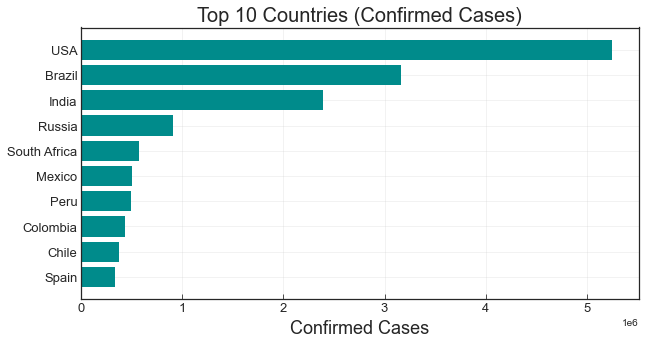

In [254]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Confirmed Cases",fontsize=18)
plt.title("Top 10 Countries (Confirmed Cases)",fontsize=20)
plt.grid(alpha=0.3)
#plt.savefig(out+'Top 10 Countries (Confirmed Cases).png')

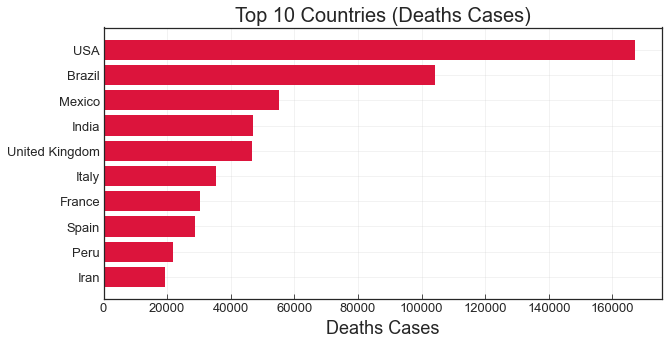

In [255]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Deaths Cases",fontsize=18)
plt.title("Top 10 Countries (Deaths Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
#plt.savefig(out+'Top 10 Countries (Deaths Cases).png')

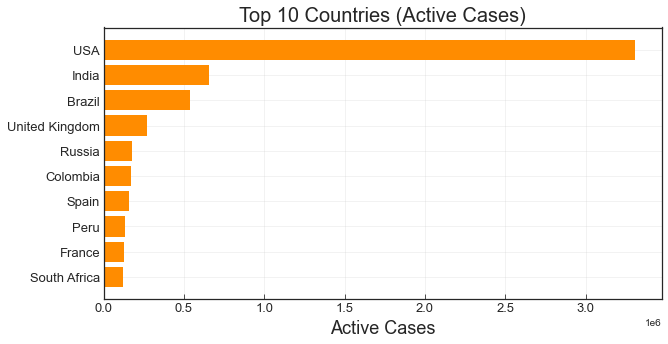

In [256]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Active')["Active"].index[-10:],df_countries_cases.sort_values('Active')["Active"].values[-10:],color="darkorange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Active Cases",fontsize=18)
plt.title("Top 10 Countries (Active Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
#plt.savefig(out+'Top 10 Countries (Active Cases).png')

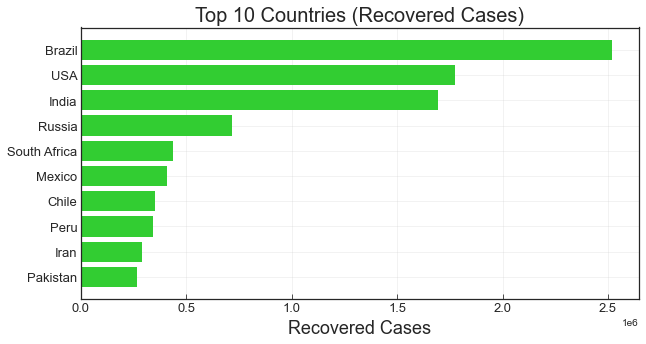

In [257]:
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Recovered')["Recovered"].index[-10:],df_countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="limegreen")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Recovered Cases",fontsize=18)
plt.title("Top 10 Countries (Recovered Cases)",fontsize=20)
plt.grid(alpha=0.3,which='both')
#plt.savefig(out+'Top 10 Countries (Recovered Cases).png')

In [258]:
#df_countries_cases.iloc[:,:].corr().style.background_gradient(cmap='Reds').format("{:.3f}")

In [259]:
world_map = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2,max_zoom=6,min_zoom=2)
for i in range(0,len(df_confirmed)):
    folium.Circle(
        location=[df_confirmed.iloc[i]['Lat'], df_confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_confirmed.iloc[i]['country']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(df_confirmed.iloc[i]['state']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(df_deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_deaths.iloc[i,-1]/(df_confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(df_confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(world_map)

world_map


In [260]:
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths'].max().reset_index().fillna(0)
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, locations="Country_Region", locationmode='country names', 
                     color=np.power(df_data["Confirmed"],0.3)-2 , size= np.power(df_data["Confirmed"]+1,0.3)-1, hover_name="Country_Region",
                     hover_data=["Confirmed"],
                     range_color= [0, max(np.power(df_data["Confirmed"],0.3))], 
                     projection="natural earth", animation_frame="Last_Update", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='COVID-19: Progression of spread'
                    )
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()

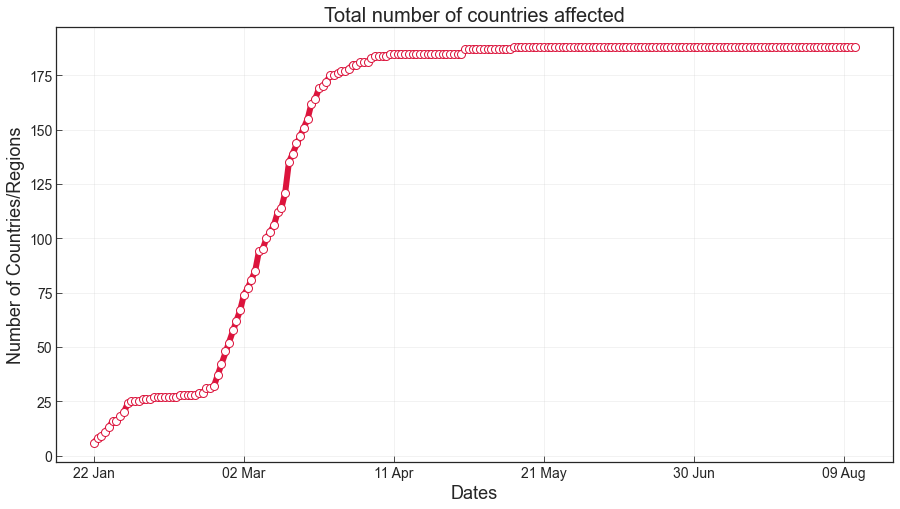

In [267]:
case_nums_country = df_confirmed.groupby("country").sum().drop(['Lat','Long'],axis =1).apply(lambda x: x[x > 0].count(), axis =0)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]

f = plt.figure(figsize=(15,8))
f.add_subplot(111)
marker_style = dict(c="crimson",linewidth=6, linestyle='-', marker='o',markersize=8, markerfacecolor='#ffffff')
plt.plot(d, case_nums_country,**marker_style)
plt.tick_params(labelsize = 14)
plt.xticks(list(np.arange(0,len(d),int(len(d)/5))),d[:-1:int(len(d)/5)])

#labels
plt.xlabel("Dates",fontsize=18)
plt.ylabel("Number of Countries/Regions",fontsize=18)
plt.title("Total number of countries affected",fontsize=20)
plt.grid(alpha = 0.3)

#plt.savefig(out+'spread.png')
plt.show()
#plt.close()

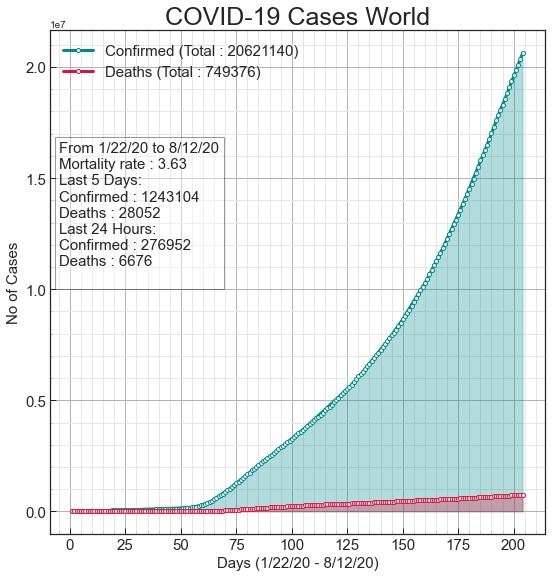

In [268]:
cols = 1
rows = 1
f = plt.figure(figsize=(10,10*rows))

visualize_covid_cases(df_confirmed, df_deaths,continent = "All",figure = [f,rows,cols, 1])

plt.show()

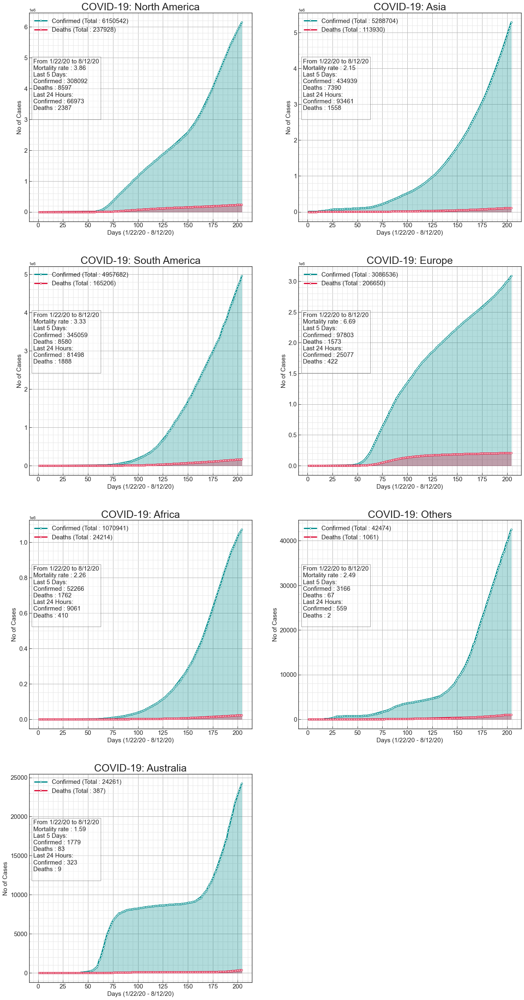

In [269]:
df_continents= df_confirmed.groupby(["continent"]).sum()
continents = df_continents.sort_values(df_continents.columns[-1],ascending = False).index

cols =2
rows = int(np.ceil(continents.shape[0]/cols))
f = plt.figure(figsize=(20,9*rows))
for i,continent in enumerate(continents):
    visualize_covid_cases(df_confirmed, df_deaths, continent = continent,figure = [f,rows,cols, i+1])

plt.show()

## Building a model for trend prediction for Global Confirmed Cases

In [270]:
Visible = Input(shape=(1,))
Dense_l1 = Dense(80,name="Dense_l1")(Visible)
LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)

Dense_l2 = Dense(80,name = "Dense_l2")(LRelu_l1)
LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)

Dense_l3 = Dense(80,name = "Dense_l3")(LRelu_l2)
LRelu_l3 = LeakyReLU(name = "LRelu_l3")(Dense_l3)

Dense_l4 = Dense(1,name="Dense_l4")(LRelu_l3)
LRelu_l4 = LeakyReLU(name = "Output")(Dense_l4)

model = models.Model(inputs=Visible, outputs=LRelu_l4)
model.compile(optimizer=Adam(lr=0.001), 
              loss='mean_squared_error',
              metrics=['accuracy'])
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
____________________________________________

In [271]:
data_y = np.log10(np.asarray(df_confirmed.iloc[:,5:].sum(axis =0)).astype("float32"))
data_x = np.arange(1,len(data_y)+1)

In [272]:
epochs = 1000
model.fit(data_x.reshape([data_y.shape[0],1]),data_y.reshape([data_y.shape[0],1]),epochs=epochs)


Epoch 1/1000
204/204 [==============================] - ETA: 0s - loss: 6.7252 - accuracy: 0.0000e+ - 0s 748us/step - loss: 25.6573 - accuracy: 0.0000e+00
Epoch 2/1000
204/204 [==============================] - ETA: 0s - loss: 8.5632 - accuracy: 0.0000e+ - 0s 83us/step - loss: 10.1428 - accuracy: 0.0000e+00
Epoch 3/1000
204/204 [==============================] - ETA: 0s - loss: 3.5164 - accuracy: 0.0000e+ - 0s 54us/step - loss: 7.0474 - accuracy: 0.0000e+00
Epoch 4/1000
204/204 [==============================] - ETA: 0s - loss: 5.3381 - accuracy: 0.0000e+ - 0s 59us/step - loss: 5.7390 - accuracy: 0.0000e+00
Epoch 5/1000
204/204 [==============================] - ETA: 0s - loss: 5.5195 - accuracy: 0.0000e+ - 0s 49us/step - loss: 5.0811 - accuracy: 0.0000e+00
Epoch 6/1000
204/204 [==============================] - ETA: 0s - loss: 5.2020 - accuracy: 0.0000e+ - 0s 54us/step - loss: 4.5682 - accuracy: 0.0000e+00
Epoch 7/1000
204/204 [==============================] - ETA: 0s - loss: 2.8327

Epoch 53/1000
204/204 [==============================] - ETA: 0s - loss: 0.3160 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.2181 - accuracy: 0.0000e+00
Epoch 54/1000
204/204 [==============================] - ETA: 0s - loss: 0.1412 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.1334 - accuracy: 0.0000e+00
Epoch 55/1000
204/204 [==============================] - ETA: 0s - loss: 0.1751 - accuracy: 0.0000e+ - 0s 156us/step - loss: 0.1596 - accuracy: 0.0000e+00
Epoch 56/1000
204/204 [==============================] - ETA: 0s - loss: 0.4640 - accuracy: 0.0000e+ - 0s 78us/step - loss: 0.2420 - accuracy: 0.0000e+00
Epoch 57/1000
204/204 [==============================] - ETA: 0s - loss: 0.1685 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.1297 - accuracy: 0.0000e+00
Epoch 58/1000
204/204 [==============================] - ETA: 0s - loss: 0.1390 - accuracy: 0.0000e+ - 0s 78us/step - loss: 0.1562 - accuracy: 0.0000e+00
Epoch 59/1000
204/204 [==============================] - ETA: 0s - loss: 0.

Epoch 159/1000
204/204 [==============================] - ETA: 0s - loss: 0.0941 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.1072 - accuracy: 0.0000e+00
Epoch 160/1000
204/204 [==============================] - ETA: 0s - loss: 0.1441 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.1635 - accuracy: 0.0000e+00
Epoch 161/1000
204/204 [==============================] - ETA: 0s - loss: 0.0514 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0595 - accuracy: 0.0000e+00
Epoch 162/1000
204/204 [==============================] - ETA: 0s - loss: 0.0495 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0419 - accuracy: 0.0000e+00
Epoch 163/1000
204/204 [==============================] - ETA: 0s - loss: 0.0366 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0441 - accuracy: 0.0000e+00
Epoch 164/1000
204/204 [==============================] - ETA: 0s - loss: 0.0953 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.0515 - accuracy: 0.0000e+00
Epoch 165/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 212/1000
204/204 [==============================] - ETA: 0s - loss: 0.7767 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.4952 - accuracy: 0.0000e+00
Epoch 213/1000
204/204 [==============================] - ETA: 0s - loss: 0.2239 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.1759 - accuracy: 0.0000e+00
Epoch 214/1000
204/204 [==============================] - ETA: 0s - loss: 0.6179 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.5504 - accuracy: 0.0000e+00
Epoch 215/1000
204/204 [==============================] - ETA: 0s - loss: 0.1637 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.4192 - accuracy: 0.0000e+00
Epoch 216/1000
204/204 [==============================] - ETA: 0s - loss: 0.2387 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.4884 - accuracy: 0.0000e+00
Epoch 217/1000
204/204 [==============================] - ETA: 0s - loss: 0.2601 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.1979 - accuracy: 0.0000e+00
Epoch 218/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 265/1000
204/204 [==============================] - ETA: 0s - loss: 0.0151 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 266/1000
204/204 [==============================] - ETA: 0s - loss: 0.0422 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0294 - accuracy: 0.0000e+00
Epoch 267/1000
204/204 [==============================] - ETA: 0s - loss: 0.0225 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0371 - accuracy: 0.0000e+00
Epoch 268/1000
204/204 [==============================] - ETA: 0s - loss: 0.0196 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0260 - accuracy: 0.0000e+00
Epoch 269/1000
204/204 [==============================] - ETA: 0s - loss: 0.0429 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0291 - accuracy: 0.0000e+00
Epoch 270/1000
204/204 [==============================] - ETA: 0s - loss: 0.0215 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0215 - accuracy: 0.0000e+00
Epoch 271/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 318/1000
204/204 [==============================] - ETA: 0s - loss: 0.0146 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 319/1000
204/204 [==============================] - ETA: 0s - loss: 0.0138 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 320/1000
204/204 [==============================] - ETA: 0s - loss: 0.0191 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 321/1000
204/204 [==============================] - ETA: 0s - loss: 0.0126 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0223 - accuracy: 0.0000e+00
Epoch 322/1000
204/204 [==============================] - ETA: 0s - loss: 0.0968 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0478 - accuracy: 0.0000e+00
Epoch 323/1000
204/204 [==============================] - ETA: 0s - loss: 0.0265 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0408 - accuracy: 0.0000e+00
Epoch 324/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 371/1000
204/204 [==============================] - ETA: 0s - loss: 0.0086 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0279 - accuracy: 0.0000e+00
Epoch 372/1000
204/204 [==============================] - ETA: 0s - loss: 0.1333 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0687 - accuracy: 0.0000e+00
Epoch 373/1000
204/204 [==============================] - ETA: 0s - loss: 0.0875 - accuracy: 0.0000e+ - 0s 49us/step - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 374/1000
204/204 [==============================] - ETA: 0s - loss: 0.0199 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0229 - accuracy: 0.0000e+00
Epoch 375/1000
204/204 [==============================] - ETA: 0s - loss: 0.0078 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 376/1000
204/204 [==============================] - ETA: 0s - loss: 0.0179 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 377/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 424/1000
204/204 [==============================] - ETA: 0s - loss: 2.1676 - accuracy: 0.0000e+ - 0s 59us/step - loss: 1.9895 - accuracy: 0.0000e+00
Epoch 425/1000
204/204 [==============================] - ETA: 0s - loss: 2.4622 - accuracy: 0.0000e+ - 0s 68us/step - loss: 1.6710 - accuracy: 0.0000e+00
Epoch 426/1000
204/204 [==============================] - ETA: 0s - loss: 1.5728 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.6972 - accuracy: 0.0000e+00
Epoch 427/1000
204/204 [==============================] - ETA: 0s - loss: 0.4617 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.3774 - accuracy: 0.0000e+00
Epoch 428/1000
204/204 [==============================] - ETA: 0s - loss: 0.6694 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.2902 - accuracy: 0.0000e+00
Epoch 429/1000
204/204 [==============================] - ETA: 0s - loss: 0.1403 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.1497 - accuracy: 0.0000e+00
Epoch 430/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 477/1000
204/204 [==============================] - ETA: 0s - loss: 0.0252 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 478/1000
204/204 [==============================] - ETA: 0s - loss: 0.0055 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 479/1000
204/204 [==============================] - ETA: 0s - loss: 0.0102 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 480/1000
204/204 [==============================] - ETA: 0s - loss: 0.0139 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 481/1000
204/204 [==============================] - ETA: 0s - loss: 0.0322 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 482/1000
204/204 [==============================] - ETA: 0s - loss: 0.0273 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0254 - accuracy: 0.0000e+00
Epoch 483/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 530/1000
204/204 [==============================] - ETA: 0s - loss: 0.1035 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.1216 - accuracy: 0.0000e+00
Epoch 531/1000
204/204 [==============================] - ETA: 0s - loss: 0.5589 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.4169 - accuracy: 0.0000e+00
Epoch 532/1000
204/204 [==============================] - ETA: 0s - loss: 0.9577 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.4738 - accuracy: 0.0000e+00
Epoch 533/1000
204/204 [==============================] - ETA: 0s - loss: 0.0297 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0417 - accuracy: 0.0000e+00
Epoch 534/1000
204/204 [==============================] - ETA: 0s - loss: 0.0629 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0524 - accuracy: 0.0000e+00
Epoch 535/1000
204/204 [==============================] - ETA: 0s - loss: 0.0128 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0291 - accuracy: 0.0000e+00
Epoch 536/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 583/1000
204/204 [==============================] - ETA: 0s - loss: 0.0267 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 584/1000
204/204 [==============================] - ETA: 0s - loss: 0.0053 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 585/1000
204/204 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 586/1000
204/204 [==============================] - ETA: 0s - loss: 0.0091 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 587/1000
204/204 [==============================] - ETA: 0s - loss: 0.0213 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 588/1000
204/204 [==============================] - ETA: 0s - loss: 0.0045 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 589/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 636/1000
204/204 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 637/1000
204/204 [==============================] - ETA: 0s - loss: 0.0060 - accuracy: 0.0000e+ - 0s 49us/step - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 638/1000
204/204 [==============================] - ETA: 0s - loss: 0.0173 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 639/1000
204/204 [==============================] - ETA: 0s - loss: 0.0192 - accuracy: 0.0000e+ - 0s 49us/step - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 640/1000
204/204 [==============================] - ETA: 0s - loss: 0.0056 - accuracy: 0.0000e+ - 0s 83us/step - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 641/1000
204/204 [==============================] - ETA: 0s - loss: 0.0274 - accuracy: 0.0000e+ - 0s 83us/step - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 642/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 689/1000
204/204 [==============================] - ETA: 0s - loss: 0.0016 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 690/1000
204/204 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 691/1000
204/204 [==============================] - ETA: 0s - loss: 0.0012 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 692/1000
204/204 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 693/1000
204/204 [==============================] - ETA: 0s - loss: 0.0023 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 694/1000
204/204 [==============================] - ETA: 0s - loss: 0.0029 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 695/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 742/1000
204/204 [==============================] - ETA: 0s - loss: 0.0292 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0182 - accuracy: 0.0000e+00
Epoch 743/1000
204/204 [==============================] - ETA: 0s - loss: 0.0250 - accuracy: 0.0000e+ - 0s 54us/step - loss: 0.0252 - accuracy: 0.0000e+00
Epoch 744/1000
204/204 [==============================] - ETA: 0s - loss: 0.0145 - accuracy: 0.0000e+ - 0s 78us/step - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 745/1000
204/204 [==============================] - ETA: 0s - loss: 0.0271 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 746/1000
204/204 [==============================] - ETA: 0s - loss: 0.1339 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0949 - accuracy: 0.0000e+00
Epoch 747/1000
204/204 [==============================] - ETA: 0s - loss: 0.1554 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.1484 - accuracy: 0.0000e+00
Epoch 748/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 795/1000
204/204 [==============================] - ETA: 0s - loss: 0.0095 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 796/1000
204/204 [==============================] - ETA: 0s - loss: 0.0239 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 797/1000
204/204 [==============================] - ETA: 0s - loss: 0.0089 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 798/1000
204/204 [==============================] - ETA: 0s - loss: 0.0162 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 799/1000
204/204 [==============================] - ETA: 0s - loss: 0.0240 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 800/1000
204/204 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 0.0000e+ - 0s 78us/step - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 801/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 848/1000
204/204 [==============================] - ETA: 0s - loss: 0.0187 - accuracy: 0.0000e+ - 0s 59us/step - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 849/1000
204/204 [==============================] - ETA: 0s - loss: 0.0052 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 850/1000
204/204 [==============================] - ETA: 0s - loss: 0.0037 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 851/1000
204/204 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 852/1000
204/204 [==============================] - ETA: 0s - loss: 0.0020 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 853/1000
204/204 [==============================] - ETA: 0s - loss: 0.0055 - accuracy: 0.0000e+ - 0s 78us/step - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 854/1000
204/204 [==============================] - ETA: 0s - lo

Epoch 901/1000
204/204 [==============================] - ETA: 0s - loss: 0.0019 - accuracy: 0.0000e+ - 0s 49us/step - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 902/1000
204/204 [==============================] - ETA: 0s - loss: 0.0025 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 903/1000
204/204 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 904/1000
204/204 [==============================] - ETA: 0s - loss: 0.0035 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 905/1000
204/204 [==============================] - ETA: 0s - loss: 7.3705e-04 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 906/1000
204/204 [==============================] - ETA: 0s - loss: 0.0050 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 907/1000
204/204 [==============================] - ETA: 0s 

Epoch 954/1000
204/204 [==============================] - ETA: 0s - loss: 0.0053 - accuracy: 0.0000e+ - 0s 98us/step - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 955/1000
204/204 [==============================] - ETA: 0s - loss: 0.0052 - accuracy: 0.0000e+ - 0s 78us/step - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 956/1000
204/204 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 0.0000e+ - 0s 73us/step - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 957/1000
204/204 [==============================] - ETA: 0s - loss: 0.0044 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 958/1000
204/204 [==============================] - ETA: 0s - loss: 0.0034 - accuracy: 0.0000e+ - 0s 68us/step - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 959/1000
204/204 [==============================] - ETA: 0s - loss: 0.0021 - accuracy: 0.0000e+ - 0s 64us/step - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 960/1000
204/204 [==============================] - ETA: 0s - lo

In [273]:
model.save('model_confirmed_v4.h5')

In [274]:
model = models.load_model("model_confirmed_v4.h5")
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l3 (LeakyReLU)         (None, 80)                0   

In [275]:
lakh = 100000
prediction_days = 10

temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
data = np.power(10,model.predict(np.arange(1,len(temp_data)+prediction_days+1)))
data

array([[5.39390503e+02],
       [6.98226440e+02],
       [1.03005920e+03],
       [1.53368921e+03],
       [2.17690674e+03],
       [3.02870996e+03],
       [4.10428613e+03],
       [5.47589453e+03],
       [7.25200586e+03],
       [9.54050488e+03],
       [1.23022061e+04],
       [1.52576416e+04],
       [1.81666152e+04],
       [2.13270293e+04],
       [2.48483477e+04],
       [2.88467773e+04],
       [3.25143770e+04],
       [3.57428594e+04],
       [3.92026211e+04],
       [4.29975156e+04],
       [4.71204258e+04],
       [5.12631719e+04],
       [5.55189844e+04],
       [5.97432695e+04],
       [6.27609414e+04],
       [6.53350117e+04],
       [6.77415859e+04],
       [6.97328125e+04],
       [7.09582188e+04],
       [7.20697109e+04],
       [7.31985391e+04],
       [7.43449688e+04],
       [7.55097656e+04],
       [7.66923047e+04],
       [7.78932812e+04],
       [7.91134062e+04],
       [8.03523828e+04],
       [8.16110312e+04],
       [8.28891250e+04],
       [8.43879609e+04],


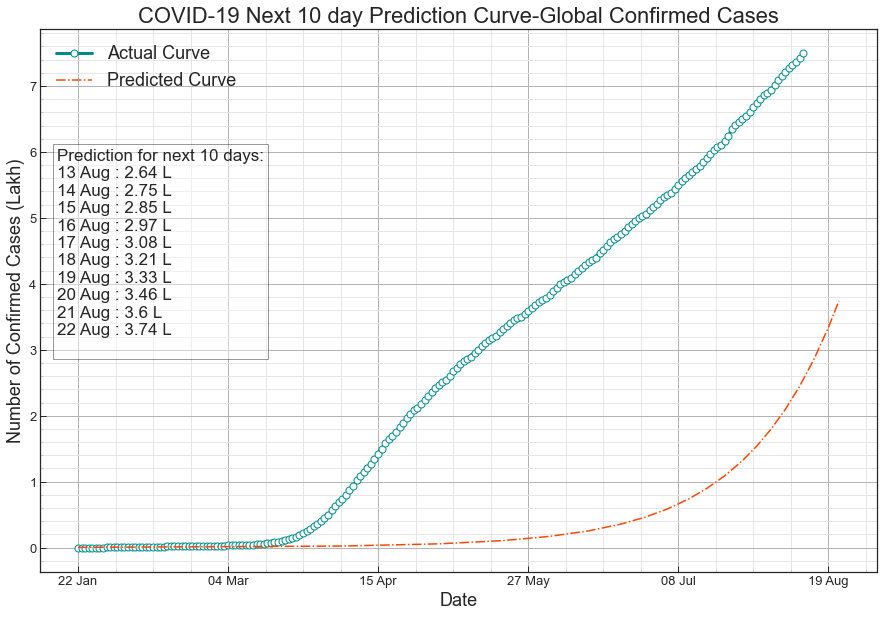

In [288]:
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)

date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/lakh,"-.",color="darkcyan",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/lakh,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total = d + nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-3)[0]/lakh)+" L\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 10 day Prediction Curve-Global Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Confirmed Cases (Lakh)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig(out+"Prediction Curve-Confirmed.png")
plt.show()


## Building a model for trend prediction for Global Death Cases

In [277]:
Visible = Input(shape=(1,))
Dense_l1 = Dense(80,name="Dense_l1")(Visible)
LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)
Drop1 = Dropout(0.25)(LRelu_l1)

Dense_l2 = Dense(80,name = "Dense_l2")(Drop1)
LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)
Drop2 = Dropout(0.3)(LRelu_l2)

Dense_l3 = Dense(80,name = "Dense_l3")(Drop2)
LRelu_l3 = LeakyReLU(name = "LRelu_l3")(Dense_l3)
Drop3 = Dropout(0.4)(LRelu_l3)

Dense_l4 = Dense(1,name="Dense_l4")(Drop3)
LRelu_l4 = LeakyReLU(name = "Output")(Dense_l4)

model2 = models.Model(inputs=Visible, outputs=LRelu_l4)
model2.compile(optimizer=Adam(lr=0.0001), 
              loss='mean_squared_error')
model2.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 80)                0   

In [278]:
data1_y = np.log10(np.asarray(df_deaths.iloc[:,5:].sum(axis =0)).astype("float32"))
data1_x = np.arange(1,len(data1_y)+1)

In [279]:
epochs= 1000
model2.fit(data1_x.reshape([data1_y.shape[0],1]),data1_y.reshape([data1_y.shape[0],1]),epochs=epochs)

Epoch 1/1000
204/204 [==============================] - ETA: 1s - loss: 43.96 - 0s 1ms/step - loss: 69.8357
Epoch 2/1000
204/204 [==============================] - ETA: 0s - loss: 57.44 - 0s 68us/step - loss: 65.0623
Epoch 3/1000
204/204 [==============================] - ETA: 0s - loss: 66.72 - 0s 68us/step - loss: 63.6355
Epoch 4/1000
204/204 [==============================] - ETA: 0s - loss: 62.75 - 0s 73us/step - loss: 65.9427
Epoch 5/1000
204/204 [==============================] - ETA: 0s - loss: 94.25 - 0s 73us/step - loss: 75.9420
Epoch 6/1000
204/204 [==============================] - ETA: 0s - loss: 35.36 - 0s 73us/step - loss: 51.0853
Epoch 7/1000
204/204 [==============================] - ETA: 0s - loss: 89.00 - 0s 93us/step - loss: 63.2172
Epoch 8/1000
204/204 [==============================] - ETA: 0s - loss: 54.26 - 0s 73us/step - loss: 53.3127
Epoch 9/1000
204/204 [==============================] - ETA: 0s - loss: 39.72 - 0s 83us/step - loss: 52.9389
Epoch 10/1000
204/20

204/204 [==============================] - ETA: 0s - loss: 9.632 - 0s 78us/step - loss: 12.0211
Epoch 150/1000
204/204 [==============================] - ETA: 0s - loss: 8.991 - 0s 68us/step - loss: 11.3550
Epoch 151/1000
204/204 [==============================] - ETA: 0s - loss: 10.81 - 0s 73us/step - loss: 9.5655
Epoch 152/1000
204/204 [==============================] - ETA: 0s - loss: 7.305 - 0s 73us/step - loss: 9.9115
Epoch 153/1000
204/204 [==============================] - ETA: 0s - loss: 9.262 - 0s 68us/step - loss: 9.9099
Epoch 154/1000
204/204 [==============================] - ETA: 0s - loss: 7.436 - 0s 68us/step - loss: 8.7559
Epoch 155/1000
204/204 [==============================] - ETA: 0s - loss: 10.08 - 0s 73us/step - loss: 9.1712
Epoch 156/1000
204/204 [==============================] - ETA: 0s - loss: 7.710 - 0s 83us/step - loss: 8.7804
Epoch 157/1000
204/204 [==============================] - ETA: 0s - loss: 7.787 - 0s 68us/step - loss: 7.4769
Epoch 158/1000
204/204 

204/204 [==============================] - ETA: 0s - loss: 7.484 - 0s 83us/step - loss: 6.0403
Epoch 298/1000
204/204 [==============================] - ETA: 0s - loss: 5.204 - 0s 68us/step - loss: 6.1621
Epoch 299/1000
204/204 [==============================] - ETA: 0s - loss: 3.176 - 0s 73us/step - loss: 5.8562
Epoch 300/1000
204/204 [==============================] - ETA: 0s - loss: 7.092 - 0s 73us/step - loss: 5.2345
Epoch 301/1000
204/204 [==============================] - ETA: 0s - loss: 10.37 - 0s 73us/step - loss: 5.5458
Epoch 302/1000
204/204 [==============================] - ETA: 0s - loss: 9.182 - 0s 78us/step - loss: 5.4422
Epoch 303/1000
204/204 [==============================] - ETA: 0s - loss: 3.314 - 0s 88us/step - loss: 5.0720
Epoch 304/1000
204/204 [==============================] - ETA: 0s - loss: 5.725 - 0s 83us/step - loss: 5.7822
Epoch 305/1000
204/204 [==============================] - ETA: 0s - loss: 5.463 - 0s 68us/step - loss: 4.9874
Epoch 306/1000
204/204 [=

204/204 [==============================] - ETA: 0s - loss: 3.996 - 0s 73us/step - loss: 3.3482
Epoch 446/1000
204/204 [==============================] - ETA: 0s - loss: 3.301 - 0s 68us/step - loss: 3.7670
Epoch 447/1000
204/204 [==============================] - ETA: 0s - loss: 3.185 - 0s 68us/step - loss: 2.6981
Epoch 448/1000
204/204 [==============================] - ETA: 0s - loss: 2.297 - 0s 73us/step - loss: 3.3706
Epoch 449/1000
204/204 [==============================] - ETA: 0s - loss: 4.004 - 0s 78us/step - loss: 3.5499
Epoch 450/1000
204/204 [==============================] - ETA: 0s - loss: 3.078 - 0s 78us/step - loss: 2.9238
Epoch 451/1000
204/204 [==============================] - ETA: 0s - loss: 4.333 - 0s 78us/step - loss: 3.9535
Epoch 452/1000
204/204 [==============================] - ETA: 0s - loss: 2.817 - 0s 73us/step - loss: 3.1985
Epoch 453/1000
204/204 [==============================] - ETA: 0s - loss: 4.625 - 0s 73us/step - loss: 3.2154
Epoch 454/1000
204/204 [=

204/204 [==============================] - ETA: 0s - loss: 1.576 - 0s 83us/step - loss: 2.2836
Epoch 594/1000
204/204 [==============================] - ETA: 0s - loss: 1.967 - 0s 88us/step - loss: 2.2163
Epoch 595/1000
204/204 [==============================] - ETA: 0s - loss: 1.899 - 0s 83us/step - loss: 2.2036
Epoch 596/1000
204/204 [==============================] - ETA: 0s - loss: 2.156 - 0s 93us/step - loss: 2.0766
Epoch 597/1000
204/204 [==============================] - ETA: 0s - loss: 2.283 - 0s 88us/step - loss: 2.2401
Epoch 598/1000
204/204 [==============================] - ETA: 0s - loss: 2.048 - 0s 93us/step - loss: 2.4953
Epoch 599/1000
204/204 [==============================] - ETA: 0s - loss: 2.822 - 0s 127us/step - loss: 2.1550
Epoch 600/1000
204/204 [==============================] - ETA: 0s - loss: 3.368 - 0s 93us/step - loss: 2.6905
Epoch 601/1000
204/204 [==============================] - ETA: 0s - loss: 1.296 - 0s 83us/step - loss: 2.0276
Epoch 602/1000
204/204 [

204/204 [==============================] - ETA: 0s - loss: 1.009 - 0s 73us/step - loss: 1.4833
Epoch 742/1000
204/204 [==============================] - ETA: 0s - loss: 1.680 - 0s 68us/step - loss: 1.6271
Epoch 743/1000
204/204 [==============================] - ETA: 0s - loss: 1.487 - 0s 68us/step - loss: 1.5808
Epoch 744/1000
204/204 [==============================] - ETA: 0s - loss: 1.250 - 0s 88us/step - loss: 1.7734
Epoch 745/1000
204/204 [==============================] - ETA: 0s - loss: 1.012 - 0s 68us/step - loss: 1.4105
Epoch 746/1000
204/204 [==============================] - ETA: 0s - loss: 1.680 - 0s 68us/step - loss: 1.3939
Epoch 747/1000
204/204 [==============================] - ETA: 0s - loss: 1.143 - 0s 73us/step - loss: 1.8564
Epoch 748/1000
204/204 [==============================] - ETA: 0s - loss: 1.450 - 0s 68us/step - loss: 1.3156
Epoch 749/1000
204/204 [==============================] - ETA: 0s - loss: 1.301 - 0s 93us/step - loss: 1.8470
Epoch 750/1000
204/204 [=

204/204 [==============================] - ETA: 0s - loss: 1.883 - 0s 83us/step - loss: 1.3950
Epoch 890/1000
204/204 [==============================] - ETA: 0s - loss: 0.723 - 0s 83us/step - loss: 1.1777
Epoch 891/1000
204/204 [==============================] - ETA: 0s - loss: 1.104 - 0s 83us/step - loss: 0.9479
Epoch 892/1000
204/204 [==============================] - ETA: 0s - loss: 1.616 - 0s 88us/step - loss: 1.2126
Epoch 893/1000
204/204 [==============================] - ETA: 0s - loss: 1.299 - 0s 83us/step - loss: 1.1103
Epoch 894/1000
204/204 [==============================] - ETA: 0s - loss: 1.449 - 0s 78us/step - loss: 1.1814
Epoch 895/1000
204/204 [==============================] - ETA: 0s - loss: 1.378 - 0s 78us/step - loss: 1.2584
Epoch 896/1000
204/204 [==============================] - ETA: 0s - loss: 1.066 - 0s 73us/step - loss: 1.1627
Epoch 897/1000
204/204 [==============================] - ETA: 0s - loss: 0.985 - 0s 83us/step - loss: 1.3152
Epoch 898/1000
204/204 [=

In [280]:
model2.save('model_deaths_v5.h5')

In [281]:
model2 = models.load_model("model_deaths_v5.h5")
model2.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 80)                0   

In [282]:
thousand = 1000
prediction_days = 10

temp_data = df_deaths.iloc[:,5:].sum(axis =0)
data = np.power(10,model2.predict(np.arange(1,len(temp_data)+prediction_days+1)))
data

array([[3.50121307e+02],
       [3.57383057e+02],
       [3.63943695e+02],
       [3.71523956e+02],
       [3.79303101e+02],
       [3.87377197e+02],
       [3.95816071e+02],
       [4.04438995e+02],
       [4.13249542e+02],
       [4.23474487e+02],
       [4.34287506e+02],
       [4.45059845e+02],
       [4.56099426e+02],
       [4.67412323e+02],
       [4.79049438e+02],
       [4.91153717e+02],
       [5.03563812e+02],
       [5.16286865e+02],
       [5.29331482e+02],
       [5.42706177e+02],
       [5.56418274e+02],
       [5.70477112e+02],
       [5.84890869e+02],
       [5.99669067e+02],
       [6.14821045e+02],
       [6.30332031e+02],
       [6.46229309e+02],
       [6.62527893e+02],
       [6.79237610e+02],
       [6.96368713e+02],
       [7.13932251e+02],
       [7.31938782e+02],
       [7.50399109e+02],
       [7.69324524e+02],
       [7.88613892e+02],
       [8.08366455e+02],
       [8.28613281e+02],
       [8.49366760e+02],
       [8.70640564e+02],
       [8.92446167e+02],


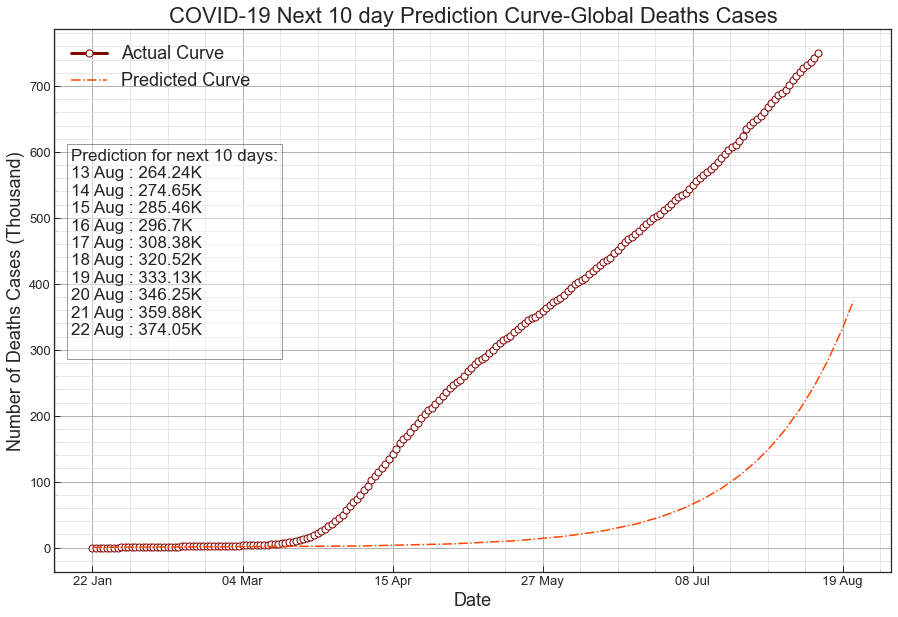

In [284]:
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))
# xnew = np.linspace(date.min(), date.max(), 10)
# spl = make_interp_spline(date, t, k=1)  # type: BSpline
# power_smooth = spl(xnew)

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/thousand,"-.",color="maroon",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/thousand,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-1)[0]/thousand)+"K\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=12)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 10 day Prediction Curve-Global Deaths Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Deaths Cases (Thousand)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.savefig(out+"Prediction Curve2.png")
plt.show()


In [ ]:
'''df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
df_deaths = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})
df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]

# Changing the conuntry names as required by pycountry_convert Lib
df_confirmed.loc[df_confirmed['country'] == "US", "country"] = "USA"
df_deaths.loc[df_deaths['country'] == "US", "country"] = "USA"
df_covid19.loc[df_covid19['country'] == "US", "country"] = "USA"
df_table.loc[df_table['Country_Region'] == "US", "Country_Region"] = "USA"
# df_recovered.loc[df_recovered['country'] == "US", "country"] = "USA"


df_confirmed.loc[df_confirmed['country'] == 'Korea, South', "country"] = 'South Korea'
df_deaths.loc[df_deaths['country'] == 'Korea, South', "country"] = 'South Korea'
df_covid19.loc[df_covid19['country'] == "Korea, South", "country"] = "South Korea"
df_table.loc[df_table['Country_Region'] == "Korea, South", "Country_Region"] = "South Korea"
# df_recovered.loc[df_recovered['country'] == 'Korea, South', "country"] = 'South Korea'

df_confirmed.loc[df_confirmed['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_deaths.loc[df_deaths['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_covid19.loc[df_covid19['country'] == "Taiwan*", "country"] = "Taiwan"
df_table.loc[df_table['Country_Region'] == "Taiwan*", "Country_Region"] = "Taiwan"
# df_recovered.loc[df_recovered['country'] == 'Taiwan*', "country"] = 'Taiwan'

df_confirmed.loc[df_confirmed['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Kinshasa)", "country"] = "Democratic Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Kinshasa)", "Country_Region"] = "Democratic Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_deaths.loc[df_deaths['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_covid19.loc[df_covid19['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_table.loc[df_table['Country_Region'] == "Cote d'Ivoire", "Country_Region"] = "Côte d'Ivoire"
# df_recovered.loc[df_recovered['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"

df_confirmed.loc[df_confirmed['country'] == "Reunion", "country"] = "Réunion"
df_deaths.loc[df_deaths['country'] == "Reunion", "country"] = "Réunion"
df_covid19.loc[df_covid19['country'] == "Reunion", "country"] = "Réunion"
df_table.loc[df_table['Country_Region'] == "Reunion", "Country_Region"] = "Réunion"
# df_recovered.loc[df_recovered['country'] == "Reunion", "country"] = "Réunion"

df_confirmed.loc[df_confirmed['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Brazzaville)", "country"] = "Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Brazzaville)", "Country_Region"] = "Republic of the Congo"
# df_recovered.loc[df_recovered['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'

df_confirmed.loc[df_confirmed['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_deaths.loc[df_deaths['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_covid19.loc[df_covid19['country'] == "Bahamas, The", "country"] = "Bahamas"
df_table.loc[df_table['Country_Region'] == "Bahamas, The", "Country_Region"] = "Bahamas"
# df_recovered.loc[df_recovered['country'] == 'Bahamas, The', "country"] = 'Bahamas'

df_confirmed.loc[df_confirmed['country'] == 'Gambia, The', "country"] = 'Gambia'
df_deaths.loc[df_deaths['country'] == 'Gambia, The', "country"] = 'Gambia'
df_covid19.loc[df_covid19['country'] == "Gambia, The", "country"] = "Gambia"
df_table.loc[df_table['Country_Region'] == "Gambia", "Country_Region"] = "Gambia"
# df_recovered.loc[df_recovered['country'] == 'Gambia, The', "country"] = 'Gambia''''

In [ ]:
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/08-12-2020.csv')
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/08-12-2020.csv')
apple_mobility = pd.read_csv('https://covid19-static.cdn-apple.com/covid19-mobility-data/2014HotfixDev11/v3/en-us/applemobilitytrends-2020-08-11.csv')


## Acknowledgement<a id="3"></a>

### Datasets in kaggle
* The number of cases: [Novel Corona Virus 2019 Dataset](https://www.kaggle.com/sudalairajkumar/novel-corona-virus-2019-dataset)
* Total population: [covid19-global-forecasting-locations-population](https://www.kaggle.com/dgrechka/covid19-global-forecasting-locations-population/metadata)
* Population pyramid: [Population Pyramid 2019](https://www.kaggle.com/hotessy/population-pyramid-2019)
* Mesaures in each country: [COVID-19 containment and mitigation measures](https://www.kaggle.com/paultimothymooney/covid19-containment-and-mitigation-measures)
* Measures in Italy: [COVID-19 Prevention in Italy](https://www.kaggle.com/marcoferrante/covid19-prevention-in-italy)

[COVID-19 dataset in Japan](https://www.kaggle.com/lisphilar/covid19-dataset-in-japan)
* The number of cases in Japan: PCR-tested, with/without symptoms, mild/severe, hospitalized or not etc.
* The number of cases at prefecture level: PCR-test, confirmed, discharged, fatal
* Basic information of each prefecture: Population, area, the number of beds

Data is from HP of Ministry of Health, Labour and Welefare, Japan:  
[Ministry of Health, Labour and Welefare HP (in Japanese)](https://www.mhlw.go.jp/)  
[Ministry of Health, Labour and Welefare HP (in English)](https://www.mhlw.go.jp/english/)  
[COVID-19 Japan 都道府県別 感染症病床数 (CC BY)](https://code4sabae.github.io/bedforinfection/)  
[Wikipedia](https://ja.wikipedia.org/wiki/)  

### Data provided by kagglers as a comment on this notebook
* The number of days persons of each age group usually go out provided by [Marco Ferrante](https://www.kaggle.com/marcoferrante)

### External resources
* Population pyramid: [PopulationPyramid.net](https://www.populationpyramid.net/) licensed under [Creative Commons license CC BY 3.0](https://creativecommons.org/licenses/by/3.0/)
* Movility report in Italy: [COVID-19 Mobility Monitoring project](https://covid19mm.github.io/) licenced under [Creative Commons license CC BY 4.0](https://creativecommons.org/licenses/by/4.0/)
* Movility reports: [Google: COVID-19 Community Mobility Reports](https://www.google.com/covid19/mobility/)
* Gomperz curve: [Jia, Lin, et al. "Prediction and analysis of Coronavirus Disease 2019." arXiv preprint arXiv:2003.05447 (2020).](https://arxiv.org/ftp/arxiv/papers/2003/2003.05447.pdf)

(In Japanese)
* Mobility: [Report of 1st survey by Ministry of Health, Labor and Welfare & LINE Corporation](https://www.mhlw.go.jp/stf/newpage_10695.html)  
* Mobility: [Detailed report of 1st survey by Ministry of Health, Labor and Welfare & LINE Corporation](https://www.mhlw.go.jp/stf/newpage_10798.html)
* @ClusterJapan (expert team to prevent COVID-19 outbreak in Japan) comments: [Twitter @ClusterJapan on 11Apr2020](https://twitter.com/ClusterJapan/status/1248884086581514242?s=20)
* Gomperz curve: [(In Japanese) ゴンペルツ曲線とは何か？（3）](https://qiita.com/BMJr/items/4e2782e8f1d3c1db6801)

### References and reading materials

#### Papers
* Basic reproduction number: [Van den Driessche, P., & Watmough, J. (2002).](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6002118/)
* Curve fitting with Logistic function and Gompertz function: [Jia, Lin, et al., 2020.](https://arxiv.org/ftp/arxiv/papers/2003/2003.05447.pdf)
* S-R place: [Balkew, Teshome Mogessie, "The SIR Model When S(t) is a Multi-Exponential Function." (2010).Electronic Theses and Dissertations.Paper 1747](https://dc.etsu.edu/cgi/viewcontent.cgi?article=3102&context=etd)
* Un-controlled clinical study of Remdesivir: [Grein, Jonathan, et al., 2020](https://www.nejm.org/doi/full/10.1056/NEJMoa2007016?query=RP)

#### KEGG
* KEGG DRUG DATABASE: [Remdesivir (USAN)](https://www.kegg.jp/dbget-bin/www_bget?dr:D11472)
* KEGG DRUG DATABASE: [Favipiravir (AVIGAN)](https://www.kegg.jp/dbget-bin/www_bget?dr:D09537)
* Medical package insert of AVIGAN (In Japanese): [KEGG database "AVIGAN"](https://www.kegg.jp/medicus-bin/japic_med?japic_code=00066852)

#### Kaggle
* COVID-19 data with SIR model: https://www.kaggle.com/lisphilar/covid-19-data-with-sir-model
* COVID-19 Case Study - Analysis, Viz & Comparisons: https://www.kaggle.com/tarunkr/covid-19-case-study-analysis-viz-comparisons/notebook
Curve fitting with Gamma PDF etc. by [Bill Holst](https://www.kaggle.com/wjholst). 
* [COVID-19 Growth Patterns in Critical Countries](https://www.kaggle.com/wjholst/covid-19-growth-patterns-in-critical-countries#Gaussian-Approximation-of-Active-Cases)
* [COVID-19 - Growth of Virus in Specific Countries](https://www.kaggle.com/wjholst/covid-19-growth-of-virus-in-specific-countries#Gaussian-Approximation-of-Active-Cases)
* [Prediction With a Gamma PDF](https://www.kaggle.com/wjholst/prediction-with-a-gamma-pdf)

#### YouTube
* Growth Factor: [YouTube "Exponential growth and epidemics"](https://www.youtube.com/watch?v=Kas0tIxDvrg)
* Physical distancing (social distancing): [YouTube "Simulating an epidemic"](https://www.youtube.com/watch?v=gxAaO2rsdIs)
* $\Delta$Confirmed vs. Confirmed plot: [YouTube: How To Tell If We're Beating COVID-19](https://www.youtube.com/watch?v=54XLXg4fYsc)

#### Other online resources
* Simple SIR model: [The SIR epidemic model](https://scipython.com/book/chapter-8-scipy/additional-examples/the-sir-epidemic-model/)
* SEIR model: [Introduction to SEIR model Models](http://indico.ictp.it/event/7960/session/3/contribution/19/material/slides/)
* Basic reproduction number: [Estimating the Impact of a Pathogen via Monte Carlo Simulation](https://towardsdatascience.com/infection-modeling-part-1-87e74645568a)
* RMSLE score: [What’s the Difference Between RMSE and RMSLE?](https://medium.com/analytics-vidhya/root-mean-square-log-error-rmse-vs-rmlse-935c6cc1802a)
